# Imports + Cleaning

In [1]:
import pandas as pd
import os
from analyzer import Analyzer
from preprocessor import RawDataPreprocessor

/Users/talos/git_new/cohortProject/env/lib/python3.6/site-packages/pandas/compat/__init__.py:120: UserWarning: Could not import the lzma module. Your installed Python is incomplete. Attempting to use lzma compression will result in a RuntimeError.
  warnings.warn(msg)


In [2]:
LOCAL_FOLDER = '~/git_new/cohortProject'

SPEND_DATA_FILE_NAME = 'spend.csv'
CUSTOMER_PAYMENT_DATA_FILE_NAME = 'customer_payments.csv'

In [3]:
spend_df = pd.read_csv(os.path.join(LOCAL_FOLDER, SPEND_DATA_FILE_NAME))
spend_df['cohort'] = pd.to_datetime(spend_df['cohort'])
spend_df

,cohort,performance_marketing,brand_marketing,spend
0,2022-10-01,9031046.0,1096991.0,10128037.0
1,2022-11-01,11596888.0,1278800.0,12875688.0
2,2022-12-01,13243267.0,1828263.0,15071530.0
3,2023-01-01,9729929.0,2261477.0,11991406.0
4,2023-02-01,11219374.0,6078453.0,17297827.0
5,2023-03-01,8187340.0,975358.0,9162698.0
6,2023-04-01,7235041.0,1350862.0,8585903.0
7,2023-05-01,5311298.0,1783073.0,7094371.0
8,2023-06-01,6057896.0,1458582.0,7516478.0
9,2023-07-01,6717583.0,1127770.0,7845353.0


In [4]:
raw_customer_payment_df = pd.read_csv(os.path.join(LOCAL_FOLDER, CUSTOMER_PAYMENT_DATA_FILE_NAME))
raw_customer_payment_df

,customer_id,payment_frequency,payment_date,amount
0,cus_100000239793164,monthly,2021-11-09,9.99
1,cus_100000239793164,monthly,2021-12-09,9.99
2,cus_100000239793164,monthly,2022-01-09,9.99
3,cus_100000239793164,monthly,2022-02-09,9.99
4,cus_100000239793164,monthly,2022-03-09,9.99
...,...,...,...,...
26116386,cus_999999458641460,quarterly,2023-06-21,24.99
26116387,cus_999999458641460,quarterly,2023-09-21,24.99
26116388,cus_999999458641460,quarterly,2023-12-21,24.99
26116389,cus_999999458641460,quarterly,2024-03-21,29.99


In [5]:
customer_payment_df = raw_customer_payment_df.copy()
customer_payment_df['payment_date'] = pd.to_datetime(customer_payment_df['payment_date'])

In [6]:
dp = RawDataPreprocessor(customer_payment_df, spend_df)

In [7]:
# We see that customer cus_657763319983990 has too many payments - we call this an outlier, will remove later
number_of_payments_per_customer = dp.get_number_of_payments_per_custoner()
number_of_payments_per_customer[number_of_payments_per_customer["num_payments"] > 39]

,customer_id,num_payments
0,cus_657763319983990,323


In [8]:
## We see that the last month of payments is incomplete - Will later remove the cohort and any payments during 2024-09
max_payment_date = dp.get_max_payment_date()    
min_payment_date = dp.get_min_payment_date()
print(f"max_payment_date: {max_payment_date}")
print(f"min_payment_date: {min_payment_date}")

max_payment_date: 2024-09-15 00:00:00
min_payment_date: 2021-07-01 00:00:00


In [9]:
# Customers only have one payment frequency (mentinoned in the assessment - double checking)
payment_frequency_count_per_customer = dp.get_payment_frequency_count_per_customer()
payment_frequency_count_per_customer.value_counts().describe()

count    3153018.0
mean           1.0
std            0.0
min            1.0
25%            1.0
50%            1.0
75%            1.0
max            1.0
dtype: float64

In [10]:
# We see that at most we have 28 days in each month (unlikely that a payment date never happened after the 28th day)
unique_payment_date_days = dp.get_unique_payment_date_days()
unique_payment_date_days.sort()
unique_payment_date_days

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28])

In [11]:
# Process the data and remove outliers - this may take a while to run
dp.remove_customers_with_only_zero_payments()
dp.add_cohort()
dp.add_payment_period()
dp.remove_incomplete_month_data(year=2024, month=9)
dp.remove_outlier_customer("cus_657763319983990")
dp.remove_incomplete_cohort_from_spend_data(cohort=pd.datetime(2024, 9, 1))  

In [12]:
# There are no payment gaps for monthly quarterly customers - When a monthly customer does not pay for a month they do not pay ever again. (takes a while to run)
quarterly_payment_gaps = dp.check_quarterly_payment_gaps()
quarterly_payment_gaps.value_counts()

customer_id          has_gaps
cus_999999458641460  False       1
cus_400269528153234  False       1
cus_400269903400502  False       1
cus_400270017663996  False       1
cus_400270412885578  False       1
                                ..
cus_700206286957538  False       1
cus_700206922840762  False       1
cus_700206996978570  False       1
cus_700207141363680  False       1
cus_100000864044865  False       1
Length: 1486157, dtype: int64

In [13]:
any(quarterly_payment_gaps["has_gaps"])

False

In [14]:
# There are no payment gaps for monthly customers - When a quartelry customer does not pay for a quarter they do not pay ever again. (takes a while to run)
monthly_payment_gaps = dp.check_monthly_payment_gaps()
monthly_payment_gaps.value_counts()

customer_id          has_gaps
cus_999996903268436  False       1
cus_39950489508599   False       1
cus_399506438371291  False       1
cus_39950843617289   False       1
cus_399508716386897  False       1
                                ..
cus_699488006347514  False       1
cus_699488387305803  False       1
cus_699488941562383  False       1
cus_699488993270201  False       1
cus_100000239793164  False       1
Length: 1605996, dtype: int64

In [15]:
any(monthly_payment_gaps["has_gaps"])

False

In [16]:
spend_df = dp.get_spend_data()
customer_payment_df = dp.get_payment_data()

# Structured Analysis

## Monthly and Quarterly Customers Together

In [17]:
az = Analyzer(customer_payment_df=customer_payment_df, spend_df=spend_df)

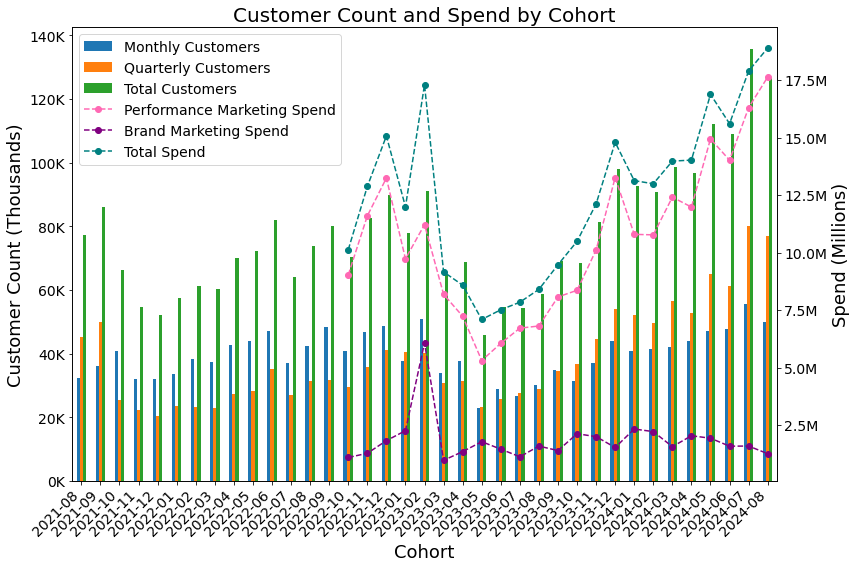

In [18]:
az.plot_customer_count_and_spend_by_cohort(min_cohort=pd.datetime(2021, 8, 1),
                                           title='Customer Count and Spend by Cohort',
                                           xlabel='Cohort',                            
                                           ylabel='Customer Count (Thousands)',
                                           fontsize=18)


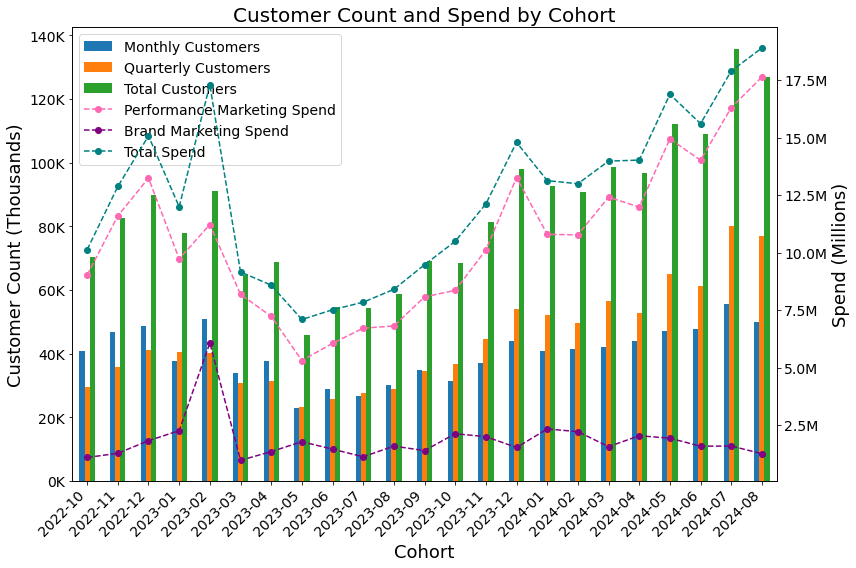

In [19]:
az.plot_customer_count_and_spend_by_cohort(
    min_cohort=az.first_cohort_with_spend, 
    title='Customer Count and Spend by Cohort',
    xlabel='Cohort',                            
    ylabel='Customer Count (Thousands)',
    fontsize=18
)

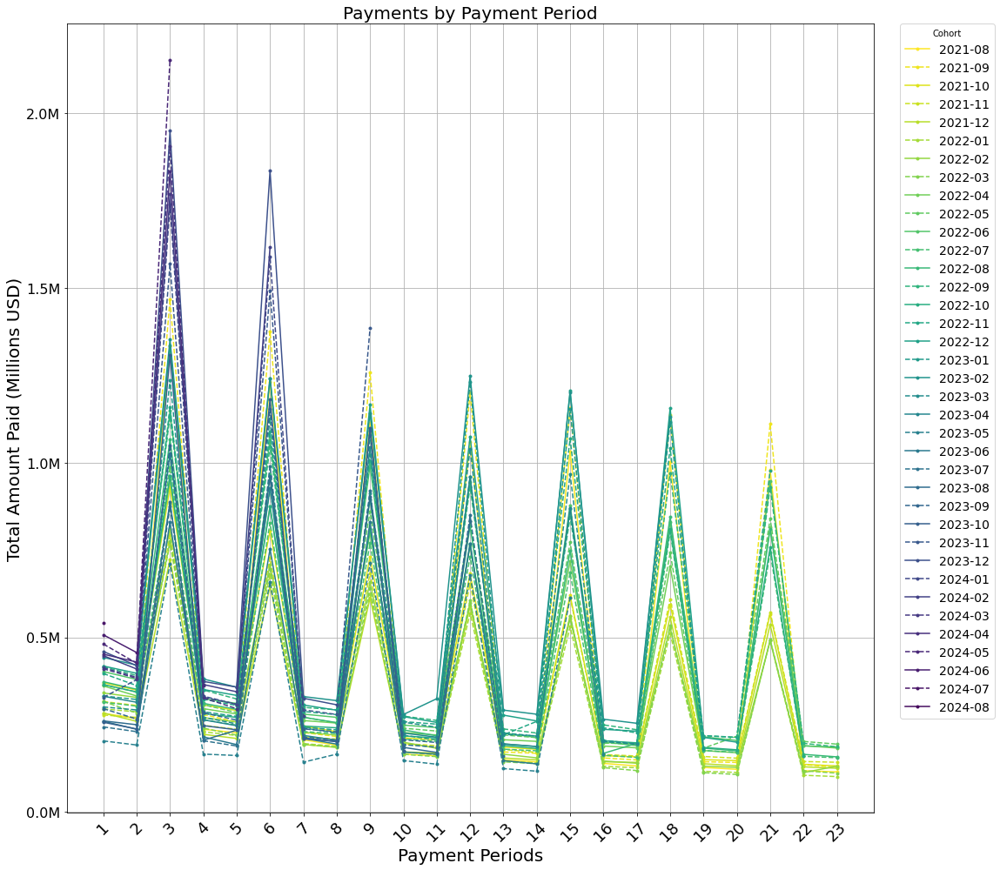

In [20]:
payments_by_payment_period = az.get_cohort_payments_by_payment_period(should_cumulate=False)

az.plot_wide_df(
    payments_by_payment_period.iloc[:, 1:24], 
    min_cohort=pd.datetime(2021, 8, 1),  # Start from August 2021 cohort exlcuding the one with unusual number of monthly customers
    add_legend=True,
    title="Payments by Payment Period", 
    x_label="Payment Periods", 
    y_label="Total Amount Paid (Millions USD)" , 
    font_size=20
)

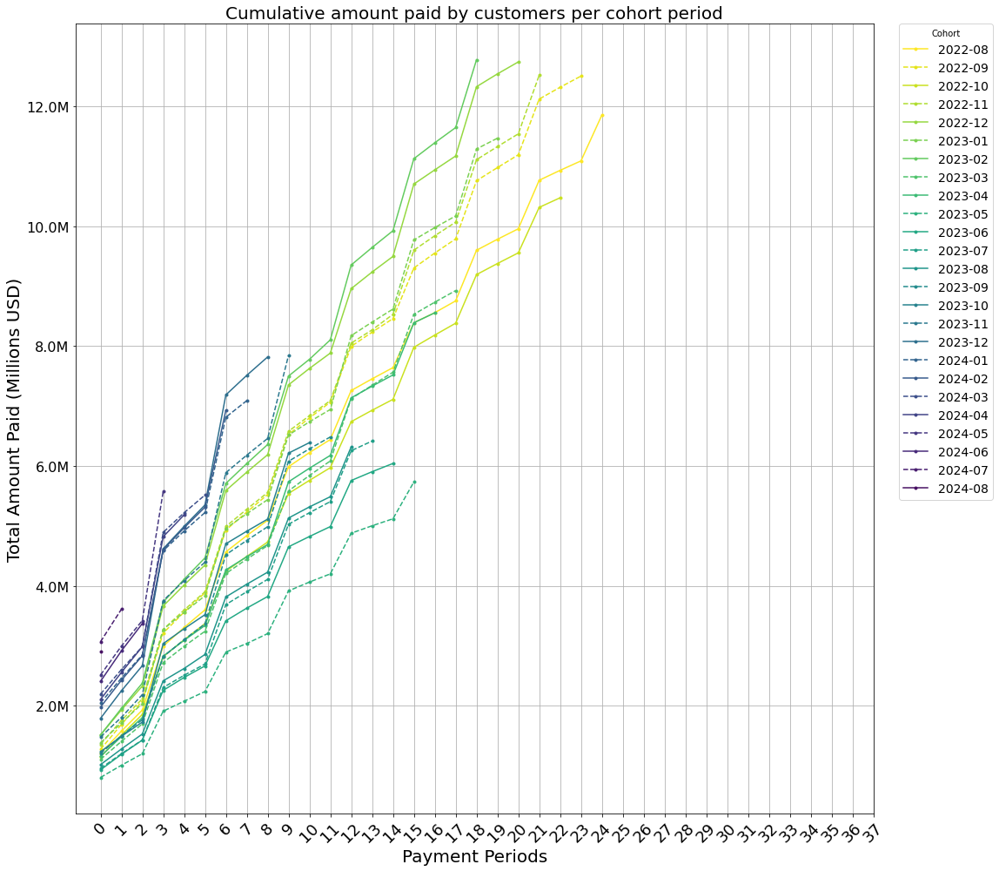

In [21]:
cum_payments_by_payment_period = az.get_cohort_payments_by_payment_period(should_cumulate=True)

az.plot_wide_df(
    cum_payments_by_payment_period, 
    min_cohort=pd.datetime(2022, 8, 1), # Start from August 2021 cohort exlcuding the one with unusual number of monthly customers
    title="Cumulative amount paid by customers per cohort period", 
    x_label="Payment Periods", 
    y_label="Total Amount Paid (Millions USD)" , 
    font_size=20
)

Note below that the worse performing cohort is the one that had the jump in the brand spend (2023-02) 
Same goes for only monthly and only quarterly analysis (as expected). A good limit on spend would be on brand spend (or in the ration brand spend / performance spend)

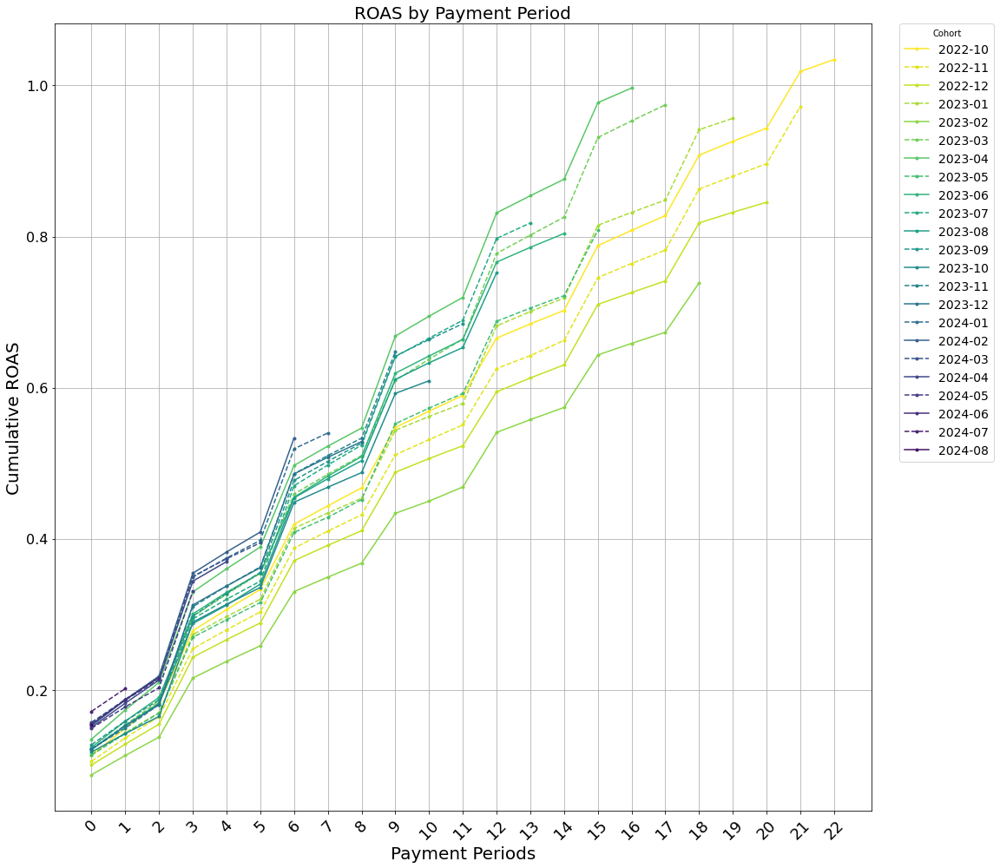

In [22]:
# Get ROAS data by payment period for each cohort
cumulative_roas = az.get_cohort_roas_by_payment_period()

az.plot_wide_df(
    cumulative_roas.iloc[:, :23],  
    min_cohort=pd.datetime(2022, 10, 1), 
    add_legend=True,  
    title="ROAS by Payment Period",  
    x_label="Payment Periods", 
    y_label="Cumulative ROAS",
    font_size=20
)

### Size Analysis 

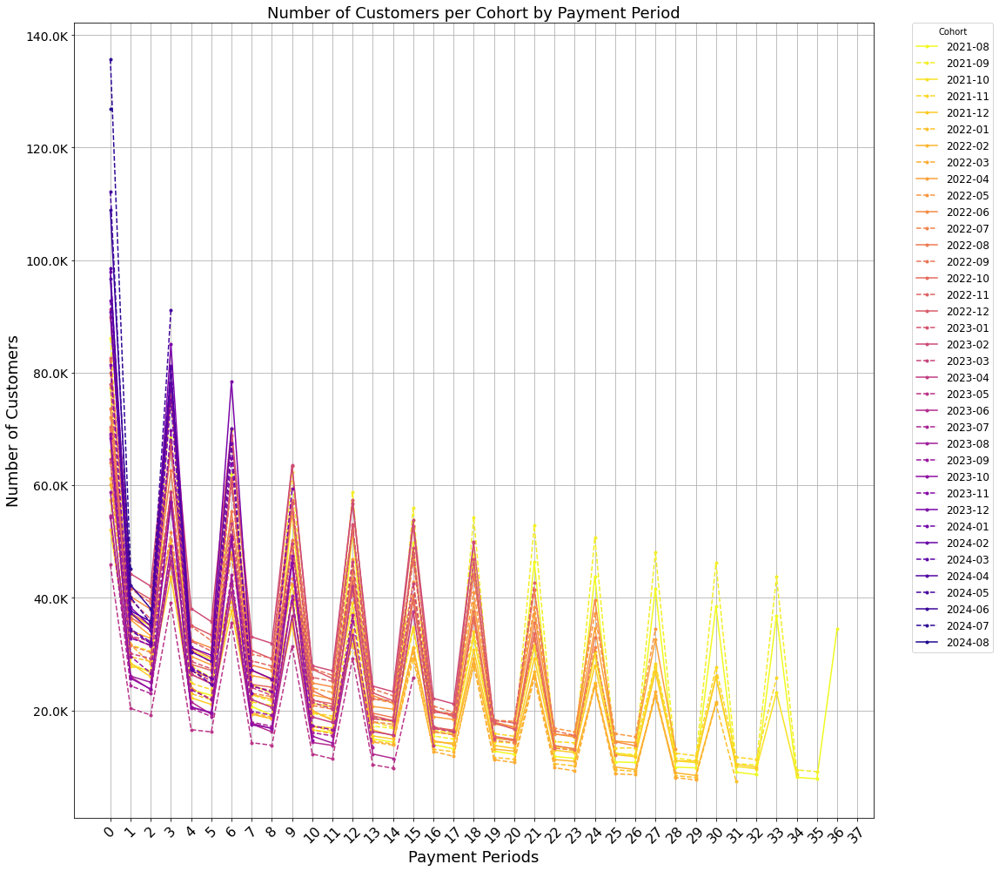

In [23]:
# Fetch cohort size by payment period (non-cumulative)
cohort_size_by_payment_period = az.get_cohort_size_by_payment_period(should_cumulate=False)

az.plot_wide_df(
    cohort_size_by_payment_period,  
    min_cohort=pd.datetime(2021, 8, 1),  # Start from August 2021 cohort exlcuding the one with unusual number of monthly customers
    add_legend=True, 
    title="Number of Customers per Cohort by Payment Period",  
    x_label="Payment Periods",  
    y_label="Number of Customers",
    font_size=18,
    colormap="plasma"
)

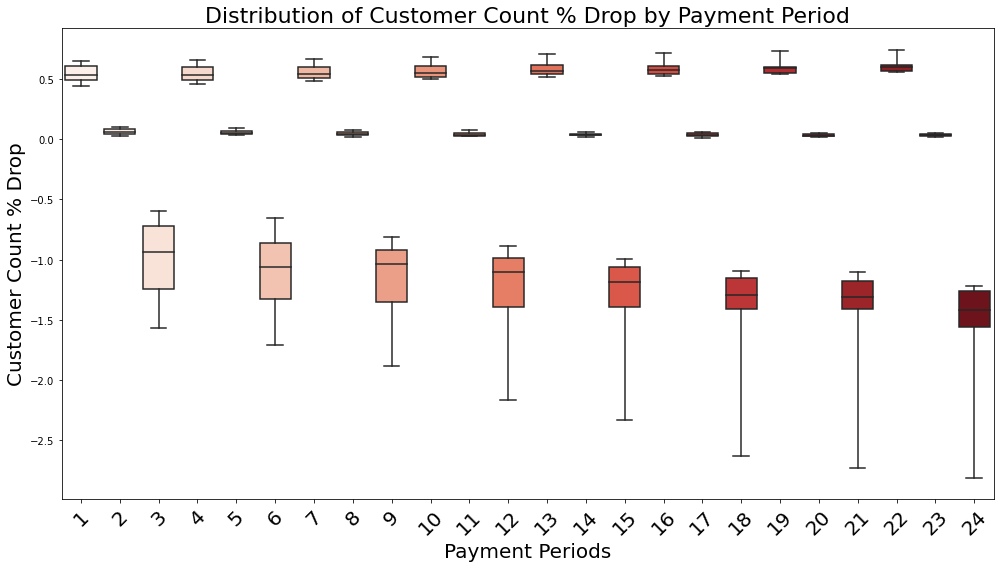

In [24]:
# Fetch cohort customer churn data by payment period for monthly customers
customer_churn = az.get_cohort_size_churns_by_payment_period()

az.boxplot(
    customer_churn.iloc[:, 1:25],  
    min_cohort=pd.datetime(2021, 8, 1),  
    showfliers=False, 
    x_label="Payment Periods", 
    y_label="Customer Count % Drop", 
    title="Distribution of Customer Count % Drop by Payment Period",  
    color_palette="Reds",  
    figsize=(14, 8), 
    font_size=20
)

## Fill in Missing spend

For the months that are missing spend data, we have calculated an estimate of the spend by using the historical average customer acquisition cost and multiplying by the size the corresponding cohorts 

In [25]:
az.fill_in_missing_spend()

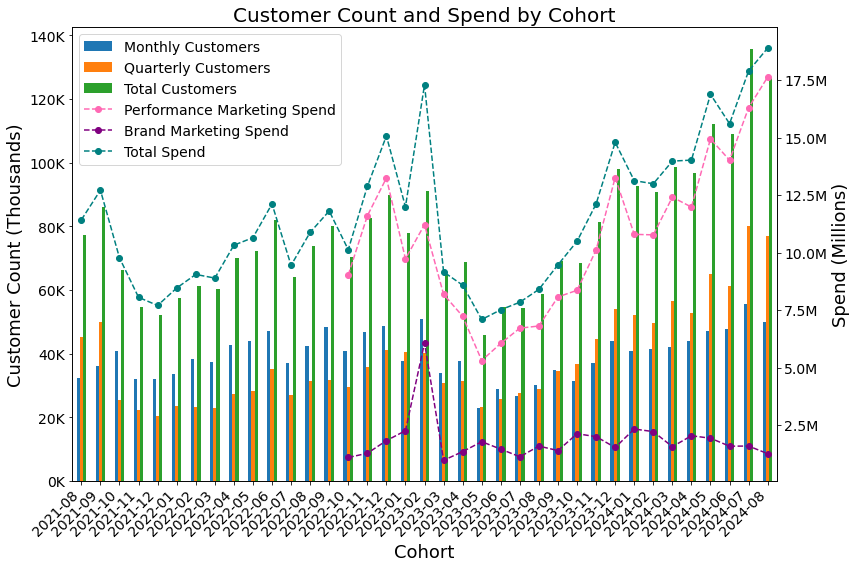

In [26]:
# Plot the customer count and spend by cohort after filling in missing spend data to see that our results maake sense
az.plot_customer_count_and_spend_by_cohort(min_cohort=pd.datetime(2021, 8, 1),
                                           title='Customer Count and Spend by Cohort',
                                           xlabel='Cohort',                            
                                           ylabel='Customer Count (Thousands)',
                                           fontsize=18)

We can also look at the performance of these cohorts to make sure nothing out of the oridnary took place 

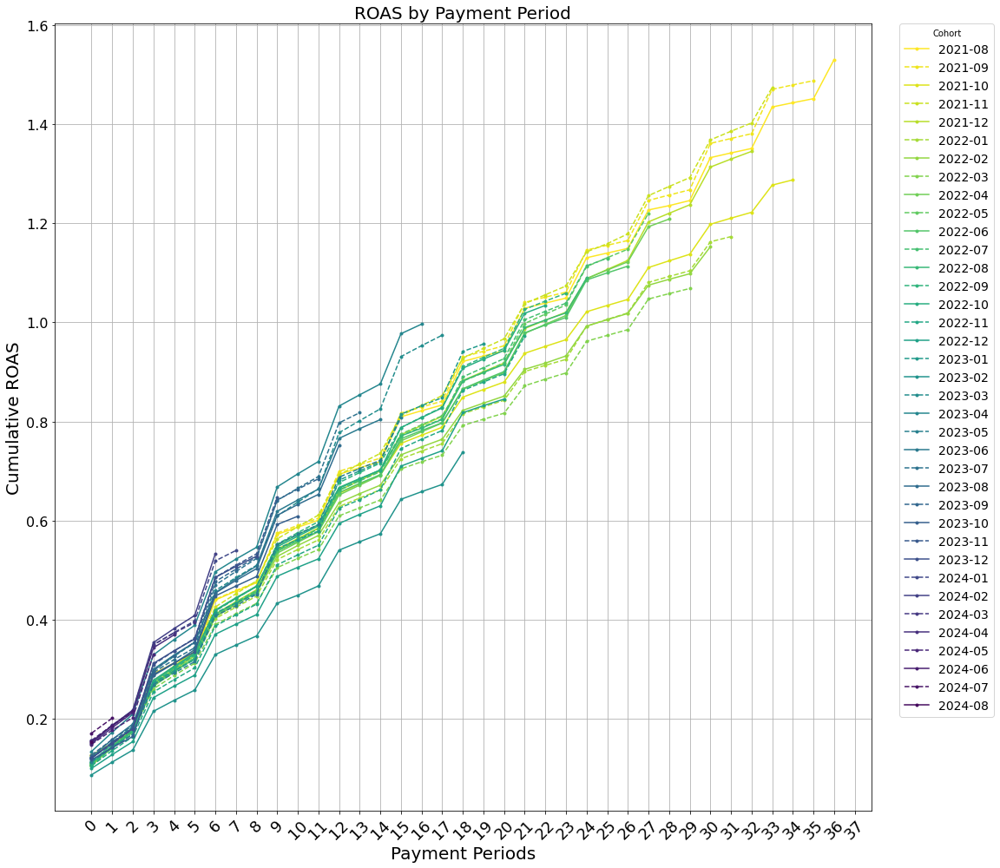

In [27]:
customer_roas_by_payment_period = az.get_cohort_roas_by_payment_period()
Analyzer.plot_wide_df(
    customer_roas_by_payment_period,
    min_cohort=pd.datetime(2021, 8, 1),
    add_legend=True,
    title="ROAS by Payment Period",
    x_label="Payment Periods",
    y_label="Cumulative ROAS",
    font_size=20
)

## Monthly Customers Only

In [28]:
az_monthly = Analyzer(customer_payment_df=customer_payment_df[customer_payment_df["payment_frequency"] == "monthly"], spend_df=spend_df)

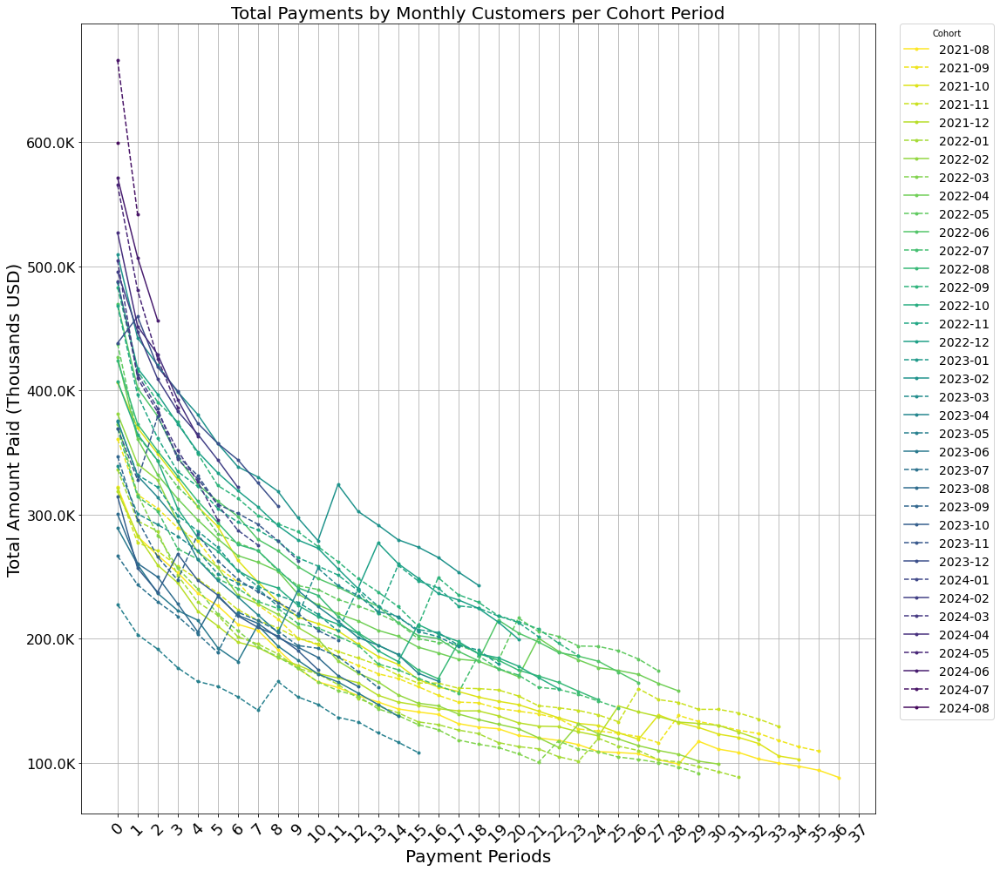

In [29]:
# Get payments by payment period for monthly customers
payments_by_payment_period = az_monthly.get_cohort_payments_by_payment_period(should_cumulate=False)

az_monthly.plot_wide_df(
    payments_by_payment_period,  
    min_cohort=pd.datetime(2021, 8, 1),  # Start from August 2021 cohort exlcuding the one with unusual number of monthly customers
    add_legend=True,  
    title="Total Payments by Monthly Customers per Cohort Period", 
    x_label="Payment Periods",  
    y_label="Total Amount Paid (Thousands USD)", 
    font_size=20
)

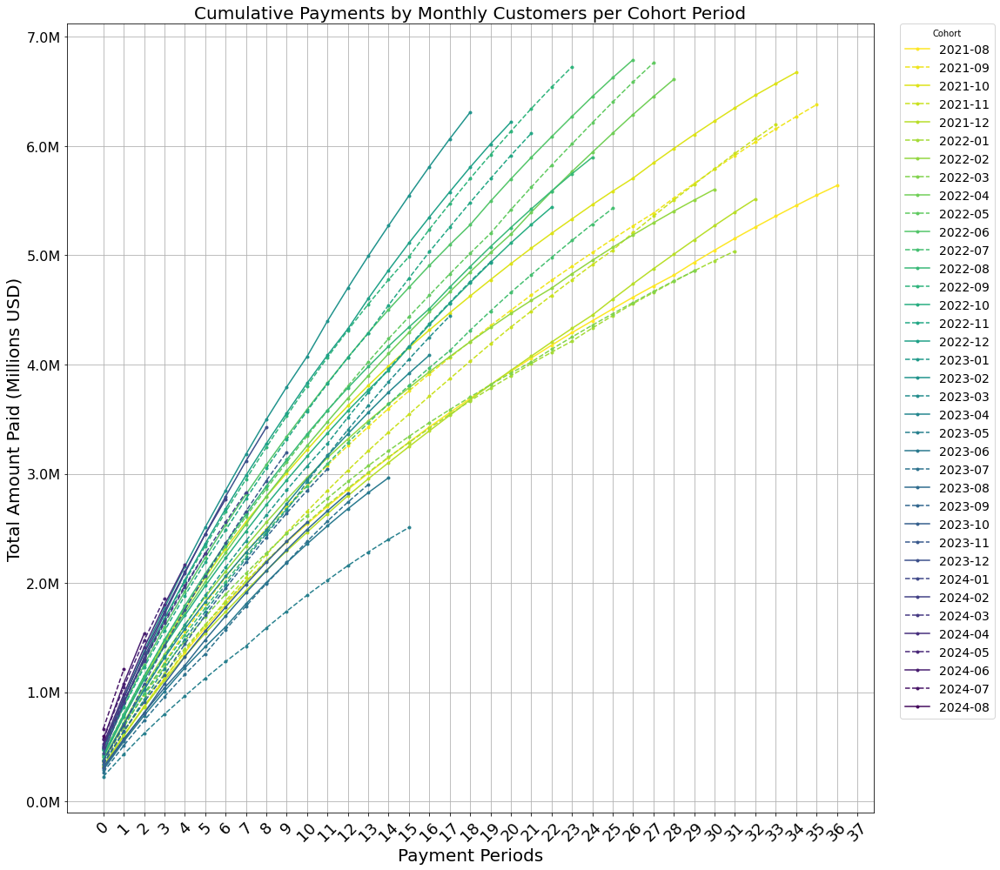

In [30]:
# Get cumulative payments by payment period for monthly customers
cum_payments_by_payment_period = az_monthly.get_cohort_payments_by_payment_period(should_cumulate=True)

az_monthly.plot_wide_df(
    cum_payments_by_payment_period,  
    min_cohort=pd.datetime(2021, 8, 1),  # Start from August 2021 cohort exlcuding the one with unusual number of monthly customers
    add_legend=True,  
    title="Cumulative Payments by Monthly Customers per Cohort Period",  
    x_label="Payment Periods",  
    y_label="Total Amount Paid (Millions USD)",
    font_size=20  
)

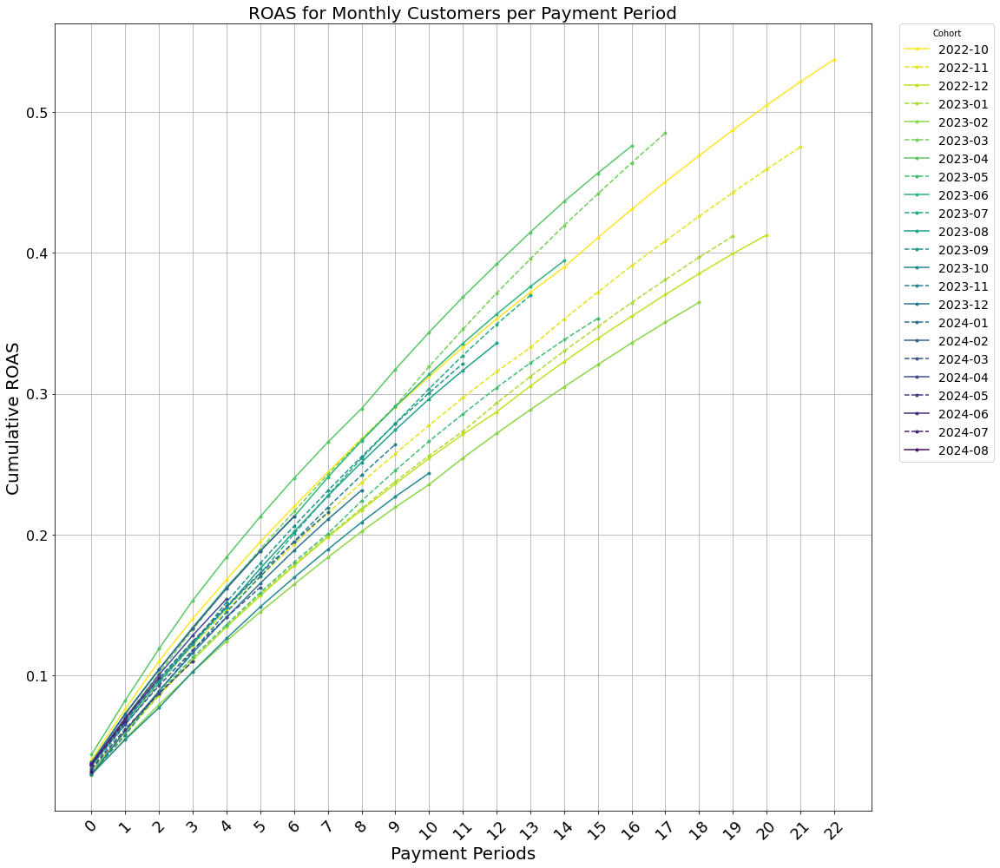

In [31]:
# Get cumulative ROAS by payment period for monthly customers
cumulative_roas = az_monthly.get_cohort_roas_by_payment_period()

az_monthly.plot_wide_df(
    cumulative_roas,  
    min_cohort=pd.datetime(2021, 8, 1),  # Start from August 2021 cohort exlcuding the one with unusual number of monthly customers
    add_legend=True,  
    title="ROAS for Monthly Customers per Payment Period",  
    x_label="Payment Periods", 
    y_label="Cumulative ROAS",  
    font_size=20  
)


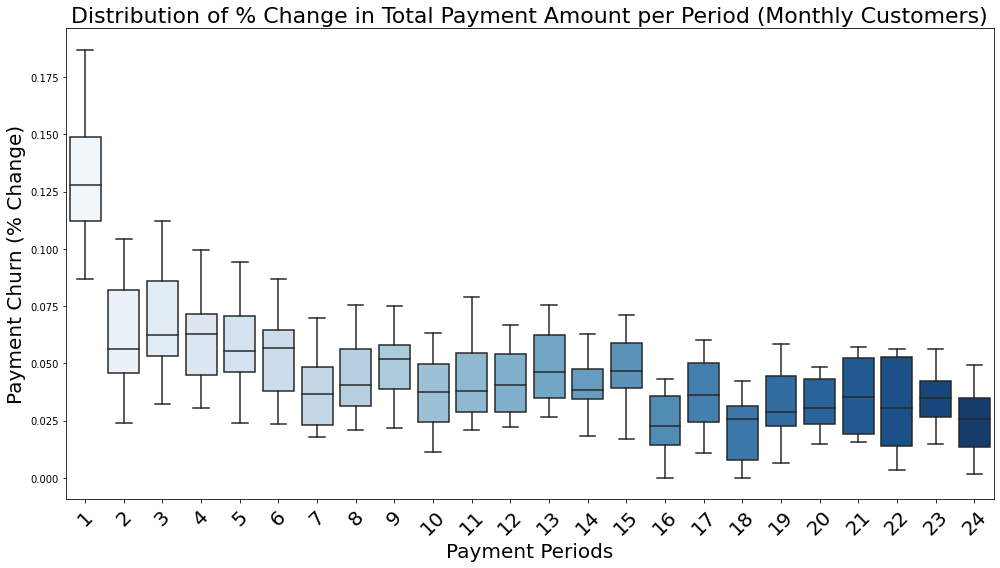

In [32]:
# Fetch payment churn data by cohort and payment period
payment_churns_month = az_monthly.get_cohort_payment_churns_by_payment_period()

az_monthly.boxplot(
    payment_churns_month.iloc[:, 1:25], 
    min_cohort=pd.datetime(2021, 8, 1),  # Start from August 2021 cohort exlcuding the one with unusual number of monthly customers
    showfliers=False, 
    x_label="Payment Periods",  
    y_label="Payment Churn (% Change)", 
    title="Distribution of % Change in Total Payment Amount per Period (Monthly Customers)",  
    color_palette="Blues",  
    figsize=(14, 8),  
    font_size=20  
)

### Cohort Size Analysis
This is primarily done because we won't see the big jumps that we saw before due to the price increase. I think this is better for modeling churns

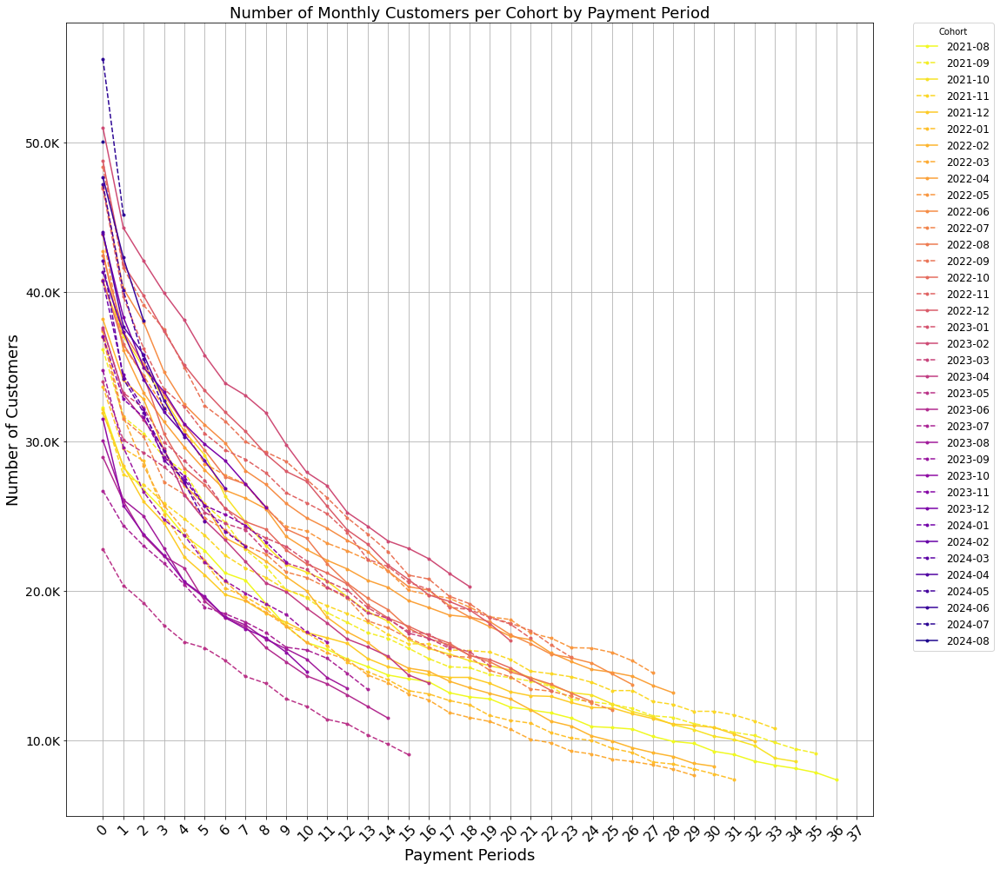

In [33]:
# Fetch cohort size by payment period for monthly customers (non-cumulative)
cohort_size_by_payment_period = az_monthly.get_cohort_size_by_payment_period(should_cumulate=False)

az_monthly.plot_wide_df(
    cohort_size_by_payment_period, 
    min_cohort=pd.datetime(2021, 8, 1),  
    add_legend=True, 
    title="Number of Monthly Customers per Cohort by Payment Period",  
    x_label="Payment Periods", 
    y_label="Number of Customers", 
    font_size=18,
    colormap="plasma"
)

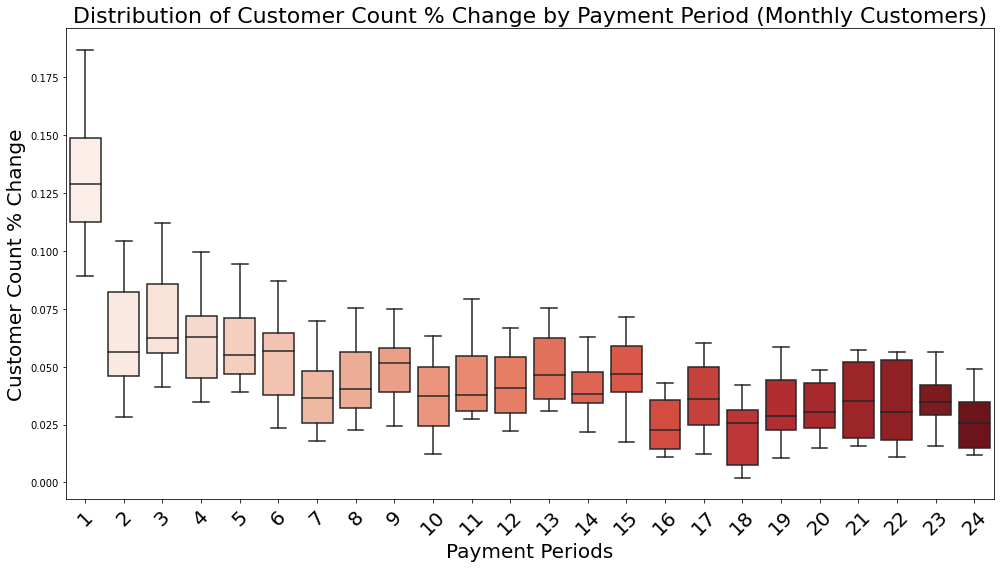

In [34]:
# Fetch cohort customer churn data by payment period for monthly customers
customer_churn_monthly = az_monthly.get_cohort_size_churns_by_payment_period()

az_monthly.boxplot(
    customer_churn_monthly.iloc[:, 1:25],  
    min_cohort=pd.datetime(2021, 8, 1), # Start from August 2021 cohort exlcuding the one with unusual number of monthly customers
    showfliers=False,  
    x_label="Payment Periods",  
    y_label="Customer Count % Change",  
    title="Distribution of Customer Count % Change by Payment Period (Monthly Customers)", 
    color_palette="Reds",  
    figsize=(14, 8),  
    font_size=20  
)

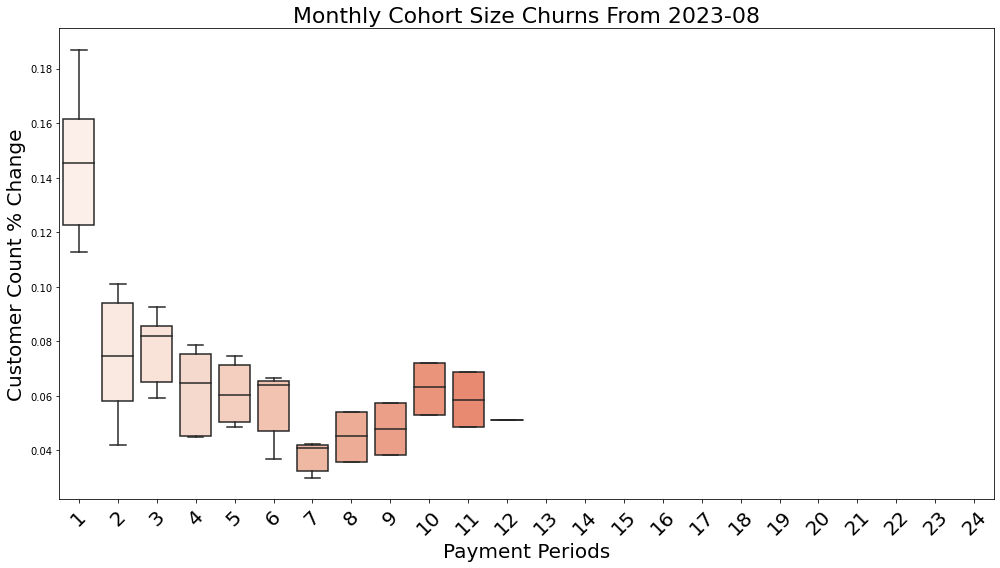

In [35]:
# Plot the cohort customer churn data (percentage change) from 2023-08 onwards (last 12 months)
az_monthly.boxplot(
    customer_churn_monthly.iloc[:, 1:25], 
    min_cohort=pd.datetime(2023, 8, 1), 
    showfliers=False,  
    x_label="Payment Periods", 
    y_label="Customer Count % Change",  
    title="Monthly Cohort Size Churns From 2023-08",  
    color_palette="Reds",  
    figsize=(14, 8),  
    font_size=20  
)

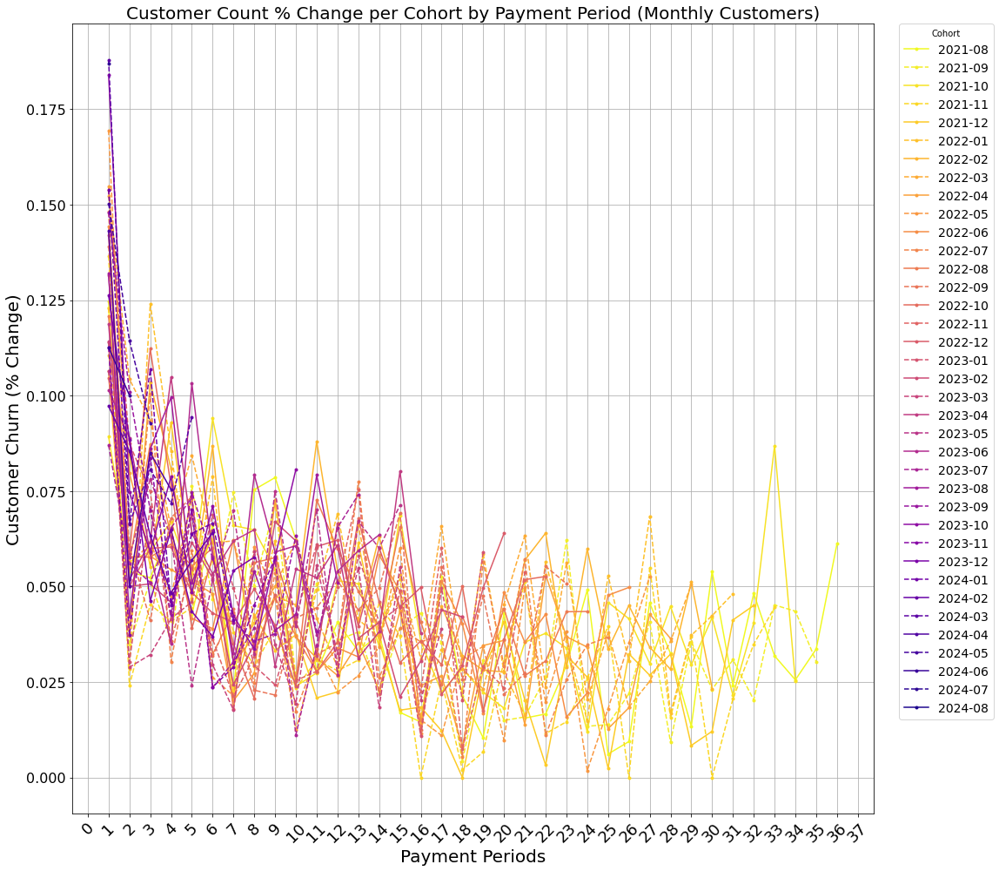

In [36]:
# Plot the customer churn (percentage change) 
az_monthly.plot_wide_df(
    customer_churn_monthly, 
    min_cohort=pd.datetime(2021, 8, 1),  # Start from August 2021 cohort exlcuding the one with unusual number of monthly customers
    add_legend=True,  
    title="Customer Count % Change per Cohort by Payment Period (Monthly Customers)",  
    x_label="Payment Periods",  
    y_label="Customer Churn (% Change)", 
    font_size=20,
    colormap="plasma"
)

#### Effect of Subscription Increase on Monthly Customers

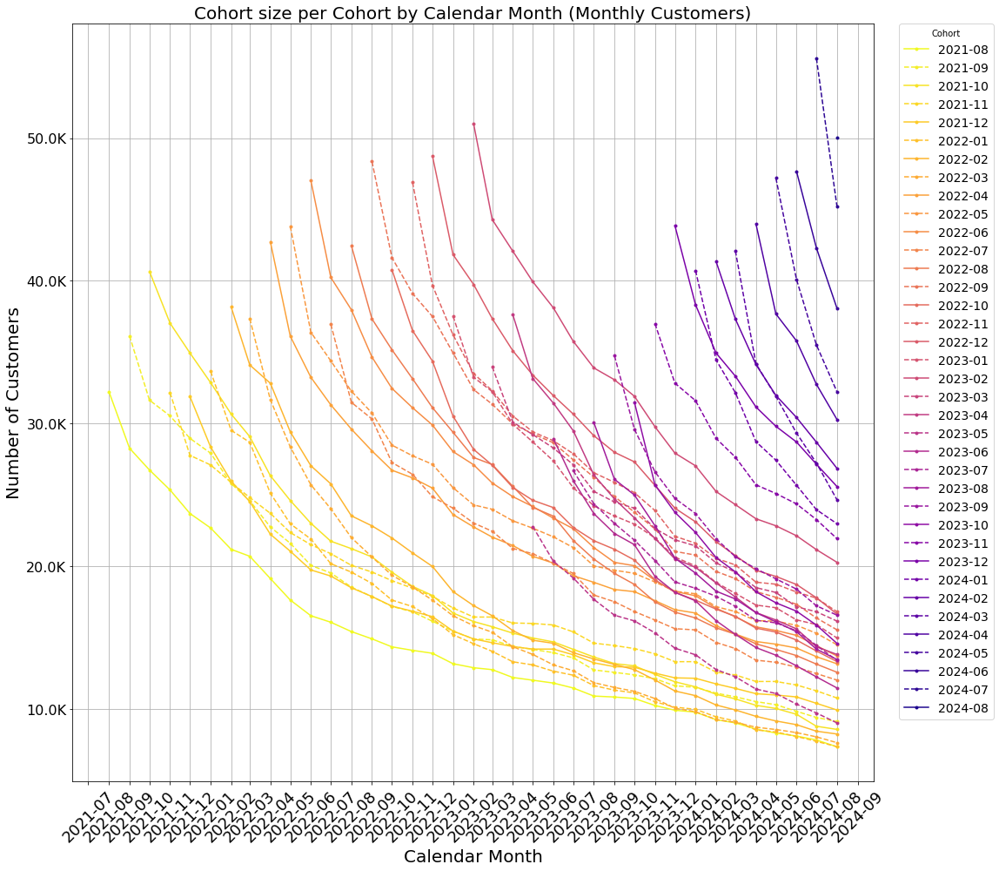

In [37]:
cohort_size_by_payment_period = az_monthly.get_cohort_size_by_payment_period(should_cumulate=False) 
# Convert to calendar dataframe with calendar months as columns
cohort_size_by_calendar_month = az_monthly.roll_wide_to_cal_wide(cohort_size_by_payment_period) 

az_monthly.plot_wide_df(
    cohort_size_by_calendar_month,  #
    min_cohort=pd.datetime(2021, 8, 1),  # Start from August 2021 cohort exlcuding the one with unusual number of monthly customers
    add_legend=True,  
    title="Cohort size per Cohort by Calendar Month (Monthly Customers)",  
    x_label="Calendar Month",  
    y_label="Number of Customers", 
    font_size=20,
    colormap="plasma"
)

This plot is here to show that the increase in price on 2024-01 does not really effect our cohorts. The ones that already exist. 
Read the variable names to get a better idea of whats happeening but basically we cented the data and plot them in the calendar form 
We would expect to see a big drop across cohorts starting (and especially at) the month 2024-01 when the subscription increased. 
We don't really see that which is good news. Note - Centering is done to reduce the effect of the payment period in the decrease of the payment - more on this in notes

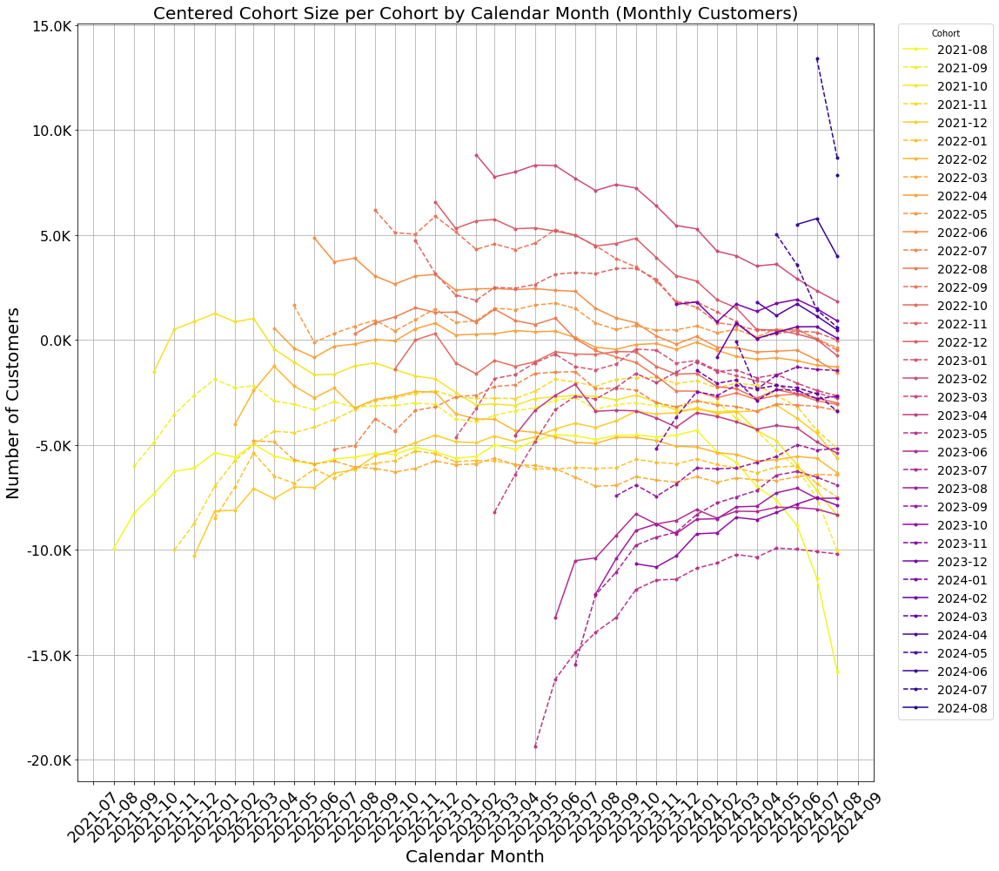

In [38]:
cohort_size_by_payment_period = az_monthly.get_cohort_size_by_payment_period(should_cumulate=False) 
centered_cohort_size_by_payment_period = Analyzer.center_df_by_col_mean(cohort_size_by_payment_period)
centered_cohort_size_by_calendar_period = Analyzer.roll_wide_to_cal_wide(centered_cohort_size_by_payment_period)

Analyzer.plot_wide_df(
    centered_cohort_size_by_calendar_period, 
    min_cohort=pd.datetime(2021, 8, 1),  # Start from August 2021 cohort exlcuding the one with unusual number of monthly customers
    add_legend=True,  
    title="Centered Cohort Size per Cohort by Calendar Month (Monthly Customers)",  
    x_label="Calendar Month", 
    y_label="Number of Customers", 
    font_size=20,
    colormap="plasma"
)

## Quarterly Customers Only

In [39]:
az_quarterly = Analyzer(customer_payment_df=customer_payment_df[customer_payment_df["payment_frequency"] == "quarterly"], spend_df=spend_df)

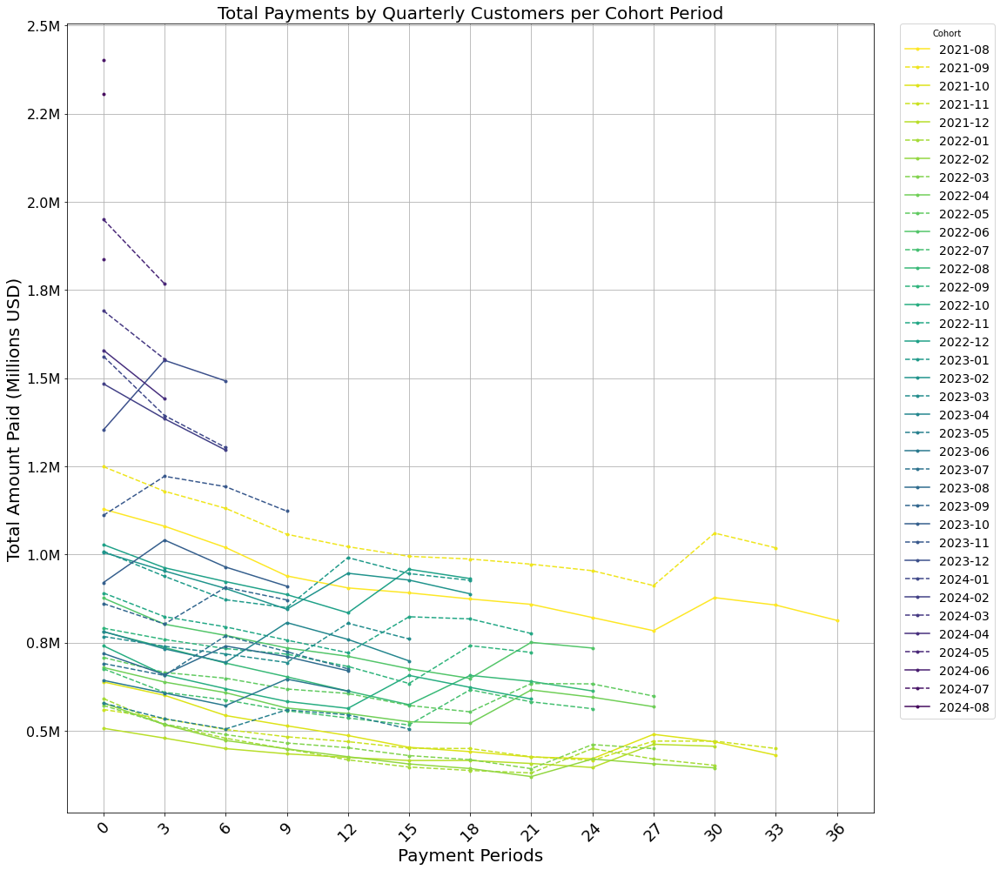

In [40]:
# Get payments by payment period for monthly customers
payments_by_payment_period = az_quarterly.get_cohort_payments_by_payment_period(should_cumulate=False)

az_quarterly.plot_wide_df(
    payments_by_payment_period,  
    min_cohort=pd.datetime(2021, 8, 1),  # Start from August 2021 cohort exlcuding the one with unusual number of monthly customers
    add_legend=True,  # Add the legend
    title="Total Payments by Quarterly Customers per Cohort Period",  
    x_label="Payment Periods",  
    y_label="Total Amount Paid (Millions USD)", 
    font_size=20
)

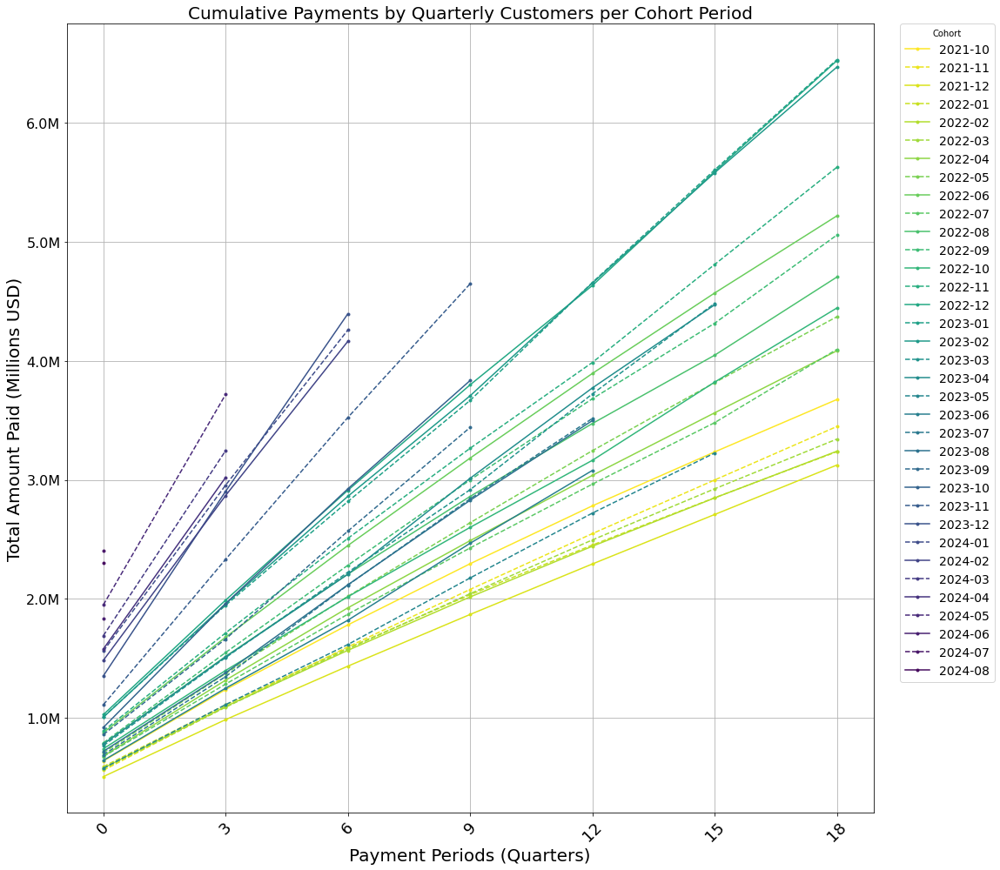

In [41]:
# Fetch cumulative payments by payment period for quarterly customers
cum_payments_by_payment_period = az_quarterly.get_cohort_payments_by_payment_period(should_cumulate=True)

az_quarterly.plot_wide_df(
    cum_payments_by_payment_period.iloc[:, :7],  
    add_legend=True,  
    min_cohort=pd.to_datetime("2021-10-01"),  
    title="Cumulative Payments by Quarterly Customers per Cohort Period", 
    x_label="Payment Periods (Quarters)", 
    y_label="Total Amount Paid (Millions USD)", 
    font_size=20 
)


Again wee see how the 2023-02 cohort is bad (the one with the higher brand spend). Maybe even remove it when calculating churns? 

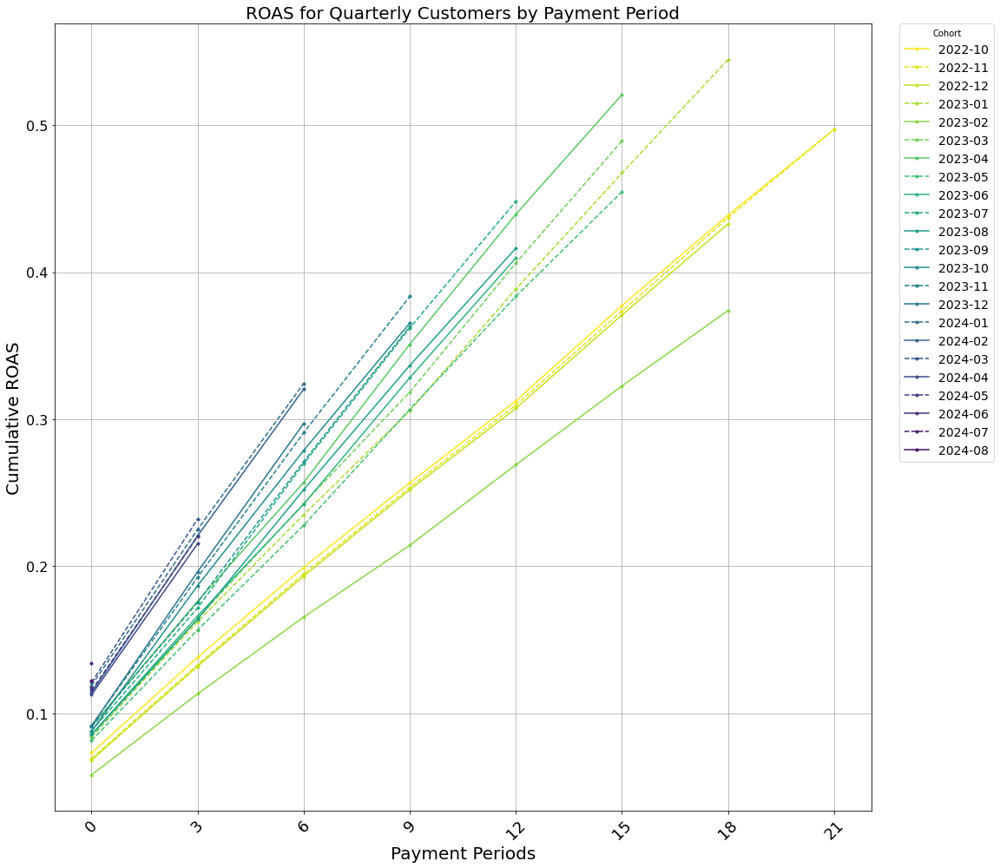

In [42]:
# Fetch cumulative ROAS by payment period for quarterly customers
cumulative_roas = az_quarterly.get_cohort_roas_by_payment_period()


az_quarterly.plot_wide_df(
    cumulative_roas, 
    min_cohort=None,  
    add_legend=True, 
    title="ROAS for Quarterly Customers by Payment Period", 
    x_label="Payment Periods",  
    y_label="Cumulative ROAS",  
    font_size=20  
)

negative payment churns -> effect of subscription increase

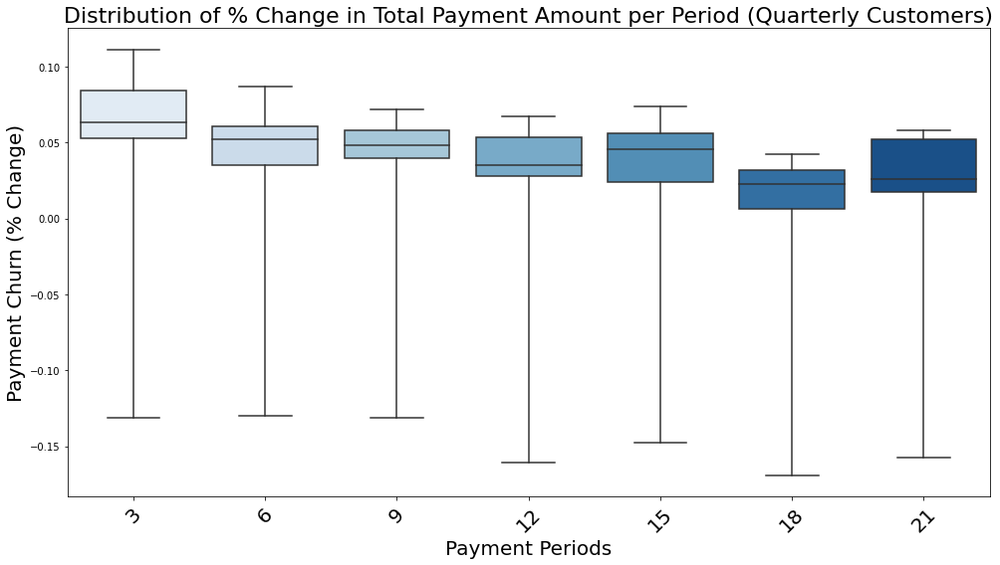

In [43]:
# Fetch payment churn data by cohort and payment period
payment_churns_quarter = az_quarterly.get_cohort_payment_churns_by_payment_period()

az_quarterly.boxplot(
    payment_churns_quarter.iloc[:, 1:8], 
    min_cohort=None, 
    showfliers=False,  
    x_label="Payment Periods", 
    y_label="Payment Churn (% Change)", 
    title="Distribution of % Change in Total Payment Amount per Period (Quarterly Customers)",  
    color_palette="Blues", 
    figsize=(14, 8),  
    font_size=20  
)

### Cohort Size Analysis

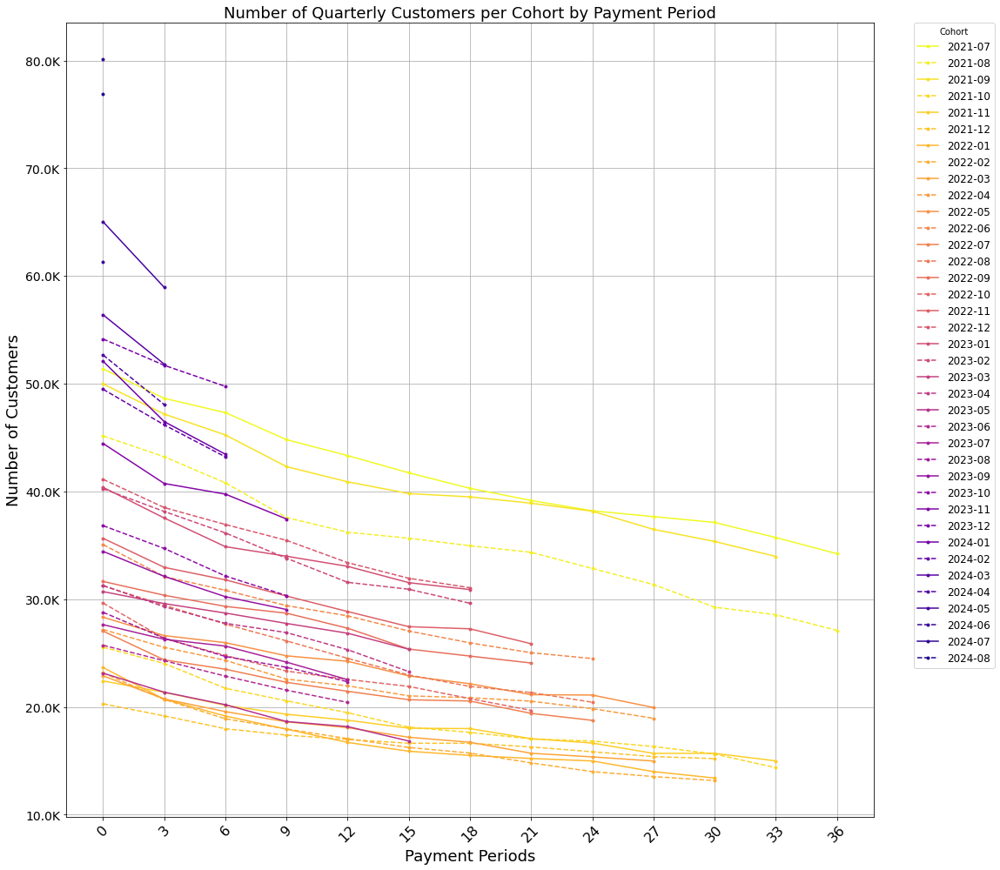

In [44]:
# Fetch cohort size by payment period for monthly customers (non-cumulative)
cohort_size_quarterly = az_quarterly.get_cohort_size_by_payment_period(should_cumulate=False)

az_quarterly.plot_wide_df(
    cohort_size_quarterly,  
    min_cohort=None,  
    add_legend=True,  
    title="Number of Quarterly Customers per Cohort by Payment Period", 
    x_label="Payment Periods",  
    y_label="Number of Customers",  
    font_size=18,
    colormap="plasma"
)

see how churns are only positive now (Because there is no effect of increase in price)

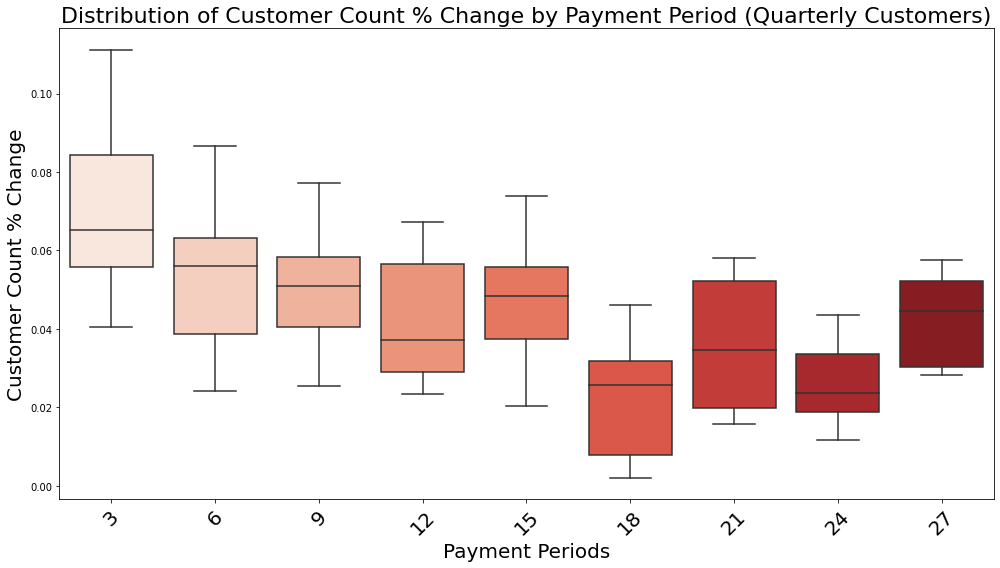

In [45]:
# Fetch cohort customer churn data by payment period for monthly customers
customer_churn_quarterly = az_quarterly.get_cohort_size_churns_by_payment_period()

az_monthly.boxplot(
    customer_churn_quarterly.iloc[:, 1:10], 
    min_cohort=pd.datetime(2021, 8, 1),  # Start from August 2021 cohort exlcuding the one with unusual number of monthly customers
    showfliers=False,  
    x_label="Payment Periods",  
    y_label="Customer Count % Change",  
    title="Distribution of Customer Count % Change by Payment Period (Quarterly Customers)",  
    color_palette="Reds",  
    figsize=(14, 8),  
    font_size=20  
)

Churns are very low from the beginning and decrease a litle before becoming more constant - 
From what I can tell the ranges of the churns per period are smaller when compared to the monthly ones. 

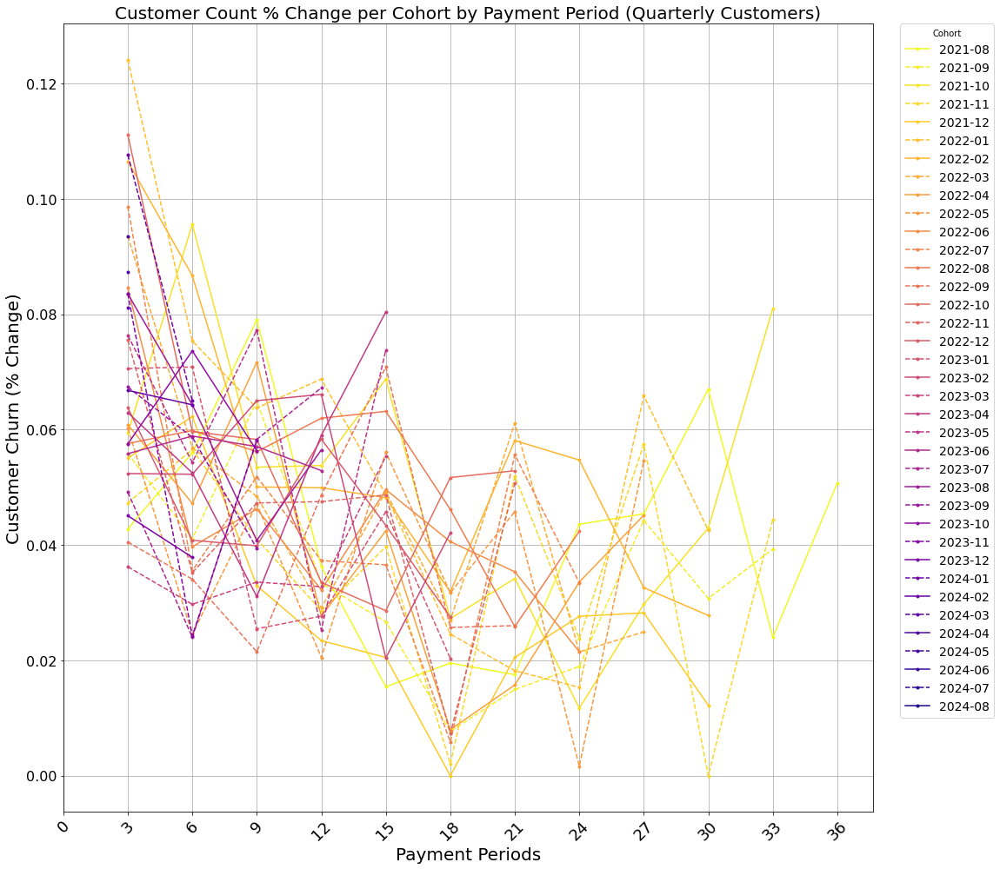

In [46]:

az_quarterly.plot_wide_df(
    customer_churn_quarterly,  
    min_cohort=pd.datetime(2021, 8, 1), 
    add_legend=True,  
    title="Customer Count % Change per Cohort by Payment Period (Quarterly Customers)",  
    x_label="Payment Periods", 
    y_label="Customer Churn (% Change)",  
    font_size=20,
    colormap="plasma"
)

#### Effect of Subscription Increase on Quarterly Customers

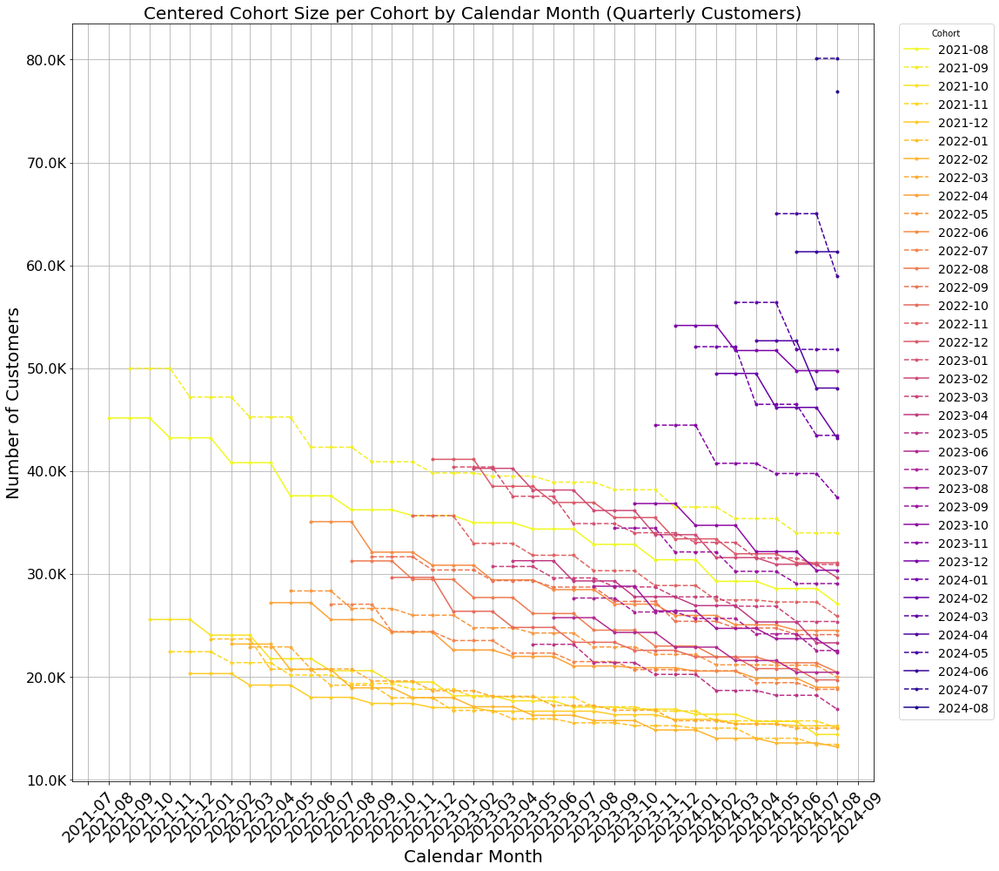

In [47]:
# same analysis as for monthly here
cohort_size_by_payment_period = az_quarterly.get_cohort_size_by_payment_period(should_cumulate=False) 
cohort_size_by_calendar_month = az_quarterly.roll_wide_to_cal_wide(cohort_size_by_payment_period) 

az_quarterly.plot_wide_df(
    cohort_size_by_calendar_month, 
    min_cohort=pd.datetime(2021, 8, 1), # Start from August 2021 cohort exlcuding the one with unusual number of monthly customers
    add_legend=True,  
    title="Centered Cohort Size per Cohort by Calendar Month (Quarterly Customers)",  
    x_label="Calendar Month",  
    y_label="Number of Customers",
    font_size=20,
    colormap="plasma"
)

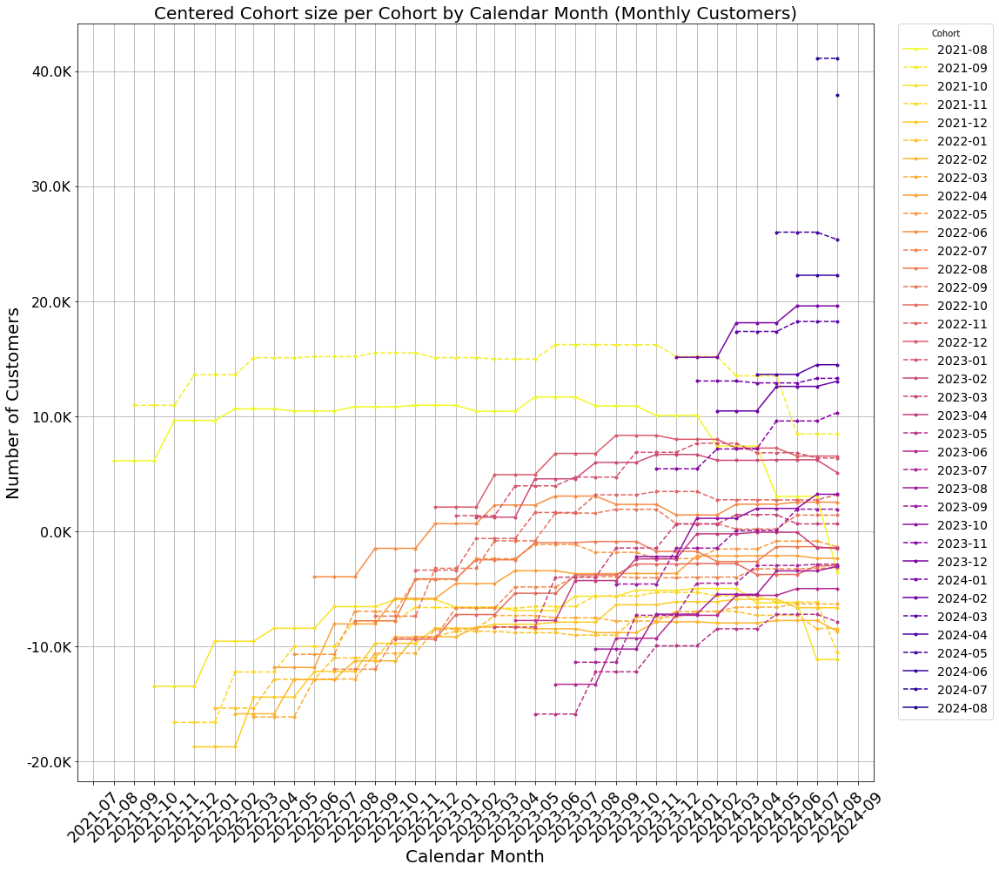

In [48]:
cohort_size_by_payment_period = az_quarterly.get_cohort_size_by_payment_period(should_cumulate=False) 
centered_cohort_size_by_payment_period = Analyzer.center_df_by_col_mean(cohort_size_by_payment_period)
centered_cohort_size_by_calendar_period = Analyzer.roll_wide_to_cal_wide(centered_cohort_size_by_payment_period)

Analyzer.plot_wide_df(
    centered_cohort_size_by_calendar_period, 
    min_cohort=pd.datetime(2021, 8, 1),  # Start from August 2021 cohort
    add_legend=True,  # Add the legend
    title="Centered Cohort size per Cohort by Calendar Month (Monthly Customers)",  # Updated title
    x_label="Calendar Month",  # X-axis label
    y_label="Number of Customers",  # Y-axis label to reflect percentage change
    font_size=20,
    colormap="plasma"
)

# Ad hoc Analysis

### Explored Kaplan-Meier Survival Model for Churn Selection

We will only showcse results for monthly customers

In [49]:
# Create a Kaplan-Meier DataFrames for monthly and quarterly customers

def create_kaplan_meier_df(df):
    """
    Creates columns T and E for the Kaplan-Meier analysis

    T (Time): This represents the duration or time until the event of interest occurs (e.g., customer churn). 
    E (Event Indicator): This is a binary variable indicating whether the event of interest (e.g., churn) has occurred.
    """
    df["max_payment_date"] = df.groupby("customer_id")["payment_date"].transform("max")
    df = df[df["payment_date"] == df["max_payment_date"]]
    df["T"] = df["payment_period"] + 1
    df["E"] = 1 

    # If the max payment date is after 2024-08-01, set E to 0 becaause the monthly customer has not churned yet since 2024-08 is the last month of processed data
    df.loc[df["max_payment_date"] >= pd.datetime(2024, 8, 1), "E"] = 0 
    return df

customer_payment_df = az.customer_payment_df.copy()
monthly_data = customer_payment_df[customer_payment_df["payment_frequency"] == "monthly"]
monthly_kaplan = create_kaplan_meier_df(monthly_data)

/Users/talos/git_new/cohortProject/env/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/Users/talos/git_new/cohortProject/env/lib/python3.6/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/Users/talos/git_new/cohortProject/env/lib/python3.6/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a

Fit model for Monthly customers

In [50]:
from lifelines import KaplanMeierFitter
import matplotlib.pyplot as plt

kmf = KaplanMeierFitter()
# Fit the model to the data
kmf.fit(monthly_kaplan['T'], event_observed=monthly_kaplan['E'])
# Fit the model to the data
kmf.fit(monthly_kaplan['T'], event_observed=monthly_kaplan['E'])

<lifelines.KaplanMeierFitter:"KM_estimate", fitted with 1.6026e+06 total observations, 696803 right-censored observations>

<AxesSubplot:xlabel='timeline'>

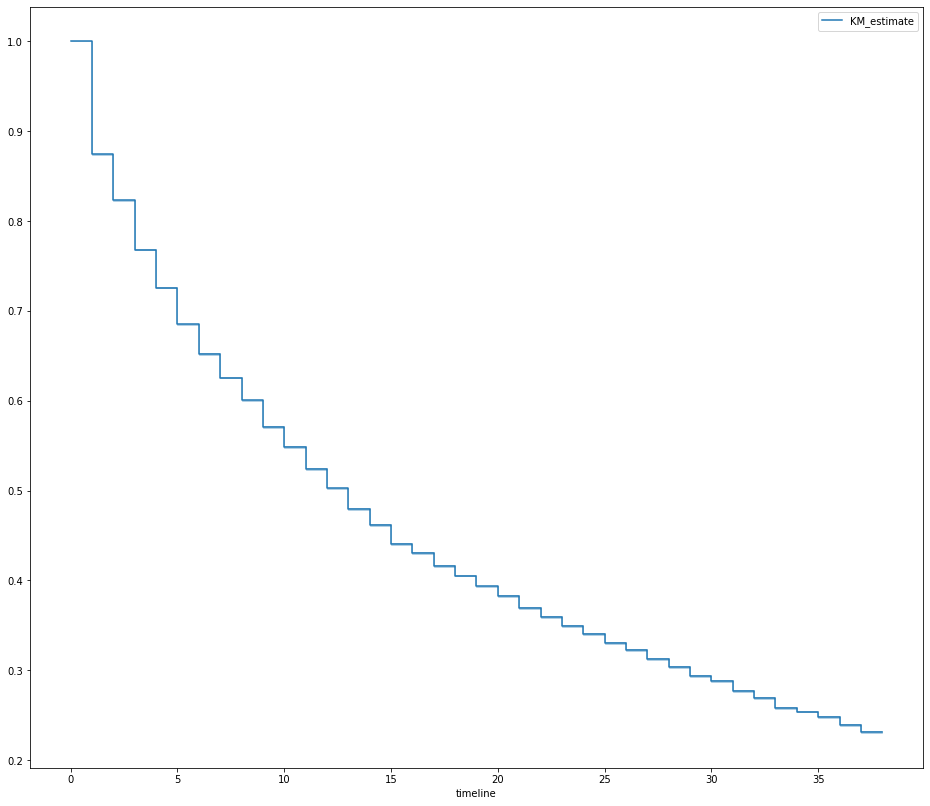

In [51]:
# This is basically a customer retention plot for monthly customers
kmf.plot_survival_function(ci_show=True)

Calculate Monthly Churns usingh the Kaplan Meier fit and compare to median monthly churns

In [52]:
def calculate_churns_from_kaplan(survival_probabilities):
    """
    Calculate the churn rate for each payment period by iterating over the survival probabilities
    """
    kaplan_churn_rates = []
    for t in range(len(survival_probabilities) - 1):
        survival_t = survival_probabilities.iloc[t].values[0]     # Survival probability at payment period t
        survival_t_next = survival_probabilities.iloc[t + 1].values[0]  # Survival probability at payment period t+1
        # Calculate churn rate between month t and t+1
        churn_rate = 1 - (survival_t_next / survival_t)
        kaplan_churn_rates.append(churn_rate)
    return kaplan_churn_rates

# Get the survival function (cumulative survival probabilities) and calculate churns
survival_probabilities = kmf.survival_function_
monthly_kaplan_churn_rates = calculate_churns_from_kaplan(survival_probabilities)

The similarity of the results below gives us confidence to select churn values for predictions by looking at summary statistics of our churns. 

/Users/talos/git_new/cohortProject/env/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


<AxesSubplot:xlabel='payment_period'>

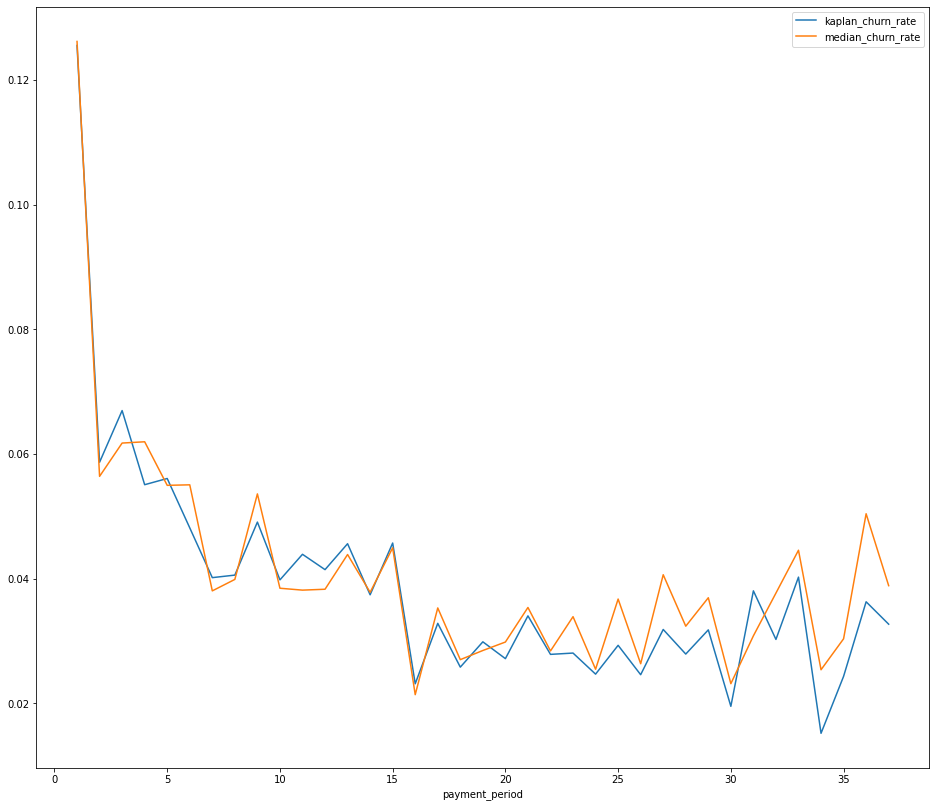

In [53]:
monhly_churns = az_monthly.get_cohort_size_churns_by_payment_period()
median_monthly_churns = monhly_churns.median()
median_and_kaplan_churn_rates = pd.DataFrame({
    "kaplan_churn_rate": monthly_kaplan_churn_rates[:37],
    "median_churn_rate": median_monthly_churns[1:39]
})
median_and_kaplan_churn_rates.plot()

## Cumulative Churn Distance Matrix Calculation

This approach was considered as an alternative for selecting churn values that can be used to project cohorts. 
Later we will see that in order to predict accumulative churn from rolling month i to j (needed to predict the
performance of existing cohorts at month j whose performance we know at month
i) we multiply churns in-between (mean-conservative and very conservative values).
However, variance of the product of (even) independent variables such as churns in
rolling months requires analysis that I did not have the time to pursue.
To cross check that multiplying (median, conservative and very conservative) monthly
churns would give a valid approximation.
I derived the accumulative delta between months i and j using directly the data that
was available from cohorts that were alive between months i and j for any given i
and j. Let’s call that delta M[i,j].
I can use those to get an estimate of delta M[k], where i¡k¡=j using delta M[i,k]-delta
M[I,k-1] in which case variance is just the sum of the variances of the (independent
)variables.
The same method can be used in combination with the Kaplan Meiler filter which
computes a survival function for rolling month j. However, we can use the same
filter to compute the survival function for rolling month j given that the customer
was alive at month i for any i. Simply train a filter for each i using data of customers
that are alive for at least i time periods).

These functions can be used to create the churn distance matrix and make projections given the matrix as well. 

In [54]:
def create_cumulative_churn_distance_matrix_by_quantile(cohort_customer_by_payment_period, quantile, max_distance, payment_period_distance):
    """
    Create a cumulative churn distance matrix given a quantile (e.g., 0.5 for median) and a maximum distance (we need to have data for that distance)
    """
    cum_distance_churns = pd.DataFrame(index=list(range(0, max_distance + 1)), columns=list(range(0, max_distance + 1)))
    for i in range(0, max_distance + 1, payment_period_distance):
        for j in range(i + payment_period_distance, max_distance + 1, payment_period_distance):
            customers_i = cohort_customer_by_payment_period[i]
            customers_j = cohort_customer_by_payment_period[j]
            cum_churn_i_j = (customers_i - customers_j) / customers_i
            cum_distance_churns.loc[i, j] = cum_churn_i_j.quantile(quantile)
    return cum_distance_churns

def project_cohorts_given_cumulative_churn_distance_matrix(cohort_data_by_payment_period, cumulative_churn_distance_matrix, payment_period_distance):
    """
    Project cohort data given a cumulative churn distance matrix
    """
    projected_df = cohort_data_by_payment_period.copy()
    for cohort in cohort_data_by_payment_period.index:
        cohort_data = cohort_data_by_payment_period.loc[cohort]
        # last non-na payment period
        i = cohort_data.last_valid_index()
        data_i = cohort_data[i]
        for j in range(i + payment_period_distance, len(cumulative_churn_distance_matrix.columns), payment_period_distance):
            cum_churn_i_j = cumulative_churn_distance_matrix.loc[i, j]
            data_j = data_i * (1 - cum_churn_i_j)
            projected_df.loc[cohort, j] = data_j
    return projected_df

Example Use for Monthly customers with median churns:

In [55]:
monthly_cohort_size_by_payment_period = az_monthly.get_cohort_size_by_payment_period(should_cumulate=False)
median_churn_distance_matrix = create_cumulative_churn_distance_matrix_by_quantile(monthly_cohort_size_by_payment_period, 0.5, 30, 1)
projected_monthly_cohort_size_using_churn_distance_matrix = project_cohorts_given_cumulative_churn_distance_matrix(monthly_cohort_size_by_payment_period, median_churn_distance_matrix, 1)

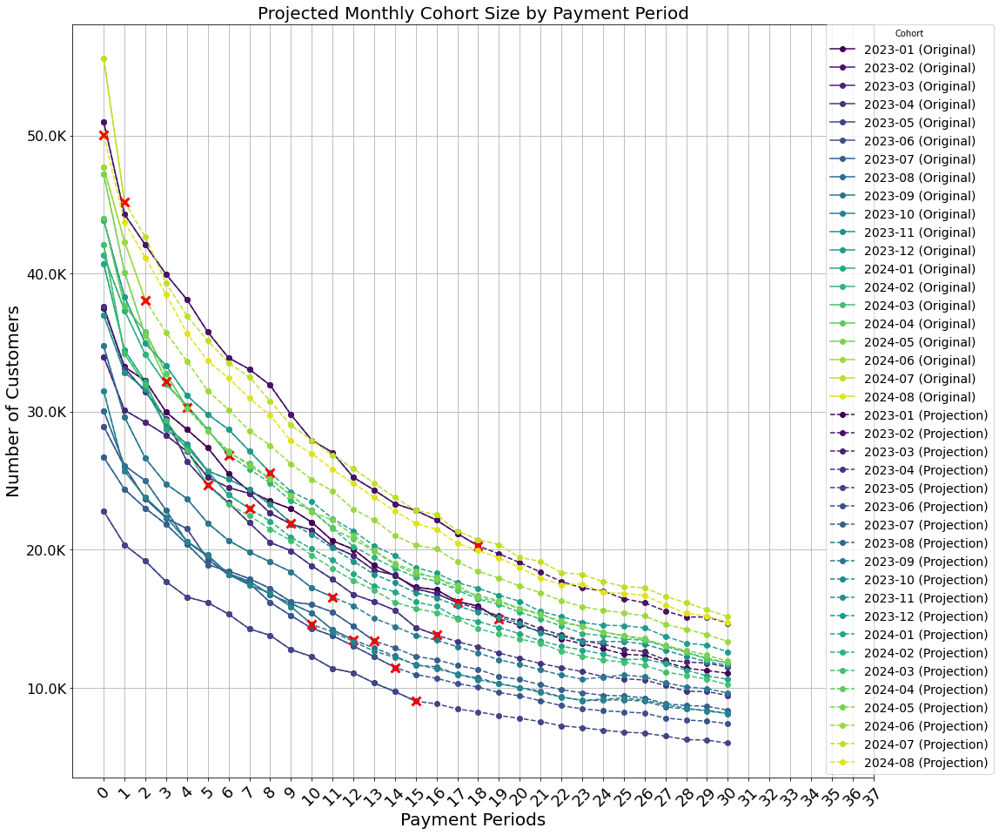

In [56]:
Analyzer.plot_wide_df_projections(
    Analyzer.filter_wide_df_by_cohorts(monthly_cohort_size_by_payment_period, min_cohort=pd.datetime(2023, 1, 1)),   
    Analyzer.filter_wide_df_by_cohorts(projected_monthly_cohort_size_using_churn_distance_matrix, min_cohort=pd.datetime(2023, 1, 1)), 
    min_cohort=pd.datetime(2021, 8, 1), 
    title="Projected Monthly Cohort Size by Payment Period",
    x_label="Payment Periods", 
    y_label="Number of Customers", 
    font_size=20
)

## Churn Selection

#### Methodology for Selecting Churn Rates Used in Predictions

In this section, we present a methodology for predicting churn rates. **C[M]** indicates the churn rate for a specific period. For example, **C[1]** represents the churn rate for the first period (the percentage of customers who left during that period).

We assume that customers go through different phases in their lifecycle:

1. **Onboarding (Months 0-3: C[1], C[2], C[3]):**  
   This is the period where customers assess whether the product meets their needs and expectations. Churn during these months is likely influenced by factors such as subscription pricing and marketing spend. Customers are still deciding whether to commit to the product. Therefore, churn rates in these periods are more sensitive to external factors like marketing effectiveness.

2. **Engagement and Value Realization (Months 4-6: C[4], C[5], C[6]):**  
   By months 4 to 6, customers who remain are more likely to have experienced the value of the product or service. These customers tend to integrate the product into their routine and are more likely to stay, leading to lower churn rates.

3. **Stabilization (Months 7+: C[7]+):**  
   At this stage, customers have established routines around the product, and churn rates tend to stabilize. External factors become less influential, and historical performance of similar cohorts can provide better insights into predicting churn for these periods.

To predict future churn rates, we will use historical data to analyze how churn rates behaved in past cohorts for each period (C[1], C[2], C[3], etc.). **More specifically, we will examine the distribution of churn rates from historical data over different time frames. By looking at historical cohort churn rates, we can determine the median churn rate, as well as the 75th and 90th percentile values for each period.**

For example, if we analyze cohort data from August 2022 to August 2023, we can obtain the per-period churn rates (Periods 1-12) and calculate the median, 75th percentile, and 90th percentile values for each period's churn rates. These historical estimates will be used to project customer churn rates in the future, particularly for months where we do not yet have data.

One approach is to use a constant time window to compute these churn distributions for all periods. However, since we aim to predict future values, we assume that more recent data is more important. Therefore, we use different time frames to compute these distributions:

- **C[1]:** We use the most recent data to compute the churn distribution, as early customer behavior is heavily influenced by current factors like recent marketing campaigns or product changes.

- **C[2] and C[3]:** We expand the data window slightly to include more historical data, balancing recent trends with a broader sample to improve reliability.

- **C[4]-C[6]:** We further expand the data window to include even more historical data, as churn rates during these periods are less influenced by immediate external factors and more by long-term customer engagement.

- **C[7]+:** For periods after month 7, we assume a constant churn rate. All periods after C[7] will have the same churn rate, calculated using a wide historical data window to capture long-term churn behavior.

In this section, we apply this logic with the aim of making predictions for cohorts starting in **January 2023**. Therefore, the specific time windows for computing churn rates are selected accordingly. In the next subsection, we will write a function that generalizes this approach and allows for custom date ranges.

It's important to note that the methodology of this analysis can be applied to any company. However, it is bound to the **recency** of data—we will need to re-run the analysis as new data becomes available to compute updated estimates for churn rates. Since the churn rates we compute to predict future performance heavily depend on more recent data, this cannot be a static model.

In a future section, we also show how to do this analysis for a past date (assuming that the latest payment date we have is in August 2023 and that we don't have any future data after that).


### Monthly

In [57]:
monthly_churns = az_monthly.get_cohort_size_churns_by_payment_period()

#### C1 selection 
Only used in 2024-08 (use a years worth of data before it)

In [58]:
m1_relevant_monthly_churns = Analyzer.filter_wide_df_by_cohorts(monthly_churns, min_cohort=pd.datetime(2023, 8, 1))
m1_relevant_monthly_churns.describe(percentiles=[.5, .75, .9])

payment_period,0,1,2,3,4,5,6,7,8,9,...,28,29,30,31,32,33,34,35,36,37
count,0.0,12.000000,11.000000,10.000000,9.000000,8.000000,7.000000,6.000000,5.000000,4.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mean,NaN,0.144575,0.075114,0.077347,0.063501,0.062848,0.054903,0.039517,0.045224,0.047820,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,0.030353,0.025342,0.017747,0.019599,0.016699,0.017736,0.009274,0.010711,0.011284,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,0.097234,0.037246,0.046190,0.042606,0.043441,0.023643,0.028915,0.033631,0.037633,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,0.145511,0.074715,0.082112,0.064808,0.060362,0.064065,0.040893,0.045156,0.047951,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,0.161443,0.094234,0.085758,0.075373,0.071236,0.065635,0.042020,0.054001,0.057508,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
90%,NaN,0.186637,0.100925,0.094076,0.082879,0.080619,0.068423,0.048229,0.056217,0.057651,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,NaN,0.187930,0.114425,0.106798,0.099497,0.094420,0.071148,0.054153,0.057695,0.057746,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [59]:
#round up to nearest 0.05
median_monthly_churns = [0.15]
conservative_monthly_churns = [0.165]
very_conservative_monthly_churns = [0.19]

#### C2 Selection 
Increase the lookback by a month to get a years worth of data

In [60]:
m2_relevant_monthly_churns = Analyzer.filter_wide_df_by_cohorts(monthly_churns, min_cohort=pd.datetime(2023, 7, 1))
m2_relevant_monthly_churns.describe(percentiles=[.5, .75, .9])

payment_period,0,1,2,3,4,5,6,7,8,9,...,28,29,30,31,32,33,34,35,36,37
count,0.0,13.000000,12.000000,11.000000,10.000000,9.000000,8.000000,7.000000,6.000000,5.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mean,NaN,0.140148,0.073524,0.074953,0.063680,0.064029,0.050988,0.038195,0.044219,0.049635,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,0.033155,0.024783,0.018615,0.018487,0.016017,0.019806,0.009159,0.009891,0.010581,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,0.087025,0.037246,0.046190,0.042606,0.043441,0.023579,0.028915,0.033631,0.037633,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,0.143208,0.070654,0.080555,0.065049,0.063883,0.060684,0.040621,0.042176,0.056892,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,0.153920,0.091323,0.085497,0.074463,0.073475,0.065149,0.041734,0.051790,0.057429,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
90%,NaN,0.186345,0.100838,0.092662,0.080801,0.078647,0.067969,0.047044,0.055848,0.057619,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,NaN,0.187930,0.114425,0.106798,0.099497,0.094420,0.071148,0.054153,0.057695,0.057746,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [61]:
median_monthly_churns += [0.075]
conservative_monthly_churns += [0.095]
very_conservative_monthly_churns += [0.15]

#### C3 Selection 
Increase the lookback period again

In [62]:
m3_relevant_monthly_churns = Analyzer.filter_wide_df_by_cohorts(monthly_churns, min_cohort=pd.datetime(2023, 6, 1))
m3_relevant_monthly_churns.describe(percentiles=[.5, .75, .9])

payment_period,0,1,2,3,4,5,6,7,8,9,...,28,29,30,31,32,33,34,35,36,37
count,0.0,14.000000,13.000000,12.000000,11.000000,10.000000,9.000000,8.000000,7.000000,6.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mean,NaN,0.137382,0.074708,0.073602,0.061070,0.067949,0.051752,0.037496,0.049229,0.051198,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,0.033494,0.024109,0.018356,0.019558,0.019536,0.018668,0.008707,0.016038,0.010209,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,0.087025,0.037246,0.046190,0.034968,0.043441,0.023579,0.028915,0.033631,0.037633,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,0.137639,0.074715,0.075298,0.064808,0.066981,0.057864,0.036613,0.045156,0.057160,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,0.153010,0.088924,0.085236,0.073553,0.074397,0.064663,0.041449,0.055848,0.057667,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
90%,NaN,0.186053,0.100751,0.091998,0.078724,0.095300,0.067515,0.045859,0.066332,0.058381,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,NaN,0.187930,0.114425,0.106798,0.099497,0.103224,0.071148,0.054153,0.079288,0.059016,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [63]:
median_monthly_churns += [0.08]
conservative_monthly_churns += [0.09]
very_conservative_monthly_churns += [0.11]

#### C4-C6 selection
For C4, C5, C6 we believe that parameters such as subscription price and degrading quality of customers based on ammount spent are less impactful. We'll use the historical data to determine

In [64]:
relevant_churns = Analyzer.filter_wide_df_by_cohorts(monthly_churns, min_cohort= pd.datetime(2023, 1, 1), cohorts_to_exclude=[pd.datetime(2023, 2, 1)]) # remove the cohort that seems to be unrepresentative (too much brand spend)
relevant_churns.describe(percentiles=[.5, .75, .9])

payment_period,0,1,2,3,4,5,6,7,8,9,...,28,29,30,31,32,33,34,35,36,37
count,0.0,18.000000,17.000000,16.000000,15.000000,14.000000,13.000000,12.000000,11.000000,10.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mean,NaN,0.132026,0.067040,0.070374,0.061498,0.063012,0.051471,0.041592,0.048209,0.047036,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,0.031124,0.026073,0.019023,0.021553,0.020613,0.017258,0.015115,0.015992,0.016321,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,0.087025,0.028866,0.032152,0.034968,0.024000,0.023579,0.017706,0.029283,0.024261,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,0.122433,0.066367,0.070406,0.062790,0.063898,0.057303,0.040893,0.045156,0.047683,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,0.149665,0.088412,0.083995,0.073553,0.072627,0.064663,0.050756,0.058439,0.057667,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
90%,NaN,0.184886,0.100404,0.089341,0.091188,0.088505,0.068337,0.061173,0.064860,0.060615,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,NaN,0.187930,0.114425,0.106798,0.104833,0.103224,0.071148,0.069851,0.079288,0.075002,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [65]:
median_monthly_churns += [0.065, 0.065, 0.06]
conservative_monthly_churns += [0.075, 0.075, 0.065]
very_conservative_monthly_churns += [0.095, 0.09, 0.07]

#### C7 + 
select a constant value for churns from here on - average of historically observed Pick from M7 to M12

In [66]:
relevant_churns.describe(percentiles=[.5, .75, .9]).iloc[:, 7:13]

payment_period,7,8,9,10,11,12
count,12.000000,11.000000,10.000000,9.000000,8.000000,7.000000
mean,0.041592,0.048209,0.047036,0.046023,0.053529,0.045792
std,0.015115,0.015992,0.016321,0.021746,0.016301,0.015802
min,0.017706,0.029283,0.024261,0.011153,0.034521,0.026906
50%,0.040893,0.045156,0.047683,0.042680,0.053911,0.051091
75%,0.050756,0.058439,0.057667,0.060684,0.063317,0.057419
90%,0.061173,0.064860,0.060615,0.066839,0.072925,0.062695
max,0.069851,0.079288,0.075002,0.080664,0.079186,0.065445


In [67]:
relevant_churn_stats = relevant_churns.describe(percentiles=[.5, .75, .9]).iloc[:, 7:13]
m7_to_m12_average = relevant_churn_stats.mean(axis=1, skipna=True)  
m7_to_m12_average

count    9.500000
mean     0.047030
std      0.016879
min      0.023972
50%      0.046902
75%      0.058047
90%      0.064851
max      0.074906
dtype: float64

In [68]:
median_monthly_churns += [0.05] * 24
conservative_monthly_churns += [0.06] * 24
very_conservative_monthly_churns += [0.07] * 24

In [69]:
print("Median monthly churns")
print(median_monthly_churns)
print("Conservative monthly churns")
print(conservative_monthly_churns)
print("Very conservative monthly churns")
print(very_conservative_monthly_churns) 

Median monthly churns
[0.15, 0.075, 0.08, 0.065, 0.065, 0.06, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05]
Conservative monthly churns
[0.165, 0.095, 0.09, 0.075, 0.075, 0.065, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06]
Very conservative monthly churns
[0.19, 0.15, 0.11, 0.095, 0.09, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07]


### Quarterly

In [70]:
quarterly_churns = az_quarterly.get_cohort_size_churns_by_payment_period()

C3 selection - look at the last year of data 

In [71]:
c3_relevant = Analyzer.filter_wide_df_by_cohorts(quarterly_churns, min_cohort=pd.datetime(2023, 6, 1))
c3_relevant.describe(percentiles=[.5, .75, .9])

payment_period,0,3,6,9,12,15,18,21,24,27,30,33,36
count,0.0,12.000000,9.000000,6.000000,3.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mean,NaN,0.073201,0.052324,0.051663,0.058868,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,0.019232,0.018664,0.008998,0.007469,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,0.045063,0.024012,0.039395,0.052890,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,0.074242,0.058877,0.056690,0.056473,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,0.084508,0.064299,0.057847,0.061857,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
90%,NaN,0.092910,0.066763,0.058202,0.065087,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,NaN,0.107617,0.073649,0.058291,0.067241,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [72]:
median_quarterly_churns = [0.075]
conservative_quarterly_churns = [0.085]
very_conservative_quarterly_churns = [0.095]

C6 look at all the data starting in 2023

In [73]:
relevant_churns = Analyzer.filter_wide_df_by_cohorts(quarterly_churns, min_cohort=pd.datetime(2023, 1, 1),  cohorts_to_exclude=[pd.datetime(2023, 2, 1)]) # remove the cohort that seems to be unrepresentative (too much brand spend)
relevant_churns.describe(percentiles=[.5, .75, .9])

payment_period,0,3,6,9,12,15,18,21,24,27,30,33,36
count,0.0,16.000000,13.000000,10.000000,7.000000,4.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0
mean,NaN,0.070281,0.052173,0.047733,0.045898,0.063829,0.020328,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,0.019012,0.017429,0.016137,0.016927,0.016042,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,0.036219,0.024012,0.025464,0.025261,0.045756,0.020328,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,0.068974,0.058662,0.048565,0.052890,0.064578,0.020328,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,0.083531,0.064299,0.057847,0.057738,0.075441,0.020328,NaN,NaN,NaN,NaN,NaN,NaN
90%,NaN,0.090449,0.069685,0.060188,0.062298,0.078418,0.020328,NaN,NaN,NaN,NaN,NaN,NaN
max,NaN,0.107617,0.073649,0.077254,0.067241,0.080403,0.020328,NaN,NaN,NaN,NaN,NaN,NaN


In [74]:
median_quarterly_churns += [0.06]
conservative_quarterly_churns += [0.065]
very_conservative_quarterly_churns += [0.07]

C9+ 

In [75]:
relevant_churns = Analyzer.filter_wide_df_by_cohorts(quarterly_churns, min_cohort=pd.datetime(2022, 6, 1),  cohorts_to_exclude=[pd.datetime(2023, 2, 1)]) 
relevant_churns.describe(percentiles=[.5, .75, .9])

payment_period,0,3,6,9,12,15,18,21,24,27,30,33,36
count,0.0,23.000000,20.000000,17.000000,14.000000,11.000000,8.000000,6.000000,3.000000,0.0,0.0,0.0,0.0
mean,NaN,0.072010,0.049153,0.046968,0.045770,0.054192,0.028134,0.041076,0.032439,NaN,NaN,NaN,NaN
std,NaN,0.020391,0.015821,0.014333,0.014024,0.016233,0.017040,0.013684,0.010475,NaN,NaN,NaN,NaN
min,NaN,0.036219,0.024012,0.021480,0.025261,0.028606,0.005855,0.025844,0.021496,NaN,NaN,NaN,NaN
50%,NaN,0.070576,0.053394,0.047273,0.048073,0.049591,0.026594,0.043050,0.033450,NaN,NaN,NaN,NaN
75%,NaN,0.084043,0.060954,0.057048,0.057881,0.066996,0.041966,0.052336,0.037911,NaN,NaN,NaN,NaN
90%,NaN,0.097634,0.065622,0.058289,0.061076,0.073787,0.047820,0.054248,0.040587,NaN,NaN,NaN,NaN
max,NaN,0.111134,0.073649,0.077254,0.067241,0.080403,0.051682,0.055634,0.042372,NaN,NaN,NaN,NaN


In [76]:
relevant_churn_stats.loc[:, 9:15]

payment_period,9,10,11,12
count,10.000000,9.000000,8.000000,7.000000
mean,0.047036,0.046023,0.053529,0.045792
std,0.016321,0.021746,0.016301,0.015802
min,0.024261,0.011153,0.034521,0.026906
50%,0.047683,0.042680,0.053911,0.051091
75%,0.057667,0.060684,0.063317,0.057419
90%,0.060615,0.066839,0.072925,0.062695
max,0.075002,0.080664,0.079186,0.065445


In [77]:
relevant_churn_stats = relevant_churns.describe(percentiles=[.5, .75, .9]) 
m9_to_m14_average = relevant_churn_stats.loc[:, 9:15].mean(axis=1, skipna=True)  
m9_to_m14_average

count    14.000000
mean      0.048977
std       0.014863
min       0.025116
50%       0.048312
75%       0.060642
90%       0.064384
max       0.074966
dtype: float64

In [78]:
median_quarterly_churns += [0.05] * 8
conservative_quarterly_churns += [0.06] * 8
very_conservative_quarterly_churns += [0.065] * 8

In [79]:
print("Median quarterly churns")
print(median_quarterly_churns)
print("Conservative quarterly churns")
print(conservative_quarterly_churns)
print("Very conservative quarterly churns")
print(very_conservative_quarterly_churns) 

Median quarterly churns
[0.075, 0.06, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05]
Conservative quarterly churns
[0.085, 0.065, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06]
Very conservative quarterly churns
[0.095, 0.07, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065]


## Automating Churn Selection

This section aims to automate our logic for selecting churn values so that it can be gathered and reused

The function calculate_churn_stats (found in ad_hoc_analysis.py) replicates the process of selecting churn rates across different key periods and defining a stabilization period, where churn is assumed to stabilize at a constant rate. This function semi-automates the process, making it flexible to handle different date ranges, and projection lengths for churn calculations.

A key reason for creating this function is to run experiments on existing data to evaluate whether our logic produces good predictions. By automating this process, we can easily chose churns for old cohorts following the same logic as we did for cohorts starting in 2023. Aditionally, this function makes our logic easily trasnferable to data from other companies.

In [80]:
from ad_hoc_analysis import calculate_churn_stats

monthly_churns = az_monthly.get_cohort_size_churns_by_payment_period()
quarterly_churns = az_quarterly.get_cohort_size_churns_by_payment_period()

monthly_cohort_periods = {
    'C1': (pd.datetime(2023, 8, 1), pd.datetime(2024, 8, 1)),
    'C2': (pd.datetime(2023, 7, 1), pd.datetime(2024, 8, 1)),
    'C3': (pd.datetime(2023, 6, 1), pd.datetime(2024, 8, 1)),
    'C4': (pd.datetime(2023, 1, 1), pd.datetime(2024, 8, 1)),
    'C5': (pd.datetime(2023, 1, 1), pd.datetime(2024, 8, 1)),
    'C6': (pd.datetime(2023, 1, 1), pd.datetime(2024, 8, 1)),
    'C7+': (pd.datetime(2023, 1, 1), pd.datetime(2024, 8, 1))
}

median_monthly_churns_automated, conservative_monthly_churns_automated, very_conservative_monthly_churns_automated = calculate_churn_stats(
    churn_data=monthly_churns.iloc[:,1:],
    excluded_cohort=[pd.Timestamp(2023, 2, 1)],
    cohort_periods=monthly_cohort_periods,
    projection_length=30,
    min_number_of_points_stabilization_period=7
)

quarterly_cohort_periods = {
    'C3': (pd.datetime(2023, 6, 1), pd.datetime(2024, 8, 1)),
    'C6': (pd.datetime(2023, 1, 1), pd.datetime(2024, 8, 1)),
    'C9+': (pd.datetime(2022, 6, 1), pd.datetime(2024, 8, 1))
}

median_quarterly_churns_automated, conservative_quarterly_churns_automated, very_conservative_quarterly_churns_automated = calculate_churn_stats(
    churn_data=quarterly_churns.iloc[:,1:],
    excluded_cohort=[pd.Timestamp(2023, 2, 1)],
    cohort_periods=quarterly_cohort_periods,
    projection_length=15
)

print("Median monthly churns")
print([round(x, 3) for x in median_monthly_churns_automated])
print("Conservative monthly churns")
print([round(x, 3) for x in conservative_monthly_churns_automated])
print("Very conservative monthly churns")
print([round(x, 3) for x in very_conservative_monthly_churns_automated]) 

print("Median quarterly churns")
print([round(x, 3) for x in median_quarterly_churns_automated])
print("Conservative quarterly churns")
print([round(x, 3) for x in conservative_quarterly_churns_automated])
print("Very conservative quarterly churns")
print([round(x, 3) for x in very_conservative_quarterly_churns_automated]) 

Median monthly churns
[0.146, 0.071, 0.075, 0.063, 0.064, 0.057, 0.047, 0.047, 0.047, 0.047, 0.047, 0.047, 0.047, 0.047, 0.047, 0.047, 0.047, 0.047, 0.047, 0.047, 0.047, 0.047, 0.047, 0.047, 0.047, 0.047, 0.047, 0.047, 0.047, 0.047]
Conservative monthly churns
[0.161, 0.091, 0.085, 0.074, 0.073, 0.065, 0.058, 0.058, 0.058, 0.058, 0.058, 0.058, 0.058, 0.058, 0.058, 0.058, 0.058, 0.058, 0.058, 0.058, 0.058, 0.058, 0.058, 0.058, 0.058, 0.058, 0.058, 0.058, 0.058, 0.058]
Very conservative monthly churns
[0.187, 0.101, 0.092, 0.091, 0.089, 0.068, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065]
Median quarterly churns
[0.074, 0.059, 0.048, 0.048, 0.048, 0.048, 0.048, 0.048, 0.048, 0.048, 0.048, 0.048, 0.048, 0.048, 0.048]
Conservative quarterly churns
[0.085, 0.064, 0.061, 0.061, 0.061, 0.061, 0.061, 0.061, 0.061, 0.061, 0.061, 0.061, 0.061, 0.061, 0.061]
Very conservative 

# Projections

In [81]:
import pandas as pd

def project_cohort_data_given_min_cohort(monthly_cohort_data, monthly_churns, quarterly_cohort_data, quarterly_churns, min_cohort=pd.datetime(2023, 1, 1), should_cumulate=True):
    """
    Project the cohort data from the given minimum cohort date using the provided churn rates and cohort data. 
    should_cumulate: bool - If True, the projected data will be cumulated across columns. If False, the data will be left as is.
    """
    if monthly_cohort_data is not None:
        monthly_extrapolated_cohort_data = Analyzer.extrapolate_cohorts_by_payment_period(
            Analyzer.filter_wide_df_by_cohorts(monthly_cohort_data, min_cohort=min_cohort), 
            monthly_churns, 
            payment_period_distance=1
        )

    if quarterly_cohort_data is not None:
        quarterly_extrapolated_cohort_data = Analyzer.extrapolate_cohorts_by_payment_period(
            Analyzer.filter_wide_df_by_cohorts(quarterly_cohort_data, min_cohort=min_cohort), 
            quarterly_churns, 
            payment_period_distance=3
        )

    if monthly_cohort_data is not None and quarterly_cohort_data is not None:
        combined_extrapolated_cohort_data = Analyzer.add_cohort_dfs(monthly_extrapolated_cohort_data, quarterly_extrapolated_cohort_data)
    elif monthly_cohort_data is not None:
        combined_extrapolated_cohort_data = monthly_extrapolated_cohort_data
    elif quarterly_cohort_data is not None:
        combined_extrapolated_cohort_data = quarterly_extrapolated_cohort_data
    else:
        raise ValueError("Both monthly and quarterly cohort data cannot be None")

    if should_cumulate:
        combined_extrapolated_cohort_data = Analyzer.cumulate_df_across_columns(combined_extrapolated_cohort_data)

    return combined_extrapolated_cohort_data

## Payments by Payment Period + ROAS Projections

In [82]:
monthly_payments_by_payment_period = az_monthly.get_cohort_payments_by_payment_period(should_cumulate=False)
quarterly_payments_by_payment_period = az_quarterly.get_cohort_payments_by_payment_period(should_cumulate=False)
spend_after_2023 = Analyzer.filter_wide_df_by_cohorts(az.spend_df, min_cohort=pd.datetime(2023, 1, 1))

median_cumulated_payments_by_payment_period_projection = project_cohort_data_given_min_cohort(
    monthly_payments_by_payment_period, median_monthly_churns, 
    quarterly_payments_by_payment_period, median_quarterly_churns, 
    min_cohort=pd.datetime(2023, 1, 1), should_cumulate=True
)
median_roas_by_payment_period_projection = median_cumulated_payments_by_payment_period_projection.div(spend_after_2023["spend"], axis=0)

conservative_cumulated_payments_by_payment_period_projection = project_cohort_data_given_min_cohort(
    monthly_payments_by_payment_period, conservative_monthly_churns, 
    quarterly_payments_by_payment_period, conservative_quarterly_churns, 
    min_cohort=pd.datetime(2023, 1, 1), should_cumulate=True
)
conservative_roas_by_payment_period_projection = conservative_cumulated_payments_by_payment_period_projection.div(spend_after_2023["spend"], axis=0)

very_conservative_cumulated_payments_by_payment_period_projection = project_cohort_data_given_min_cohort(
    monthly_payments_by_payment_period, very_conservative_monthly_churns, 
    quarterly_payments_by_payment_period, very_conservative_quarterly_churns, 
    min_cohort=pd.datetime(2023, 1, 1), should_cumulate=True
)
very_conservative_roas_by_payment_period_projection = very_conservative_cumulated_payments_by_payment_period_projection.div(spend_after_2023["spend"], axis=0)

In [83]:
# needed to plot the projections so that know where projections start
cohort_roas_by_payment_period = az.get_cohort_roas_by_payment_period()

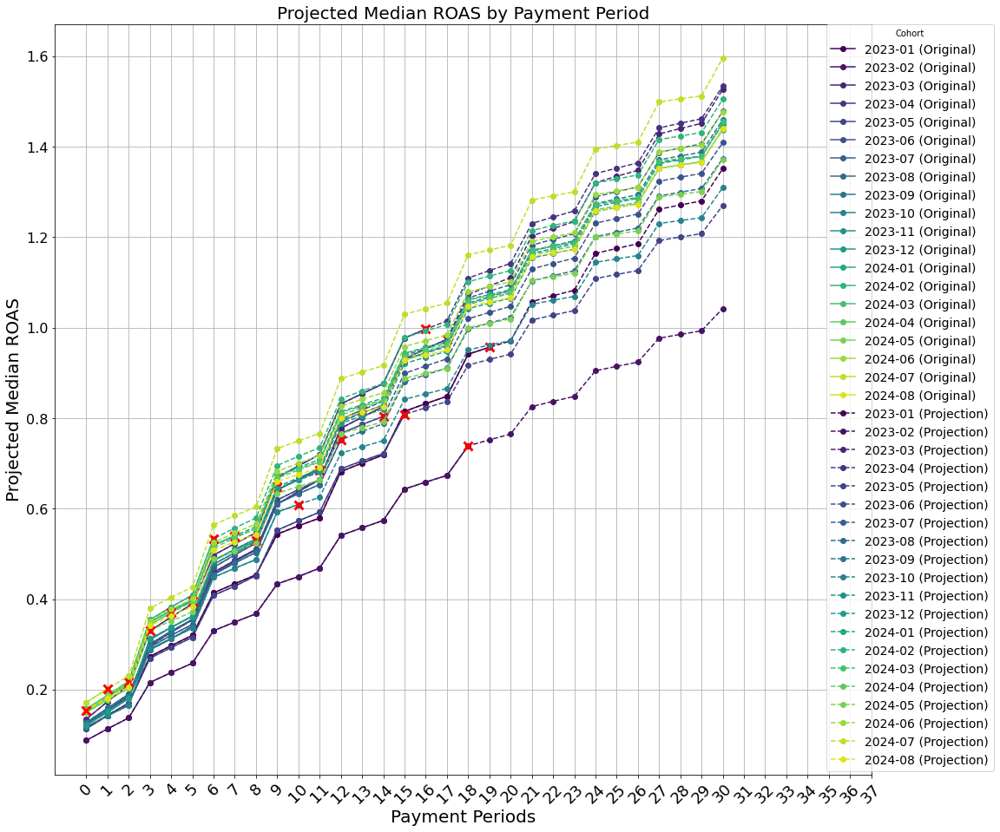

In [84]:
az.plot_wide_df_projections(
    wide_df=cohort_roas_by_payment_period,  # Original cohort payment data
    wide_df_projections=median_roas_by_payment_period_projection,  # Data for ROAS projection
    min_cohort=pd.datetime(2023, 1, 1),  # Start from January 2023 cohort
    add_legend=True,  # Add the legend
    title="Projected Median ROAS by Payment Period",  # Set the title
    x_label="Payment Periods",  # X-axis label
    y_label="Projected Median ROAS",  # Y-axis label for ROAS
    font_size=20  # Set font size for readability
)

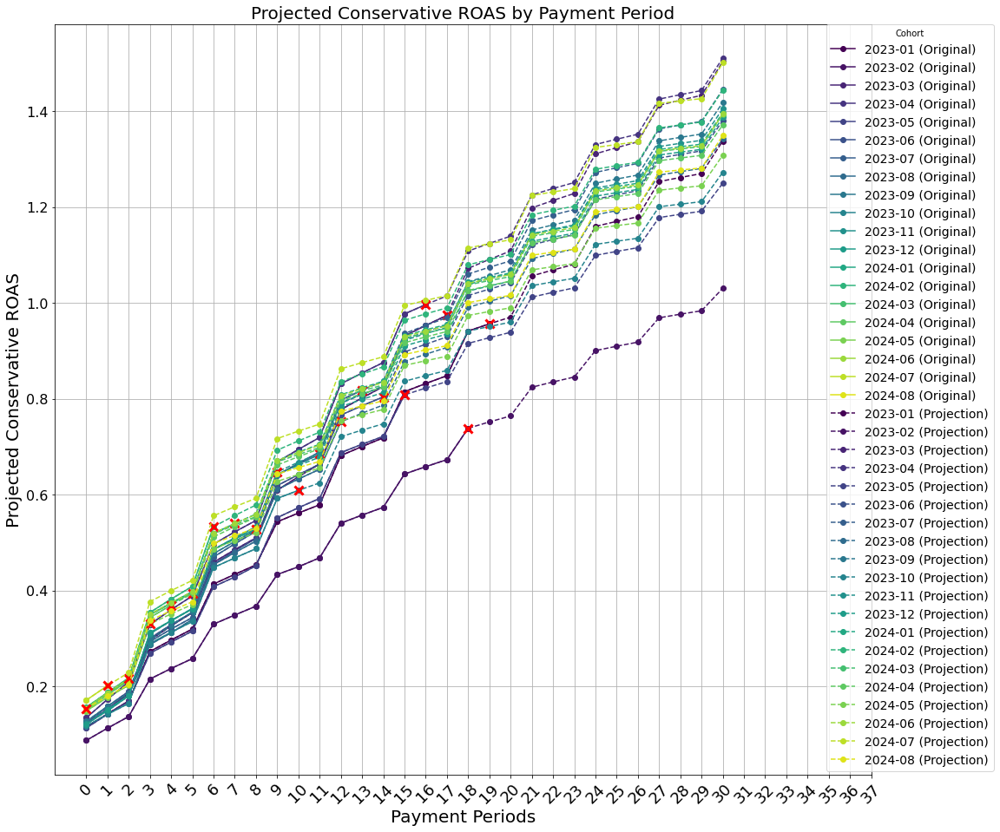

In [85]:
az.plot_wide_df_projections(
    wide_df=cohort_roas_by_payment_period,  # Original cohort payment data
    wide_df_projections=conservative_roas_by_payment_period_projection,  # Data for ROAS projection
    min_cohort=pd.datetime(2023, 1, 1),  # Start from January 2023 cohort
    add_legend=True,  # Add the legend
    title="Projected Conservative ROAS by Payment Period",  # Set the title
    x_label="Payment Periods",  # X-axis label
    y_label="Projected Conservative ROAS",  # Y-axis label for ROAS
    font_size=20  # Set font size for readability
)

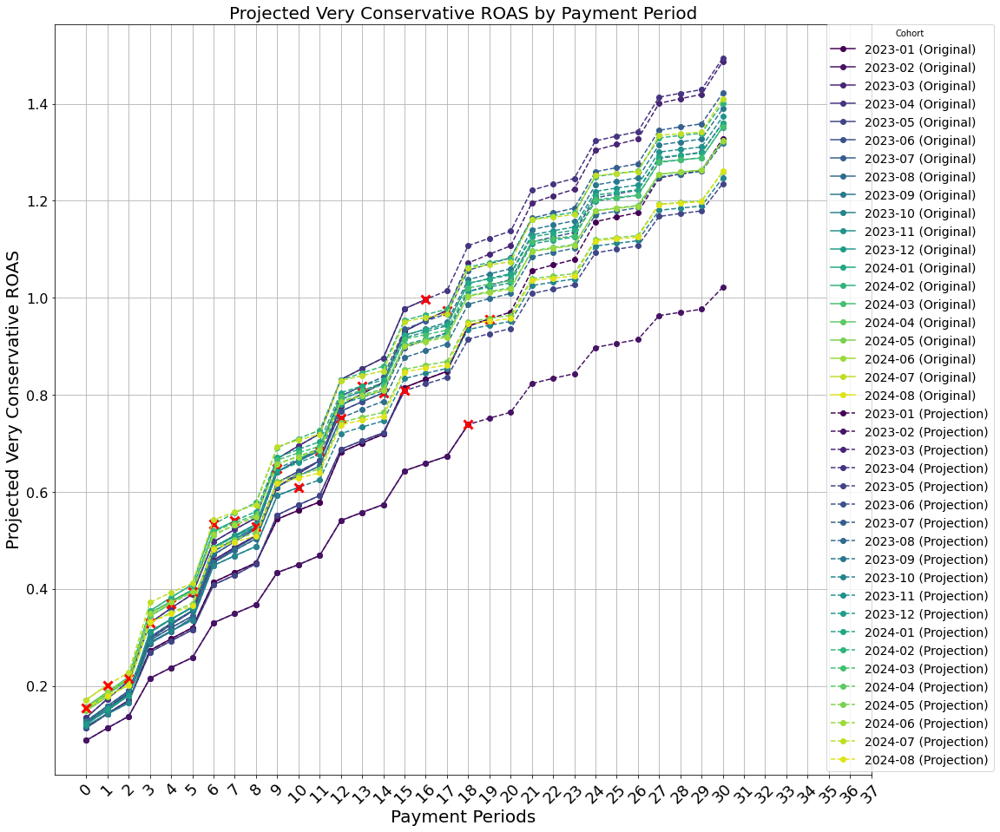

In [86]:
az.plot_wide_df_projections(
    wide_df=cohort_roas_by_payment_period,  # Original cohort payment data
    wide_df_projections=very_conservative_roas_by_payment_period_projection,  # Data for ROAS projection
    min_cohort=pd.datetime(2023, 1, 1),  # Start from January 2023 cohort
    add_legend=True,  # Add the legend
    title="Projected Very Conservative ROAS by Payment Period",  # Set the title
    x_label="Payment Periods",  # X-axis label
    y_label="Projected Very Conservative ROAS",  # Y-axis label for ROAS
    font_size=20  # Set font size for readability
)

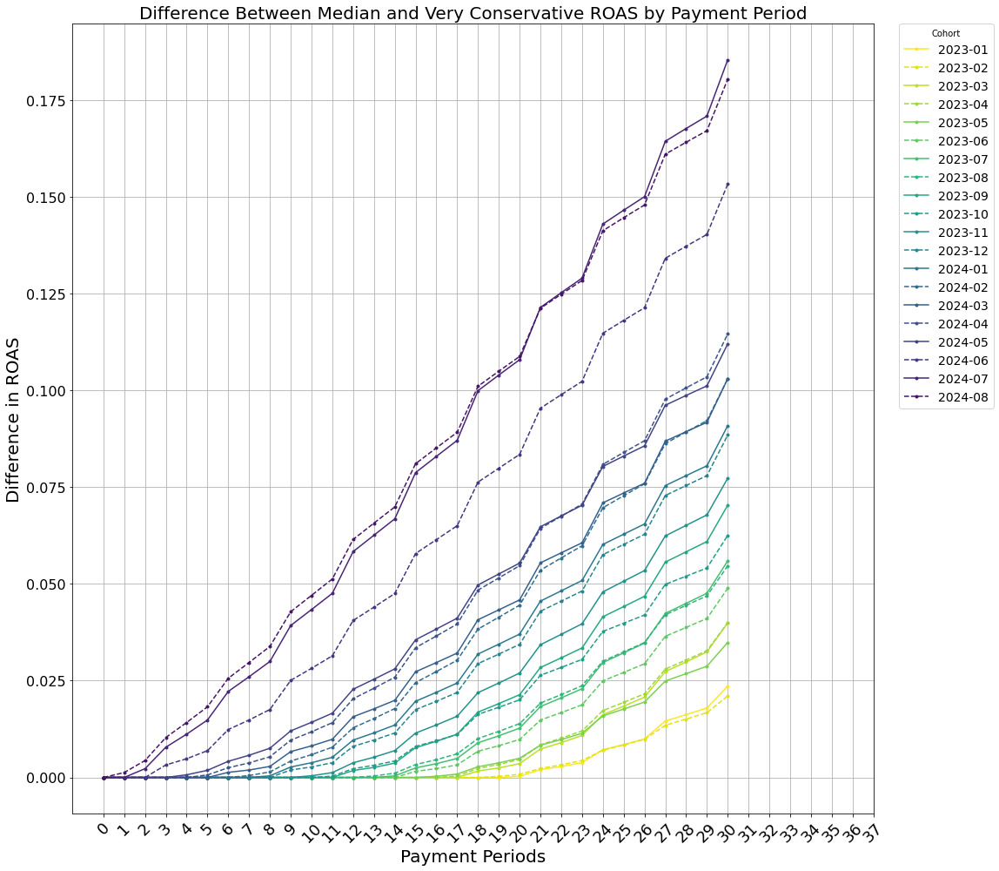

In [87]:
# Difference between median and very conservative projection 
roas_diff =   median_roas_by_payment_period_projection - very_conservative_roas_by_payment_period_projection
Analyzer.plot_wide_df(
    roas_diff,  # Data for ROAS projection
    min_cohort=pd.datetime(2023, 1, 1),  # Start from January 2023 cohort
    add_legend=True,  # Add the legend
    title="Difference Between Median and Very Conservative ROAS by Payment Period",  # Set the title
    x_label="Payment Periods",  # X-axis label
    y_label="Difference in ROAS",  # Y-axis label for ROAS
    font_size=20  # Set font size for readability
)

## Cohort Size Projections

In [88]:
monthly_cohort_size_by_payment_period = az_monthly.get_cohort_size_by_payment_period(should_cumulate=False)
quarterly_cohort_size_by_payment_period = az_quarterly.get_cohort_size_by_payment_period(should_cumulate=False)

median_cohort_size_projections = project_cohort_data_given_min_cohort(
    monthly_cohort_size_by_payment_period, median_monthly_churns, 
    quarterly_cohort_size_by_payment_period, median_quarterly_churns, 
    min_cohort=pd.datetime(2023, 1, 1), should_cumulate=False
)

conservative_cohort_size_projections = project_cohort_data_given_min_cohort(
    monthly_cohort_size_by_payment_period, conservative_monthly_churns, 
    quarterly_cohort_size_by_payment_period, conservative_quarterly_churns, 
    min_cohort=pd.datetime(2023, 1, 1), should_cumulate=False
)

very_conservative_cohort_size_projections = project_cohort_data_given_min_cohort(
    monthly_cohort_size_by_payment_period, very_conservative_monthly_churns, 
    quarterly_cohort_size_by_payment_period, very_conservative_quarterly_churns, 
    min_cohort=pd.datetime(2023, 1, 1), should_cumulate=False
)

In [89]:
# needed to plot the projections so that know where projections start   
cohort_size_by_payment_period = az.get_cohort_size_by_payment_period(should_cumulate=False)

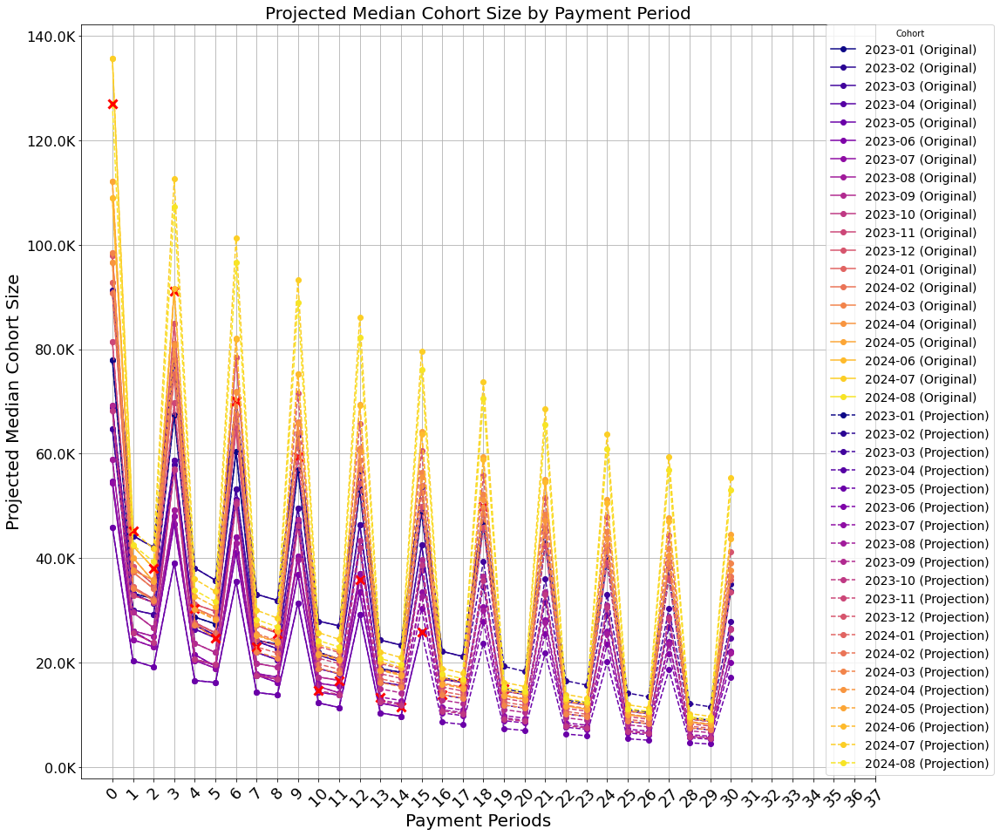

In [90]:
az.plot_wide_df_projections(
    wide_df=cohort_size_by_payment_period,  # Original cohort payment data
    wide_df_projections=median_cohort_size_projections,  # Data for ROAS projection
    min_cohort=pd.datetime(2023, 1, 1),  # Start from January 2023 cohort
    add_legend=True,  # Add the legend
    title="Projected Median Cohort Size by Payment Period",  # Set the title
    x_label="Payment Periods",  # X-axis label
    y_label="Projected Median Cohort Size",  # Y-axis label for cohort size
    font_size=20,  # Set font size for readability
    colormap="plasma"
)


### Only Monthly Cohort Size Projection

In [91]:
monthly_cohort_size_by_payment_period = az_monthly.get_cohort_size_by_payment_period(should_cumulate=False)

median_monthly_size_by_payment_period_projection = project_cohort_data_given_min_cohort(
    monthly_cohort_size_by_payment_period, median_monthly_churns, 
    None,  None, 
    min_cohort=pd.datetime(2023, 1, 1), should_cumulate=False
 )

conservative_monthly_size_by_payment_period_projection = project_cohort_data_given_min_cohort(
    monthly_cohort_size_by_payment_period, conservative_monthly_churns, 
    None,  None, 
    min_cohort=pd.datetime(2023, 1, 1), should_cumulate=False
)

very_conservative_monthly_size_by_payment_period_projection = project_cohort_data_given_min_cohort(
    monthly_cohort_size_by_payment_period, very_conservative_monthly_churns, 
    None,  None, 
    min_cohort=pd.datetime(2023, 1, 1), should_cumulate=False
)

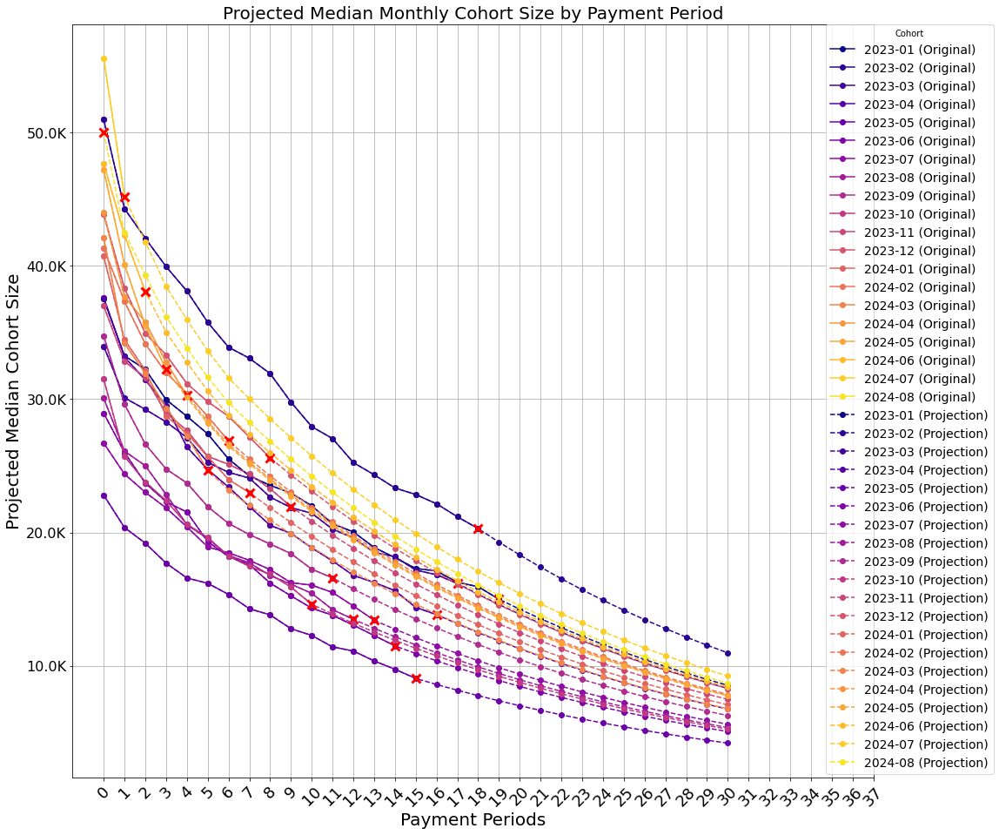

In [92]:
az.plot_wide_df_projections(
    wide_df=monthly_cohort_size_by_payment_period,  # Original cohort payment data
    wide_df_projections=median_monthly_size_by_payment_period_projection,  # Data for ROAS projection
    min_cohort=pd.datetime(2023, 1, 1),  # Start from January 2023 cohort
    add_legend=True,  # Add the legend
    title="Projected Median Monthly Cohort Size by Payment Period",  # Set the title
    x_label="Payment Periods",  # X-axis label
    y_label="Projected Median Cohort Size",  # Y-axis label for cohort size
    font_size=20,  # Set font size for readability
    colormap="plasma"
)

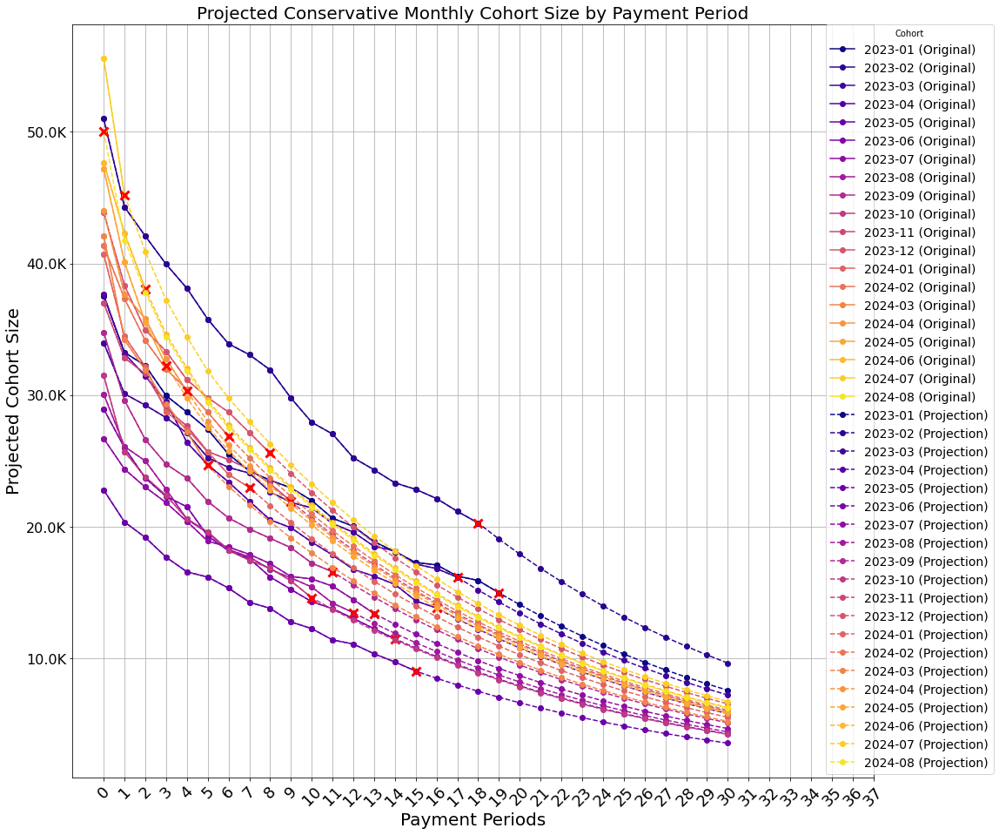

In [93]:
# Call the plot_wide_df_projections function
az.plot_wide_df_projections(
    wide_df=monthly_cohort_size_by_payment_period,  # Original cohort payment data
    wide_df_projections=conservative_monthly_size_by_payment_period_projection,  # Data for ROAS projection
    min_cohort=pd.datetime(2023, 1, 1),  # Start from January 2023 cohort
    add_legend=True,  # Add the legend
    title="Projected Conservative Monthly Cohort Size by Payment Period",  # Set the title
    x_label="Payment Periods",  # X-axis label
    y_label="Projected Cohort Size",  # Y-axis label for cohort size
    font_size=20,  # Set font size for readability
    colormap="plasma"
)

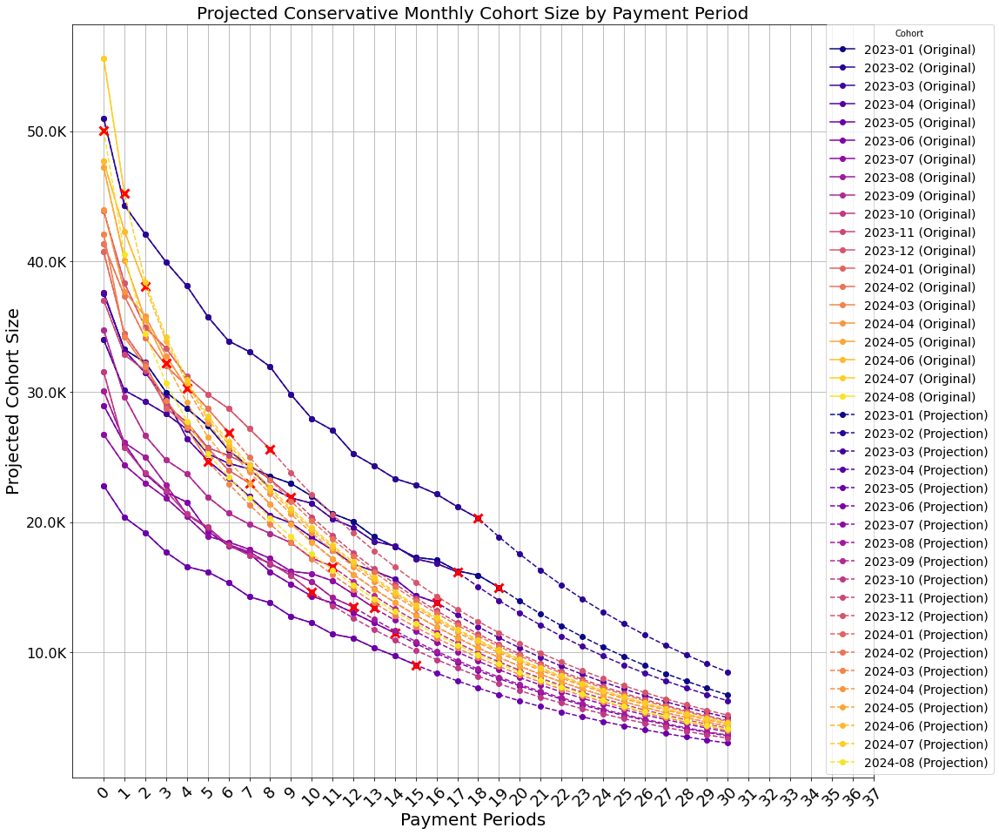

In [94]:
az.plot_wide_df_projections(
    wide_df=monthly_cohort_size_by_payment_period,  # Original cohort payment data
    wide_df_projections=very_conservative_monthly_size_by_payment_period_projection,  # Data for ROAS projection
    min_cohort=pd.datetime(2023, 1, 1),  # Start from January 2023 cohort
    add_legend=True,  # Add the legend
    title="Projected Conservative Monthly Cohort Size by Payment Period",  # Set the title
    x_label="Payment Periods",  # X-axis label
    y_label="Projected Cohort Size",  # Y-axis label for cohort size
    font_size=20,  # Set font size for readability
    colormap="plasma"
)

### Only Quarterly Cohort Size Projections

In [95]:
quarterly_cohort_size_by_payment_period = az_quarterly.get_cohort_size_by_payment_period(should_cumulate=False)

median_quarterly_cohort_size_by_payment_period_projection = project_cohort_data_given_min_cohort(
    None, None, 
    quarterly_cohort_size_by_payment_period, median_quarterly_churns, 
    min_cohort=pd.datetime(2023, 1, 1), should_cumulate=False
 )

conservative_quarterly_cohort_size_by_payment_period_projection = project_cohort_data_given_min_cohort(
    None, None, 
    quarterly_cohort_size_by_payment_period, conservative_quarterly_churns, 
    min_cohort=pd.datetime(2023, 1, 1), should_cumulate=False
)

very_conservative_quarterly_cohort_size_by_payment_period_projection = project_cohort_data_given_min_cohort(
    None, None, 
    quarterly_cohort_size_by_payment_period, very_conservative_quarterly_churns, 
    min_cohort=pd.datetime(2023, 1, 1), should_cumulate=False
)

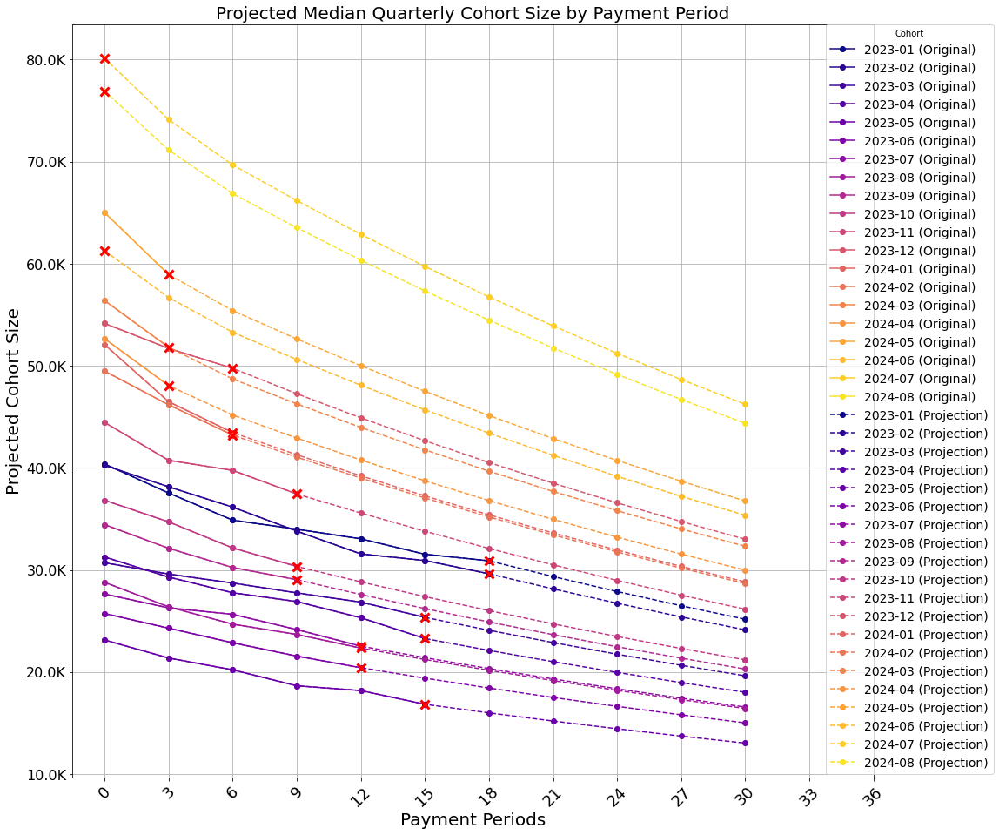

In [96]:
az.plot_wide_df_projections(
    wide_df=quarterly_cohort_size_by_payment_period,  # Original cohort payment data
    wide_df_projections=median_quarterly_cohort_size_by_payment_period_projection,  # Data for ROAS projection
    min_cohort=pd.datetime(2023, 1, 1),  # Start from January 2023 cohort
    add_legend=True,  # Add the legend
    title="Projected Median Quarterly Cohort Size by Payment Period",  # Set the title
    x_label="Payment Periods",  # X-axis label
    y_label="Projected Cohort Size",  # Y-axis label for cohort size
    font_size=20,  # Set font size for readability
    colormap="plasma"
)

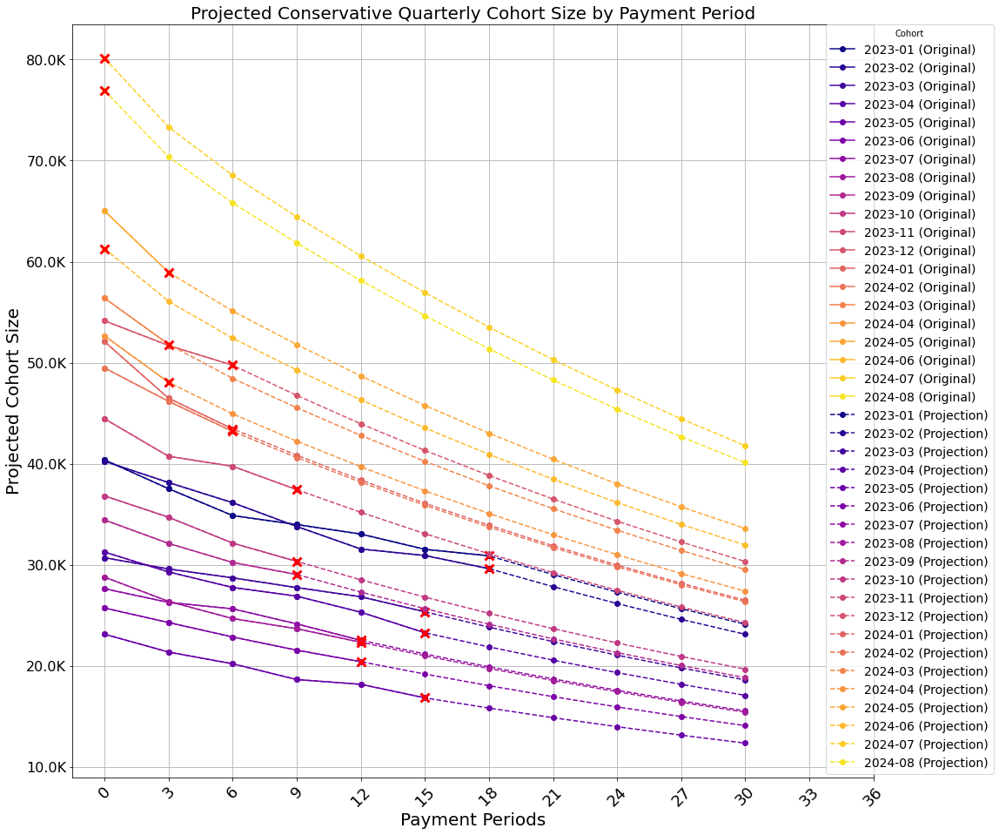

In [97]:
az.plot_wide_df_projections(
    wide_df=quarterly_cohort_size_by_payment_period,  # Original cohort payment data
    wide_df_projections=conservative_quarterly_cohort_size_by_payment_period_projection,  # Data for ROAS projection
    min_cohort=pd.datetime(2023, 1, 1),  # Start from January 2023 cohort
    add_legend=True,  # Add the legend
    title="Projected Conservative Quarterly Cohort Size by Payment Period",  # Set the title
    x_label="Payment Periods",  # X-axis label
    y_label="Projected Cohort Size",  # Y-axis label for cohort size
    font_size=20,  # Set font size for readability
    colormap="plasma"
)

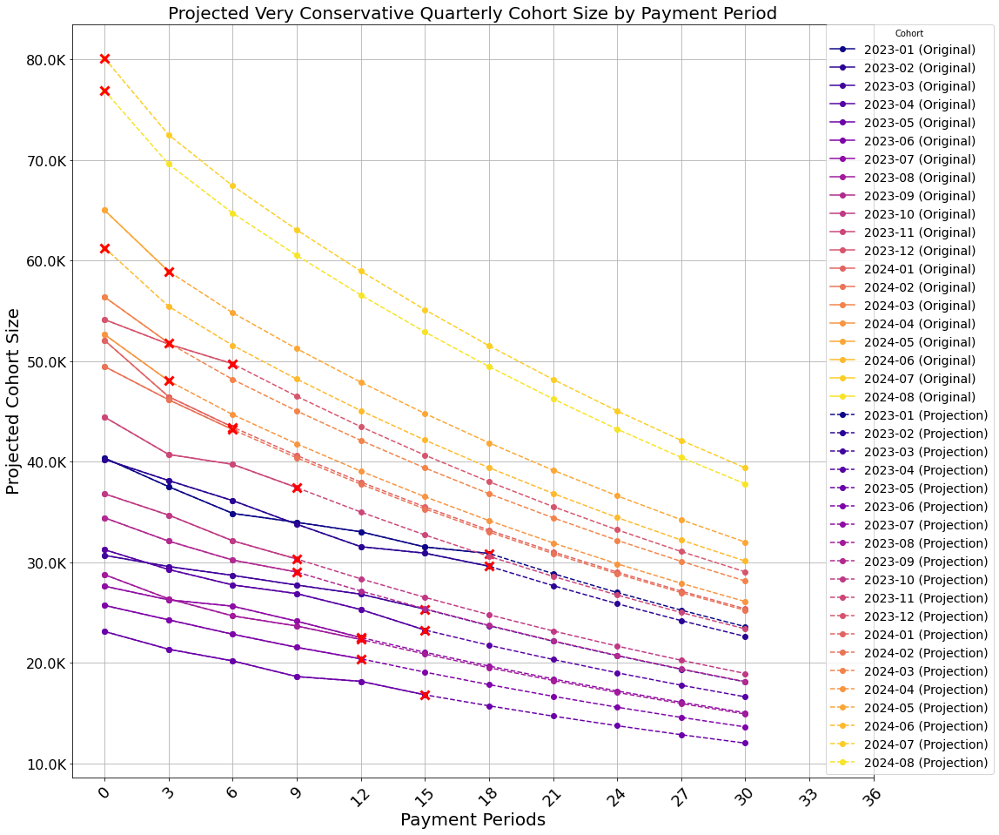

In [98]:
# Call the plot_wide_df_projections function
az.plot_wide_df_projections(
    wide_df=quarterly_cohort_size_by_payment_period,  # Original cohort payment data
    wide_df_projections=very_conservative_quarterly_cohort_size_by_payment_period_projection,  # Data for ROAS projection
    min_cohort=pd.datetime(2023, 1, 1),  # Start from January 2023 cohort
    add_legend=True,  # Add the legend
    title="Projected Very Conservative Quarterly Cohort Size by Payment Period",  # Set the title
    x_label="Payment Periods",  # X-axis label
    y_label="Projected Cohort Size",  # Y-axis label for cohort size
    font_size=20,  # Set font size for readability
    colormap="plasma"
)

## ROAS projections as if subscriptions were always at the increased values - Only median Casae

Here we want to see how the old cohorts would have performed if they started their life with the subscription already increased (11.99, 29.99)

In [99]:
def multiply_wide_df_by_new_monthly_subscription(df):
     return df.multiply(11.99, axis=1)

def multiply_wide_df_by_new_quarterly_subscription(df):
     return df.multiply(29.99, axis=1)

spend_after_2023 = Analyzer.filter_wide_df_by_cohorts(az.spend_df, min_cohort=pd.datetime(2023, 1, 1))
median_monthly_payments_by_payment_period_projection_with_new_pice = multiply_wide_df_by_new_monthly_subscription(median_monthly_size_by_payment_period_projection)
median_quarterly_payments_by_payment_period_projection_with_new_pice = multiply_wide_df_by_new_quarterly_subscription(median_quarterly_cohort_size_by_payment_period_projection)
median_payments_by_payment_period_projection_with_new_price = Analyzer.add_cohort_dfs(median_monthly_payments_by_payment_period_projection_with_new_pice, median_quarterly_payments_by_payment_period_projection_with_new_pice)
median_cumulated_payments_by_payment_period_projection_with_new_price =  Analyzer.cumulate_df_across_columns(median_payments_by_payment_period_projection_with_new_price)
median_roas_by_payment_period_projection_with_new_price = median_cumulated_payments_by_payment_period_projection_with_new_price.div(spend_after_2023["spend"], axis=0)

In [100]:
# create the original  payment by payment df without the projections as if prices were increased to use for plot function
monthly_cohort_size_by_payment_period = az_monthly.get_cohort_size_by_payment_period(should_cumulate=False)
monthly_cohort_payments_with_new_price = multiply_wide_df_by_new_monthly_subscription(monthly_cohort_size_by_payment_period)
monthly_cohort_roas_with_new_price =  monthly_cohort_payments_with_new_price.div(spend_after_2023["spend"], axis=0)

quarterly_cohort_size_by_payment_period = az_quarterly.get_cohort_size_by_payment_period(should_cumulate=False)
quarterly_cohort_payments_with_new_price = multiply_wide_df_by_new_quarterly_subscription(quarterly_cohort_size_by_payment_period)
quarterly_cohort_roas_with_new_price =  quarterly_cohort_payments_with_new_price.div(spend_after_2023["spend"], axis=0)

cohort_roas_with_new_price = Analyzer.cumulate_df_across_columns(Analyzer.add_cohort_dfs(monthly_cohort_roas_with_new_price, quarterly_cohort_roas_with_new_price))


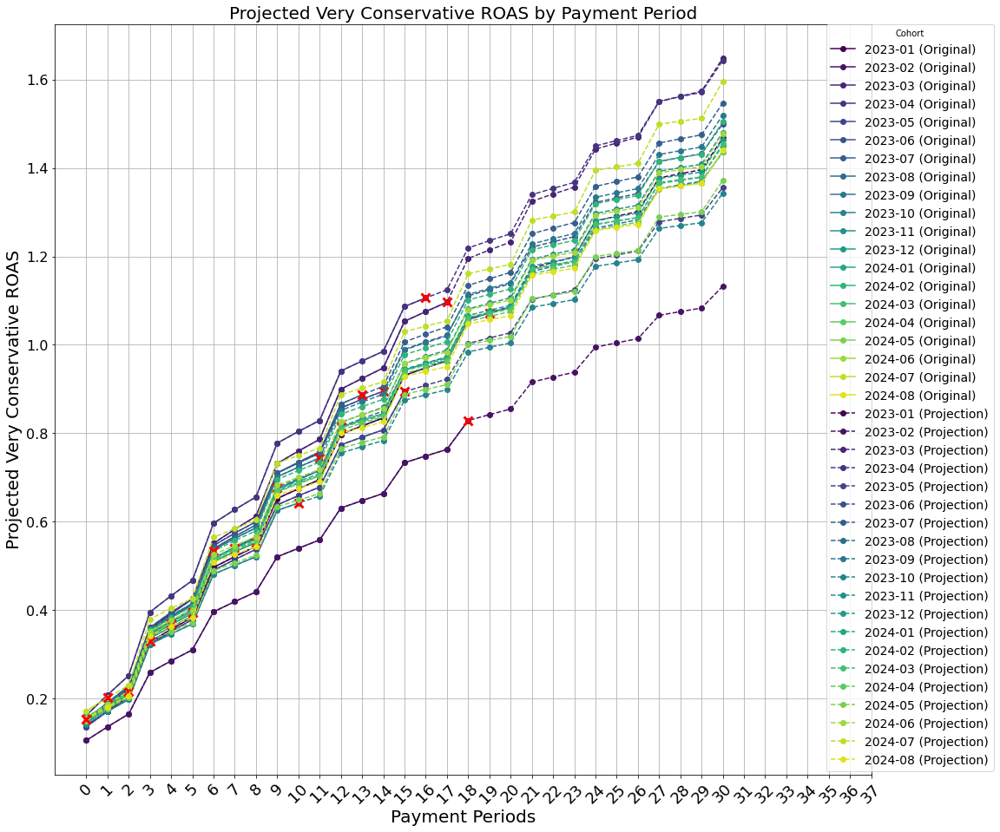

In [101]:
az.plot_wide_df_projections(
    wide_df=cohort_roas_with_new_price,  # Original cohort payment data
    wide_df_projections=median_roas_by_payment_period_projection_with_new_price,  # Data for ROAS projection
    min_cohort=pd.datetime(2023, 1, 1),  # Start from January 2023 cohort
    add_legend=True,  # Add the legend
    title="Projected Very Conservative ROAS by Payment Period",  # Set the title
    x_label="Payment Periods",  # X-axis label
    y_label="Projected Very Conservative ROAS",  # Y-axis label for ROAS
    font_size=20  # Set font size for readability
)

## Projecting on existing data experiment

In this experiment, we will predict cohort sizes for all cohorts up to 2023-08, assuming that we do not have information for cohorts from 2023-09 onwards or data for these cohorts after that date. Essentially, we are assuming that all our data ends in 2023-08, and we need to predict cohort sizes for the upcoming months.

For the sake of time and not cluttering this notebook more. We will conduct this experiment for monthly customers and predict their size in the future months. This experiment can be easily expanded for quarterly customers, as well as doing backtests on other dates (assuming different data cut offs).


The steps that we will follow:

1. **Compute Churn Rates:** We will calculate the churn rates based on the available data prior to August 2023, following the same reasoning as before.
2. **Make Predictions:** Using the computed churn rates, we will predict the cohort sizes for the median case churn scenario.
3. **Compare Results:** After making predictions, we will compare them to the actual cohort sizes and look at the differences.



#### Step 1: Prepare data for prediction

We want to act as if our data ended in September 2023. 

In the original DataFrame, we already have data for these dates, so we need to mask (remove) that data to proceed with the predictions.


In [102]:
min_cohort_start_date = pd.datetime(2022, 8, 1)
mock_data_end_date = pd.datetime(2023, 8, 1)
monthly_cohort_size_by_payment_period = az_monthly.get_cohort_size_by_payment_period(should_cumulate=False)
mock_monthly_cohort_size_by_payment_period = Analyzer.filter_wide_df_by_cohorts(monthly_cohort_size_by_payment_period,
                                                                                min_cohort= min_cohort_start_date,
                                                                                max_cohort=mock_data_end_date)
mock_monthly_cohort_size_by_payment_period.tail(3)

payment_period,0,1,2,3,4,5,6,7,8,9,...,28,29,30,31,32,33,34,35,36,37
cohort,,,,,,,,,,,,,,,,,,,,,
2023-06-01,28947.0,26011.0,23698.0,22306.0,21526.0,19304.0,18187.0,17594.0,16199.0,15243.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-07-01,26705.0,24381.0,23015.0,21841.0,20415.0,18915.0,18469.0,17910.0,17208.0,16229.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-08-01,30075.0,26103.0,25006.0,22855.0,20581.0,19532.0,18269.0,17722.0,16765.0,16120.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


We will make the projection up to 12 periods given that after that we don't have data for cohort and the whole purpose of this is to see how we perform in data that we have

In [103]:
first_col_with_any_na_value = mock_monthly_cohort_size_by_payment_period.isna().any().idxmax()
target_monthly_cohort_size_by_payment_period = mock_monthly_cohort_size_by_payment_period.iloc[:, :first_col_with_any_na_value]
target_monthly_cohort_size_by_payment_period

payment_period,0,1,2,3,4,5,6,7,8,9,10,11,12
cohort,,,,,,,,,,,,,
2022-08-01,42462.0,37335.0,35177.0,33148.0,31122.0,29398.0,27631.0,27137.0,25611.0,24137.0,23527.0,21818.0,20513.0
2022-09-01,48356.0,41632.0,39117.0,37509.0,34959.0,32387.0,31359.0,29977.0,29292.0,28660.0,27465.0,26243.0,24893.0
2022-10-01,40789.0,36520.0,34385.0,30525.0,28196.0,27095.0,25527.0,24633.0,24123.0,22728.0,21804.0,21201.0,20448.0
2022-11-01,46905.0,39688.0,36220.0,33509.0,32310.0,30534.0,29429.0,28804.0,27895.0,26562.0,25888.0,25168.0,23912.0
2022-12-01,48756.0,41837.0,39746.0,37361.0,35106.0,33405.0,31968.0,30670.0,29156.0,27994.0,27327.0,25675.0,24079.0
2023-01-01,37522.0,33248.0,32245.0,29963.0,28717.0,27396.0,25512.0,24246.0,23536.0,22965.0,21997.0,20655.0,20039.0
2023-02-01,50996.0,44295.0,42079.0,39945.0,38115.0,35769.0,33902.0,33076.0,31921.0,29784.0,27939.0,27048.0,25247.0
2023-03-01,33982.0,30105.0,29236.0,28296.0,27122.0,25257.0,24512.0,24078.0,22653.0,21864.0,21440.0,20250.0,19593.0
2023-04-01,37628.0,33162.0,31444.0,29504.0,26411.0,24723.0,23405.0,21955.0,20531.0,19934.0,18846.0,17860.0,16773.0


In [104]:
import numpy as np
def fill_bottom_right_triangle_with_nan(df):
    """
    example result:
         0    1    2
    0  1.0  2.0  3.0
    1  4.0  5.0  NaN
    2  7.0  NaN  NaN
    """
    for i in range(len(df)):
        num_nans = i  # Number of NaNs to insert
        if num_nans > 0:
            df.iloc[i, -num_nans:] = np.NaN 
    return df


masked_mock_monthly_cohort_size_by_payment_period = mock_monthly_cohort_size_by_payment_period.copy()
# Square the matrix to set the bottom right triangle to NaN
masked_mock_monthly_cohort_size_by_payment_period = masked_mock_monthly_cohort_size_by_payment_period.iloc[:, :len(masked_mock_monthly_cohort_size_by_payment_period.index)]
# Fill the bottom right triangle with NaN
masked_mock_monthly_cohort_size_by_payment_period = fill_bottom_right_triangle_with_nan(masked_mock_monthly_cohort_size_by_payment_period)
masked_mock_monthly_cohort_size_by_payment_period.tail(3)

payment_period,0,1,2,3,4,5,6,7,8,9,10,11,12
cohort,,,,,,,,,,,,,
2023-06-01,28947.0,26011.0,23698.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-07-01,26705.0,24381.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-08-01,30075.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### Step 2: Compute the churn rates

**Monthly Churn:**
- **C1**: We use the data from August 1, 2022, to August 1, 2023.
- **C2**: We use the data from July 1, 2022, to August 1, 2023.
- **C3**: We use the data from June 1, 2022, to August 1, 2023.
- **C4-C6**: We use all available data from January 1, 2022, to August 1, 2023, selecting data separately for each period.
- **C7+**: We assume a constant churn rate. For periods after C7, we use the average churn rate from the data to estimate a constant rate. We use all available data from January 1, 2022, to August 1, 2023.


In [105]:
from ad_hoc_analysis import calculate_churn_stats
monthly_cohort_periods_experiment = {
    'C1': (pd.datetime(2022, 8, 1), pd.datetime(2023, 8, 1)),
    'C2': (pd.datetime(2022, 7, 1), pd.datetime(2023, 8, 1)),
    'C3': (pd.datetime(2022, 6, 1), pd.datetime(2023, 8, 1)),
    'C4': (pd.datetime(2022, 1, 1), pd.datetime(2023, 8, 1)),
    'C5': (pd.datetime(2022, 1, 1), pd.datetime(2023, 8, 1)),
    'C6': (pd.datetime(2022, 1, 1), pd.datetime(2023, 8, 1)),
    'C7+': (pd.datetime(2022, 1, 1), pd.datetime(2023, 8, 1))
}


median_monthly_churns_experiment, conservative_monthly_churns_experiment, very_conservative_monthly_churns_experiment = calculate_churn_stats(
    churn_data=monthly_churns.iloc[:,1:],
    excluded_cohort=[pd.Timestamp(2023, 2, 1)],
    cohort_periods=monthly_cohort_periods_experiment,
    projection_length=12,
    min_number_of_points_stabilization_period=7
)

We mask the data and remove the bottom right diagonal to create missing values

###  Step 3 Projection

In [106]:
projected_mock_monthly_cohort_size_by_payment_period = project_cohort_data_given_min_cohort(
    masked_mock_monthly_cohort_size_by_payment_period[1:], 
    median_monthly_churns_experiment, 
    None, 
    None, 
    min_cohort=min_cohort_start_date, 
    should_cumulate=False
)

### Step 4 Compare Projections with Real Data


We will plot the differences for both the uncumulated and cumulated case

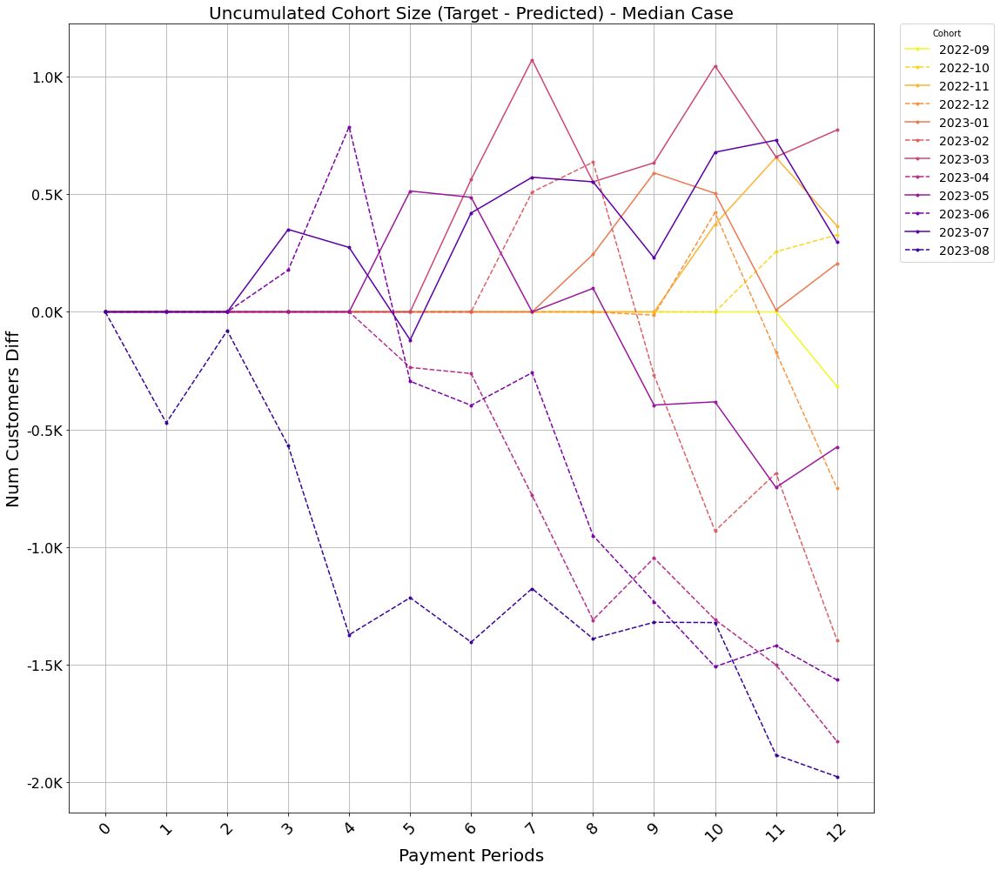

In [107]:
uncumulated_prediction_diff = target_monthly_cohort_size_by_payment_period[1:] - projected_mock_monthly_cohort_size_by_payment_period
Analyzer.plot_wide_df(
    uncumulated_prediction_diff,
    add_legend=True,  # Add the legend
    title="Uncumulated Cohort Size (Target - Predicted) - Median Case",  # Set the title
    x_label="Payment Periods",  # X-axis label
    y_label="Num Customers Diff",  # Y-axis label for ROAS
    font_size=20,  # Set font size for readability, 
    colormap="plasma"
)

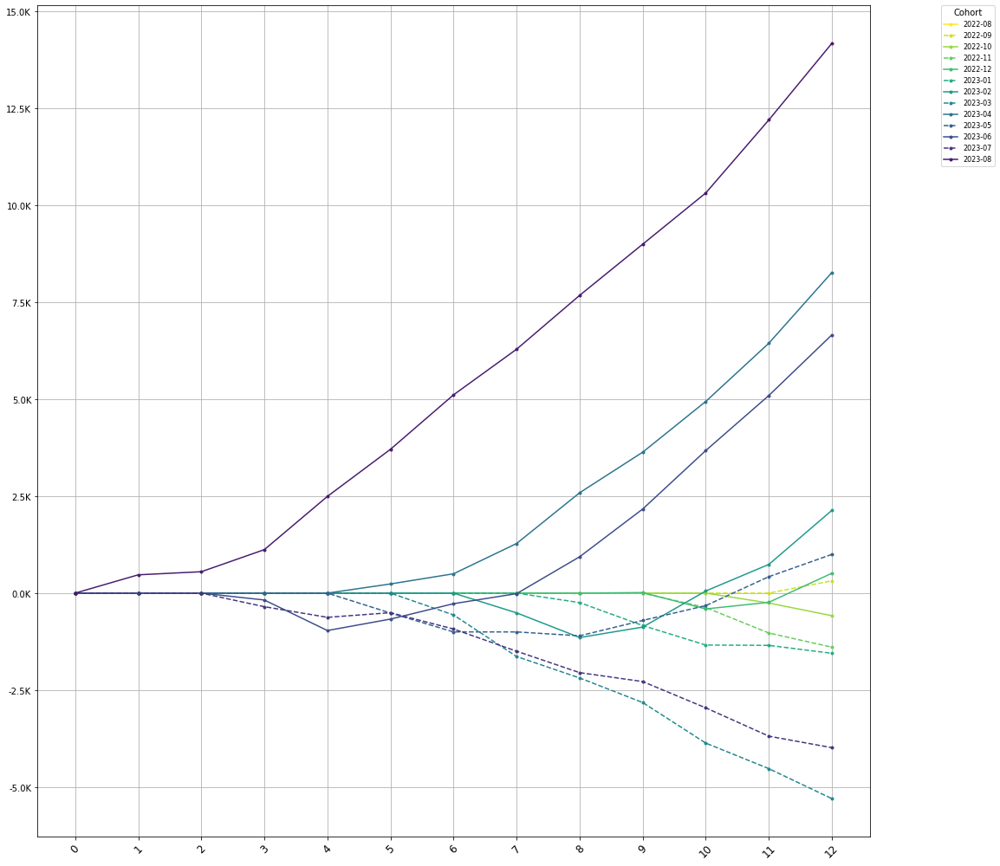

In [108]:
cumulated_target_monthly_cohort_size_by_payment_period = Analyzer.cumulate_df_across_columns(target_monthly_cohort_size_by_payment_period)
cumulated_predicted_monthly_cohort_size_by_payment_period = Analyzer.cumulate_df_across_columns(projected_mock_monthly_cohort_size_by_payment_period)
cumulated_prediction_diff = cumulated_predicted_monthly_cohort_size_by_payment_period - cumulated_target_monthly_cohort_size_by_payment_period
Analyzer.plot_wide_df(cumulated_prediction_diff)

Convervative case

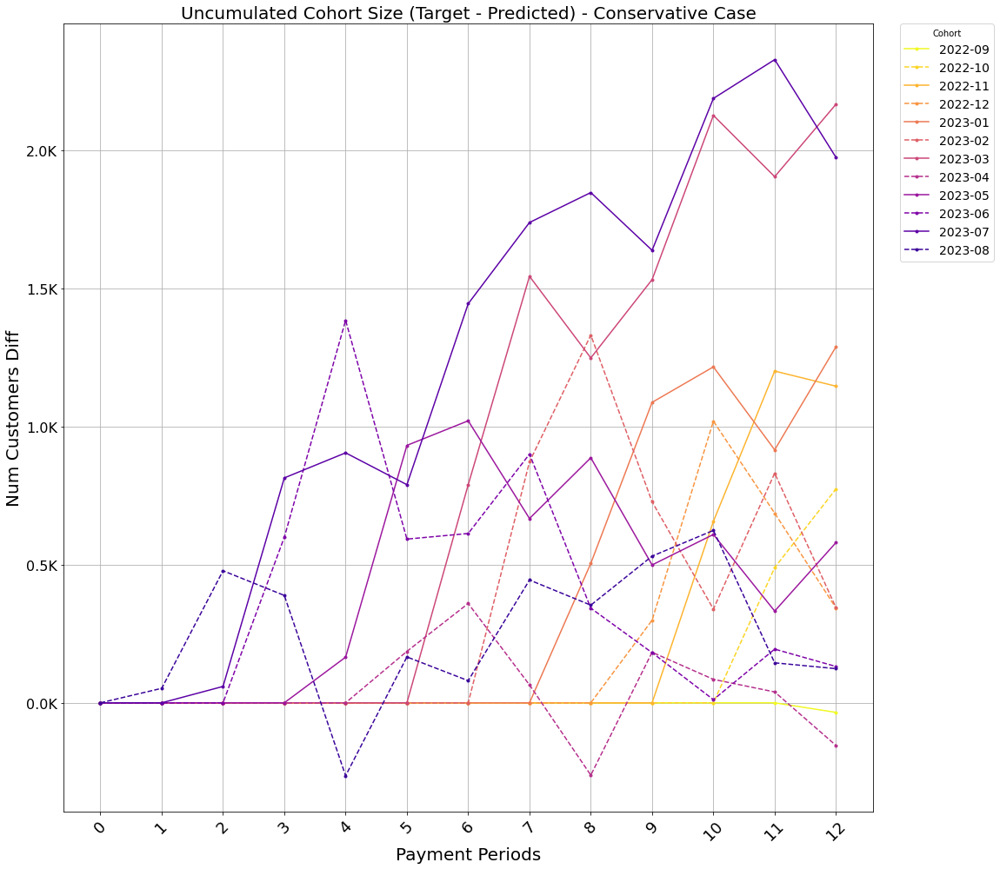

In [109]:
projected_mock_monthly_cohort_size_by_payment_period_conservative = project_cohort_data_given_min_cohort(
    masked_mock_monthly_cohort_size_by_payment_period[1:], 
    conservative_monthly_churns_experiment, 
    None, 
    None, 
    min_cohort=min_cohort_start_date, 
    should_cumulate=False
)
uncumulated_prediction_diff_conservative = target_monthly_cohort_size_by_payment_period[1:] - projected_mock_monthly_cohort_size_by_payment_period_conservative
Analyzer.plot_wide_df(
    uncumulated_prediction_diff_conservative,
    add_legend=True,  # Add the legend
    title="Uncumulated Cohort Size (Target - Predicted) - Conservative Case",  # Set the title
    x_label="Payment Periods",  # X-axis label
    y_label="Num Customers Diff",  # Y-axis label for ROAS
    font_size=20,  # Set font size for readability, 
    colormap="plasma"
)

# Parameter Choice

To select our thresholds, we are going to run various simulations that will help us determine threshold values for each payment period. 

Our simulations require us to select a cohort composition (ratio of monthly to total customers in a cohort). 

Since our thresholds are placed for future cohorts, we will look at recent cohort compositions to determine a value for that ratio

In [110]:
az = Analyzer(customer_payment_df=customer_payment_df, spend_df=spend_df)
cohort_payment_frequency_breakdown = az.get_customer_count_by_payment_frequency()

In [111]:
# monthly + quarterly = total
cohort_payment_frequency_breakdown.head()

payment_frequency,monthly,quarterly,total
cohort,,,
2021-07-01,137983,51367,189350
2021-08-01,32247,45150,77397
2021-09-01,36151,49974,86125
2021-10-01,40667,25544,66211
2021-11-01,32172,22413,54585


Lets look at the cohort compositions since the start of 2024

In [112]:
post_2024_cohort_payment_frequency_breakdown = cohort_payment_frequency_breakdown[cohort_payment_frequency_breakdown.index >= pd.datetime(2024, 1, 2)]
post_2024_monthly_ratio = post_2024_cohort_payment_frequency_breakdown["monthly"] / post_2024_cohort_payment_frequency_breakdown["total"]
post_2024_monthly_ratio.describe()

count    7.000000
mean     0.428535
std      0.022768
min      0.394134
25%      0.415084
50%      0.427485
75%      0.446344
max      0.455270
dtype: float64

We see that the maximum monthly ratio is rougly 0.45 (45% of the customers are monthly). However, we think that such a selection will create thresholds that are lower than what we want. This is because we've observed that quarterly customers generally perform better than monthly customers. 

To be safe, we increse our lookback period to the start of 2023. 

In [113]:
post_2023_cohort_payment_frequency_breakdown = cohort_payment_frequency_breakdown[cohort_payment_frequency_breakdown.index >= pd.datetime(2023, 1, 2)]
post_2023_monthly_ratio = post_2023_cohort_payment_frequency_breakdown["monthly"] / post_2023_cohort_payment_frequency_breakdown["total"]
post_2023_monthly_ratio.describe()

count    19.000000
mean      0.471710
std       0.047768
min       0.394134
25%       0.438198
50%       0.455270
75%       0.506638
max       0.558897
dtype: float64

Being conservative we select the 75th percentile and set our monthly to total ratio = 0.5 (50% of the customers in our simulated cohorts will be monthly). 
Note that if we think our thresholds are too low, we can increase the ratio of monthly customers. 

#### Simulations for Threshold Selection
Description: 
Our simulations will be extrapolating cohort ROAS for different M0 values. Our goal is to find simulated cases that reach a 1.2 MOIC (20% ROAS) at month 30. All simulations will use the selected ratio of monhtly and quarterly customers. 

There are two types of simulations and each type has two sub-categories: 
1. Cohort ROAS porjections
    - With conservative churns (as selected in above section)
    - With very conservative churns (as selected in above section)

2. Cohort ROAS projections with the ability to collect 100% of the revenue from the point that it breaches a threshold and onwards.  
    - With conservative churns (as selected in above section)
    - With very conservative churns (as selected in above section)

In [114]:
def extrapolate_cohorts_roas_given_m0_values(m0_values, percentage_of_monthly_customers, monthly_churns, quarterly_churns, payment_period_to_start_collecting_25_percent_more = None):
    """
    Extrapolate coohorts given:
      their M0 values (list). 
      the ratio of monthly to total customers in the cohort.
      churns rates (monthly and quarterly) 
      optional payment period to start collecting 25% more from customers (expressed as a 25% increase in the projections)
    """
    m0_monthly_df, m0_quarterly_df = create_monthly_and_quarterly_dfs_from_m0_values(m0_values, percentage_of_monthly_customers)

    monthly_projections = Analyzer.extrapolate_cohorts_by_payment_period(m0_monthly_df, monthly_churns, payment_period_distance=1)
    quarterly_projections = Analyzer.extrapolate_cohorts_by_payment_period(m0_quarterly_df, quarterly_churns, payment_period_distance=3)
    combined_projection = Analyzer.add_cohort_dfs(monthly_projections, quarterly_projections)

    if payment_period_to_start_collecting_25_percent_more is not None:
        projection_with_increase = increase_projections_by_25_percent_from_payment_period(combined_projection, payment_period_to_start_collecting_25_percent_more)
    else: 
        projection_with_increase = combined_projection.copy()

    combined_projection = Analyzer.cumulate_df_across_columns(combined_projection)
    projection_with_increase = Analyzer.cumulate_df_across_columns(projection_with_increase)
    return combined_projection, projection_with_increase

def increase_projections_by_25_percent_from_payment_period(projection_df, month_to_start_increase):
    """
    Increase the projections by 25% from the given payment period.
    """
    projections_with_increase = projection_df.copy()
    projections_with_increase.iloc[:, month_to_start_increase:] = projections_with_increase.iloc[:, month_to_start_increase:] * 1.25
    return projections_with_increase

def create_monthly_and_quarterly_dfs_from_m0_values(m0_values, ratio_of_monthly_to_total_customers): 
    """ 
    Create monthly and quarterly dataframes from the given M0 values and the ratio of monthly to total customers in the cohort.
    """
    m0_monthly_df = pd.DataFrame()
    m0_quarterly_df = pd.DataFrame()
    for m0 in m0_values: 
        allocated_monthly_m0, allocated_quarterly_m0 = allocate_m0_to_monthly_and_quarterlry(m0, ratio_of_monthly_to_total_customers)
        m0_monthly_df.loc[f"cohort_({m0})", 0] = allocated_monthly_m0
        m0_quarterly_df.loc[f"cohort_({m0})", 0] = allocated_quarterly_m0
    return m0_monthly_df, m0_quarterly_df

def allocate_m0_to_monthly_and_quarterlry(m0, monthly_size_percentage, monthly_subscription=9.99, quarterly_subscription=24.99):
    """
    Allocate the M0 value to monthly and quarterly cohorts based on the given monthly size percentage and the monthly and quarterly subscription.
    """
    monthly_m0 = ((monthly_size_percentage * monthly_subscription) / (monthly_size_percentage * monthly_subscription + (1 - monthly_size_percentage) * quarterly_subscription)) * m0
    quarterly_m0 = m0 - monthly_m0
    return monthly_m0, quarterly_m0

## THRESHOLDS USING VERY CONSERVATIVE CHURNS

In [115]:
# Create an empty dataframe to start storing results that will help us determine our thresholds. Results using very conservative churns are stored here. 
very_conservative_thresholds =  pd.DataFrame()

### Very Conservative Churns + No increase in Collection Amount

Process description: 
- simulate and project cohorts for multiple M0 values
- Find the cohort that hits 1.2 MOIC at month 30 (projects just above or exactly at 1.2)
- Store the M[N] and Delta M[N] values of that projected cohorts in the thresholds DataFraame


Note that if there is no increase in the collection amount, the selected cohort will provide thresholds for all M[N] values. This is becaause, if any M[N] (N < 30) were to be lower, the same churns would result in an M[30] less than 1.2. 


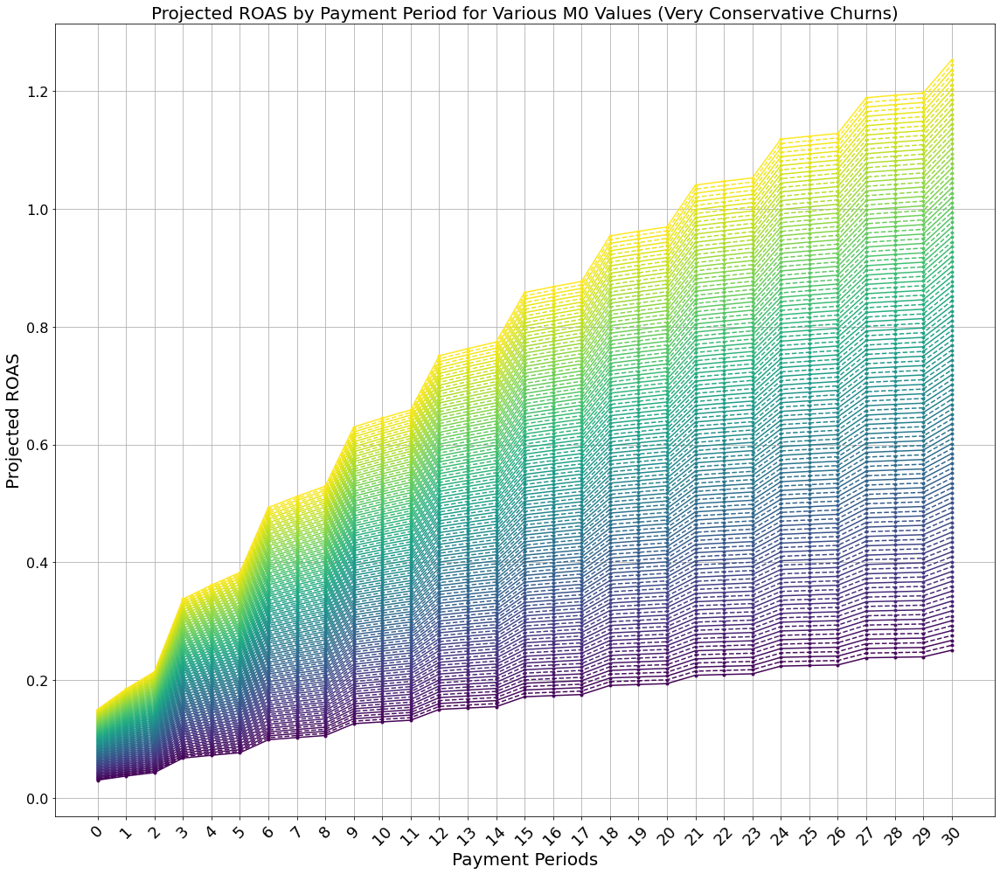

In [116]:
import numpy as np 
# Select a wide range of M0 values to project to month 30. Wide enough to hit 1.2 in 30 months. 
m0_values = [round(x, 3) for x in np.arange(0.15, 0.03, -0.0001)]
projections_without_increase, projections_with_increase = extrapolate_cohorts_roas_given_m0_values(m0_values, 0.5, very_conservative_monthly_churns, very_conservative_quarterly_churns, payment_period_to_start_collecting_25_percent_more=None)
# Plot to see that 1.2 at M30 is hit. 
Analyzer.plot_wide_df(
    projections_without_increase.iloc[:, :31], 
    title="Projected ROAS by Payment Period for Various M0 Values (Very Conservative Churns)",
    x_label="Payment Periods",
    y_label="Projected ROAS",
    font_size=20,
    add_legend=False)

Here, we find the simulated M0 value that hits M[30] = 1.2 at month 30. We then append the selected cohort to our threshold dataframe as it will be used to create thresholds. Note that this cohort will be used to create thresholds for all the payment periods. We also calculate and store the Delta M[N] values which will further asist us in our threshold selection. 


In [117]:
# Find the row that has a the min value at or above 1.2 in month 30.
filtered = projections_without_increase[(projections_without_increase[30] > 1.19) & (projections_without_increase[30] < 1.21)]
filtered.iloc[0:1, 0:31]   

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
cohort_(0.144),0.144,0.177311,0.205626,0.323928,0.346734,0.367488,0.473373,0.491323,0.508016,0.604497,...,0.998931,1.00497,1.0106,1.07367,1.07853,1.08306,1.14135,1.14526,1.1489,1.20285


In [118]:
# Add the row to the thresholds dataframe. Also add the uncumulated version of the row. (Adding M[N] and delta M[N] to the dataframe). These will be later used to decide thresholds 
very_conservative_thresholds = pd.concat([very_conservative_thresholds, filtered.iloc[0:1, 0:31]])
very_conservative_thresholds = pd.concat([very_conservative_thresholds, Analyzer.uncumulate_df_across_columns(filtered.iloc[0:1, 0:31])])
very_conservative_thresholds

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
cohort_(0.144),0.144,0.177311,0.205626,0.323928,0.346734,0.367488,0.473373,0.491323,0.508016,0.604497,...,0.998931,1.00497,1.0106,1.07367,1.07853,1.08306,1.14135,1.14526,1.1489,1.20285
cohort_(0.144),0.144,0.0333114,0.0283147,0.118302,0.0228061,0.0207535,0.105885,0.0179497,0.0166933,0.0964813,...,0.0683712,0.00604369,0.00562063,0.0630781,0.00486128,0.00452099,0.0582951,0.00391021,0.00363649,0.0539566


### Very Conservative Churns + Increase in Collection amount (from 80% to 100%)

Finding the thresholds in this type of simulation is an iterative process that requires manual tweaking of the simulation parameters. 

Unlike the previous type of simulation, the cohort with an M0 and churns that hits M[30] just at or above 1.2 is not enough to determrine all M[N] thresholds. In fact, it is only able to tell us the M[0] threshold. To better understand this statement assume that we selected all thresholds based on this selected cohort. Then, If M0 was stressed (but not breached) then we wouldn't collect 100% of the revenue from payment periods 0 and therefore we would fall short of 1.2 for M[30]. 

Therefore, once we select a threshold for M[i], we need to create a cohort that stresses M[i] and select a threshold for M[i+1] such that if 100% of revenue was collected from payment period i + 1 onwarrds we would still hit M[30] = 1.2. Also, we techinaclly need to do this for all i in [0, 29]. 

Here we only repeat this process for i in [0, 3, 6, 9, 12]. These are the most important five payment periods as they are the earliest five that include payments from monthly and quartelry customers

Step 1: Find the hypothetical M0 threshold at which if breached, we collect 100% of the amount starting at payment period 0. 
- Simulate multiple M0 values but this time set payment_period_to_start_collecting_25_percent_more = 0. This means that we will collect 100% of the revenue starting from M0. 
- Find the cohort that under this condition, has M30 just above 1.2 

Step 2: Here, we want to find the threshold for M3 at which if breached, we collect 100% of the amount starting at payment period 3. 
- Set M0 equal to the selected M0 from step 1 (stressed but not breached). Set payment_period_to_start_collecting_25_percent_more = 3 and tweak the churn[3] (monthly + quarterly) so that the m3 value increases. Tweak the churns as little as possible so that M[30] is hit just at or above 1.2. Note we tweak the monthly and quarterly churn values by an equal proportion.

Step 3: Here we want to find the threshold for M6 at which if breached, we collect 100% of the amount starting at payment period 6. 
- Set M0 equal to the selected M0 from step 1, churn[3] equal to the selected values from step 3 (M[0] + M[3] thresholds are stressesed but not breached). Set payment_period_to_start_collecting_25_percent_more = 6 and tweak churn[6] as little as possible so that M[30] is hit just orabove 1.2. 

Step 4: Here we want to find the threshold for M9 at which if breached, we collect 100% of the amount starting at payment period 9. Similar to steps 2 and 3, stress the M0, M3, M6 thresholds and tweak the churn[9] values until you hit just at or above 1.2 for M[30]. 

Step 5. Repeat the process for M12. 

#### M0 

Simulate M0 values and project the cohorts. This time also bump up the MOIC by 25% starting at payment period 0. This is done to resemble the scenario where we increase collection from 80% to 100%. The projection function will now return 2 different cohorts for each M0. One without the MOIC bump, and one with the bump. 

The projection with the increase in MOIC will determine if 1.2 is hit at M[30] while it's corresponding projection without the increase will be used to select the M0 threshold

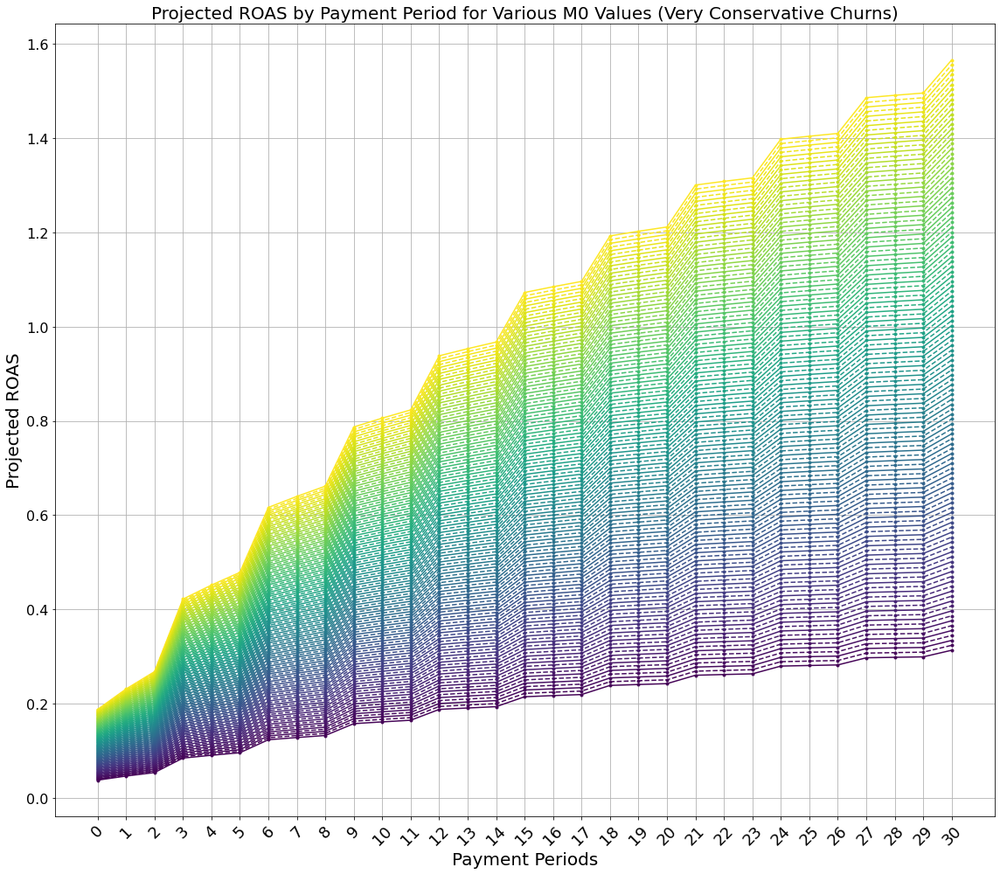

In [119]:
m0_values = [round(x, 3) for x in np.arange(0.15, 0.03, -0.0001)]
projections_without_increaase, projections_with_increase = extrapolate_cohorts_roas_given_m0_values(m0_values, 0.5, very_conservative_monthly_churns, very_conservative_quarterly_churns, payment_period_to_start_collecting_25_percent_more=0)
Analyzer.plot_wide_df(
    projections_with_increase.iloc[:, :31], 
    title="Projected ROAS by Payment Period for Various M0 Values (Very Conservative Churns)",
    x_label="Payment Periods",
    y_label="Projected ROAS",
    font_size=20,
    add_legend=False)

In [120]:
# Find the projection with the increase in MOIC that has a the min value at or above 1.2 in month 30.
filterred_with_increase = projections_with_increase[(projections_with_increase[30] > 1.19) & (projections_with_increase[30] < 1.21)]
filterred_with_increase.iloc[0:1, 0:31]   

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
cohort_(0.115),0.14375,0.177004,0.205269,0.323366,0.346132,0.36685,0.472551,0.49047,0.507134,0.603448,...,0.997197,1.00323,1.00884,1.07181,1.07666,1.08118,1.13937,1.14327,1.1469,1.20077


In [121]:
# For the projection selected above, find the corresponding projection without the increase in MOIC. 
filtered_without_increase = projections_without_increaase[(projections_with_increase[30] > 1.19) & (projections_with_increase[30] < 1.21)]
filtered_without_increase.iloc[0:1, 0:31]

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
cohort_(0.115),0.115,0.141603,0.164215,0.258692,0.276906,0.29348,0.378041,0.392376,0.405707,0.482758,...,0.797757,0.802584,0.807073,0.857447,0.86133,0.86494,0.911495,0.914618,0.917522,0.960613


In [122]:
# Note that we store the results without the increase that when increased hit the target M[30] = 1.2 (This is because the results without the increase will help us determine thresholds)
very_conservative_thresholds = pd.concat([very_conservative_thresholds, filtered_without_increase.iloc[0:1, 0:31]])
very_conservative_thresholds = pd.concat([very_conservative_thresholds, Analyzer.uncumulate_df_across_columns(filtered_without_increase.iloc[0:1, 0:31])])
very_conservative_thresholds

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
cohort_(0.144),0.144,0.177311,0.205626,0.323928,0.346734,0.367488,0.473373,0.491323,0.508016,0.604497,...,0.998931,1.00497,1.0106,1.07367,1.07853,1.08306,1.14135,1.14526,1.1489,1.20285
cohort_(0.144),0.144,0.0333114,0.0283147,0.118302,0.0228061,0.0207535,0.105885,0.0179497,0.0166933,0.0964813,...,0.0683712,0.00604369,0.00562063,0.0630781,0.00486128,0.00452099,0.0582951,0.00391021,0.00363649,0.0539566
cohort_(0.115),0.115,0.141603,0.164215,0.258692,0.276906,0.29348,0.378041,0.392376,0.405707,0.482758,...,0.797757,0.802584,0.807073,0.857447,0.86133,0.86494,0.911495,0.914618,0.917522,0.960613
cohort_(0.115),0.115,0.0266029,0.0226124,0.0944771,0.0182132,0.016574,0.0845612,0.0143349,0.0133314,0.077051,...,0.054602,0.00482656,0.0044887,0.0503749,0.00388228,0.00361052,0.0465551,0.00312274,0.00290414,0.0430904


#### M3 

As mentioned above, to select a threshold for M3 we need to stress the threshold for M0 and see what value of M3 is needed to hit a 1.2 MOIC at month 30. To stress the value of M0 we simply set it at the threshold found above. 

Simulating and projecting cohorts with specific M0-M2 values and variations in M3 is tricky as the problem of allocating M3 to monthly and quarterly MOIC is not a trivial one. Instead of solving the allocation problem we do something different: We manually run our simulations one cohort at a time. Each time, we tweak the monthly and quarterly churn 3 values so that we get different M3 values while still keeping M0-M2 constant. 

Intuitively we know that the M3 value that satisfies the desired condition is higher than the M3 value in the cohort selected for the M0 threshold. Therefore, we start decreasing churns 3 (monthly and quarterly by the same ratio) until we find a simulation that hits M[30] = 1.2 - Note that the increase in MOIC now happens starts at payment period 3. 

Below you will see the result of a couple of simulations run by tweaking the churns 3 values.

In [123]:
very_conservative_worse_m3_churn_monthly = very_conservative_monthly_churns.copy()
very_conservative_worse_m3_churn_quarterly = very_conservative_quarterly_churns.copy()

# increase by 10$ 
very_conservative_worse_m3_churn_monthly[2] -= very_conservative_worse_m3_churn_monthly[2] * 0.4
very_conservative_worse_m3_churn_quarterly[0] -= very_conservative_worse_m3_churn_quarterly[0] * 0.4
print(very_conservative_worse_m3_churn_monthly)
print(very_conservative_worse_m3_churn_quarterly)

[0.19, 0.15, 0.066, 0.095, 0.09, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07]
[0.056999999999999995, 0.07, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065]


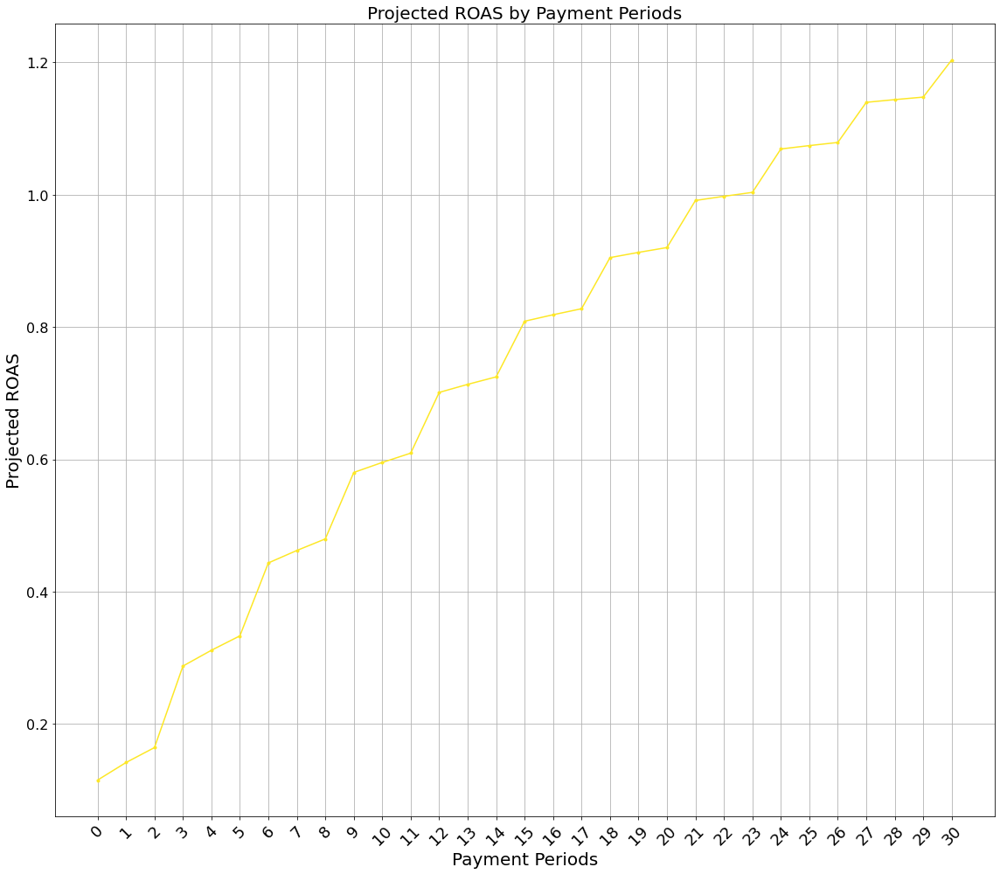

In [124]:
m0_values = [0.115] # above threshold
projections_without_increaase, projections_with_increase = extrapolate_cohorts_roas_given_m0_values(m0_values, 0.5, very_conservative_worse_m3_churn_monthly, very_conservative_worse_m3_churn_quarterly, payment_period_to_start_collecting_25_percent_more=3)
Analyzer.plot_wide_df(
    projections_with_increase.iloc[:, :31], 
    title="Projected ROAS by Payment Periods",
    x_label="Payment Periods",
    y_label="Projected ROAS",
    font_size=20,
    add_legend=False
    )

This part is similar to what we did above. We find the projection with the increase in MOIC starting at month 3, that has a the min value at or above 1.2 in month 30.
We then find it's corresponding projection without the increase and store it our threshold dataframe. Again we store the M[N] and Delta M[N] values

In [125]:
projections_with_increase.iloc[0:1, 0:31]

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
cohort_(0.115),0.115,0.141603,0.164215,0.287458,0.31135,0.333092,0.443375,0.462179,0.479668,0.580141,...,0.991315,0.997646,1.00353,1.06919,1.07428,1.07901,1.13968,1.14378,1.14759,1.20374


In [126]:
projections_without_increaase.index = ["m3_threshold_cohort_(0.115)"]
projections_without_increaase.iloc[0:1, 0:31]

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
m3_threshold_cohort_(0.115),0.115,0.141603,0.164215,0.262809,0.281923,0.299316,0.387543,0.402587,0.416577,0.496956,...,0.825895,0.83096,0.835671,0.888192,0.892266,0.896055,0.94459,0.947867,0.950915,0.995835


In [127]:
very_conservative_thresholds = pd.concat([very_conservative_thresholds, projections_without_increaase.iloc[0:1, 0:31]])
very_conservative_thresholds = pd.concat([very_conservative_thresholds, Analyzer.uncumulate_df_across_columns(projections_without_increaase.iloc[0:1, 0:31])])
very_conservative_thresholds

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
cohort_(0.144),0.144,0.177311,0.205626,0.323928,0.346734,0.367488,0.473373,0.491323,0.508016,0.604497,...,0.998931,1.00497,1.0106,1.07367,1.07853,1.08306,1.14135,1.14526,1.1489,1.20285
cohort_(0.144),0.144,0.0333114,0.0283147,0.118302,0.0228061,0.0207535,0.105885,0.0179497,0.0166933,0.0964813,...,0.0683712,0.00604369,0.00562063,0.0630781,0.00486128,0.00452099,0.0582951,0.00391021,0.00363649,0.0539566
cohort_(0.115),0.115,0.141603,0.164215,0.258692,0.276906,0.29348,0.378041,0.392376,0.405707,0.482758,...,0.797757,0.802584,0.807073,0.857447,0.86133,0.86494,0.911495,0.914618,0.917522,0.960613
cohort_(0.115),0.115,0.0266029,0.0226124,0.0944771,0.0182132,0.016574,0.0845612,0.0143349,0.0133314,0.077051,...,0.054602,0.00482656,0.0044887,0.0503749,0.00388228,0.00361052,0.0465551,0.00312274,0.00290414,0.0430904
m3_threshold_cohort_(0.115),0.115,0.141603,0.164215,0.262809,0.281923,0.299316,0.387543,0.402587,0.416577,0.496956,...,0.825895,0.83096,0.835671,0.888192,0.892266,0.896055,0.94459,0.947867,0.950915,0.995835
m3_threshold_cohort_(0.115),0.115,0.0266029,0.0226124,0.098594,0.0191136,0.0173934,0.0882267,0.0150435,0.0139905,0.0803787,...,0.0569334,0.00506517,0.00471061,0.0525211,0.00407421,0.00378901,0.0485349,0.00327712,0.00304772,0.0449198


#### M6

For M6 we follow a similar logic as we did for M3. We manually run our simulations one cohort at a time. Each time, we tweak the monthly and quarterly churn 6 values so that we get different M6 values while still keeping M0-M5 constant.

Note that we now tweak the churn 6 in the churn values that were also tweaked previously to select the desired M3 value


In [128]:
print(very_conservative_worse_m3_churn_monthly)
print(very_conservative_worse_m3_churn_quarterly)

[0.19, 0.15, 0.066, 0.095, 0.09, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07]
[0.056999999999999995, 0.07, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065]


In [129]:
very_conservative_worse_m6_churn_monthly = very_conservative_worse_m3_churn_monthly.copy()
very_conservative_worse_m6_churn_quarterly = very_conservative_worse_m3_churn_quarterly.copy()

# increase by 10$ 
very_conservative_worse_m6_churn_monthly[5] -= very_conservative_worse_m6_churn_monthly[5] * 0.5
very_conservative_worse_m6_churn_quarterly[1] -= very_conservative_worse_m6_churn_quarterly[1] * 0.5
print(very_conservative_worse_m6_churn_monthly)
print(very_conservative_worse_m6_churn_quarterly)

[0.19, 0.15, 0.066, 0.095, 0.09, 0.035, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07]
[0.056999999999999995, 0.035, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065]


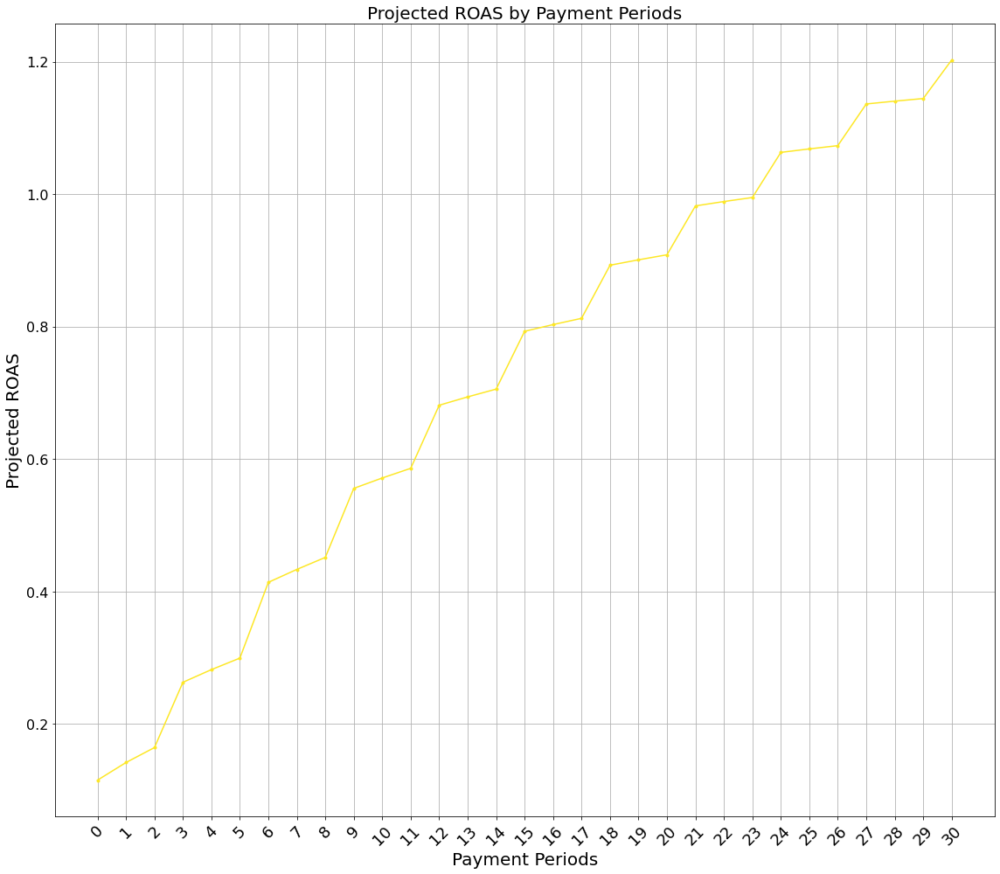

In [130]:
m0_values = [0.115] # above threshold
projections_without_increaase, projections_with_increase = extrapolate_cohorts_roas_given_m0_values(m0_values, 0.5, very_conservative_worse_m6_churn_monthly, very_conservative_worse_m6_churn_quarterly, payment_period_to_start_collecting_25_percent_more=6)
Analyzer.plot_wide_df(
    projections_with_increase.iloc[:, :31], 
    title="Projected ROAS by Payment Periods",
    x_label="Payment Periods",
    y_label="Projected ROAS",
    font_size=20,
    add_legend=False)

The process here is similar as the above M3 selection section 

In [131]:
projections_with_increase.iloc[0:1, 0:31]

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
cohort_(0.115),0.115,0.141603,0.164215,0.262809,0.281923,0.299316,0.41375,0.433262,0.451409,0.555663,...,0.982311,0.988881,0.994991,1.06311,1.0684,1.07331,1.13626,1.14051,1.14447,1.20273


In [132]:
projections_without_increaase.index = ["m6_threshold_cohort_(0.115)"]
projections_without_increaase.iloc[0:1, 0:31]

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
m6_threshold_cohort_(0.115),0.115,0.141603,0.164215,0.262809,0.281923,0.299316,0.390863,0.406473,0.42099,0.504394,...,0.845712,0.850968,0.855856,0.910354,0.914581,0.918513,0.968874,0.972275,0.975437,1.02205


In [133]:
very_conservative_thresholds = pd.concat([very_conservative_thresholds, projections_without_increaase.iloc[0:1, 0:31]])
very_conservative_thresholds = pd.concat([very_conservative_thresholds, Analyzer.uncumulate_df_across_columns(projections_without_increaase.iloc[0:1, 0:31])])
very_conservative_thresholds

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
cohort_(0.144),0.144,0.177311,0.205626,0.323928,0.346734,0.367488,0.473373,0.491323,0.508016,0.604497,...,0.998931,1.00497,1.0106,1.07367,1.07853,1.08306,1.14135,1.14526,1.1489,1.20285
cohort_(0.144),0.144,0.0333114,0.0283147,0.118302,0.0228061,0.0207535,0.105885,0.0179497,0.0166933,0.0964813,...,0.0683712,0.00604369,0.00562063,0.0630781,0.00486128,0.00452099,0.0582951,0.00391021,0.00363649,0.0539566
cohort_(0.115),0.115,0.141603,0.164215,0.258692,0.276906,0.29348,0.378041,0.392376,0.405707,0.482758,...,0.797757,0.802584,0.807073,0.857447,0.86133,0.86494,0.911495,0.914618,0.917522,0.960613
cohort_(0.115),0.115,0.0266029,0.0226124,0.0944771,0.0182132,0.016574,0.0845612,0.0143349,0.0133314,0.077051,...,0.054602,0.00482656,0.0044887,0.0503749,0.00388228,0.00361052,0.0465551,0.00312274,0.00290414,0.0430904
m3_threshold_cohort_(0.115),0.115,0.141603,0.164215,0.262809,0.281923,0.299316,0.387543,0.402587,0.416577,0.496956,...,0.825895,0.83096,0.835671,0.888192,0.892266,0.896055,0.94459,0.947867,0.950915,0.995835
m3_threshold_cohort_(0.115),0.115,0.0266029,0.0226124,0.098594,0.0191136,0.0173934,0.0882267,0.0150435,0.0139905,0.0803787,...,0.0569334,0.00506517,0.00471061,0.0525211,0.00407421,0.00378901,0.0485349,0.00327712,0.00304772,0.0449198
m6_threshold_cohort_(0.115),0.115,0.141603,0.164215,0.262809,0.281923,0.299316,0.390863,0.406473,0.42099,0.504394,...,0.845712,0.850968,0.855856,0.910354,0.914581,0.918513,0.968874,0.972275,0.975437,1.02205
m6_threshold_cohort_(0.115),0.115,0.0266029,0.0226124,0.098594,0.0191136,0.0173934,0.091547,0.0156097,0.014517,0.0834037,...,0.059076,0.0052558,0.00488789,0.0544978,0.00422754,0.00393161,0.0503615,0.00340045,0.00316242,0.0466103


### M9 

Again we repeat the same process as we did for M6. Tweak M9 churns (from the previously tweaaked churns) until the desired cohort is projected.

In [134]:
very_conservative_worse_m9_churn_monthly = very_conservative_worse_m6_churn_monthly.copy()
very_conservative_worse_m9_churn_quarterly = very_conservative_worse_m6_churn_quarterly.copy()

# increase by 10$ 
very_conservative_worse_m9_churn_monthly[8] -= very_conservative_worse_m9_churn_monthly[8] * 0.55
very_conservative_worse_m9_churn_quarterly[2] -= very_conservative_worse_m9_churn_quarterly[2] * 0.55
print(very_conservative_worse_m9_churn_monthly)
print(very_conservative_worse_m9_churn_quarterly)

[0.19, 0.15, 0.066, 0.095, 0.09, 0.035, 0.07, 0.07, 0.0315, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07]
[0.056999999999999995, 0.035, 0.029249999999999998, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065]


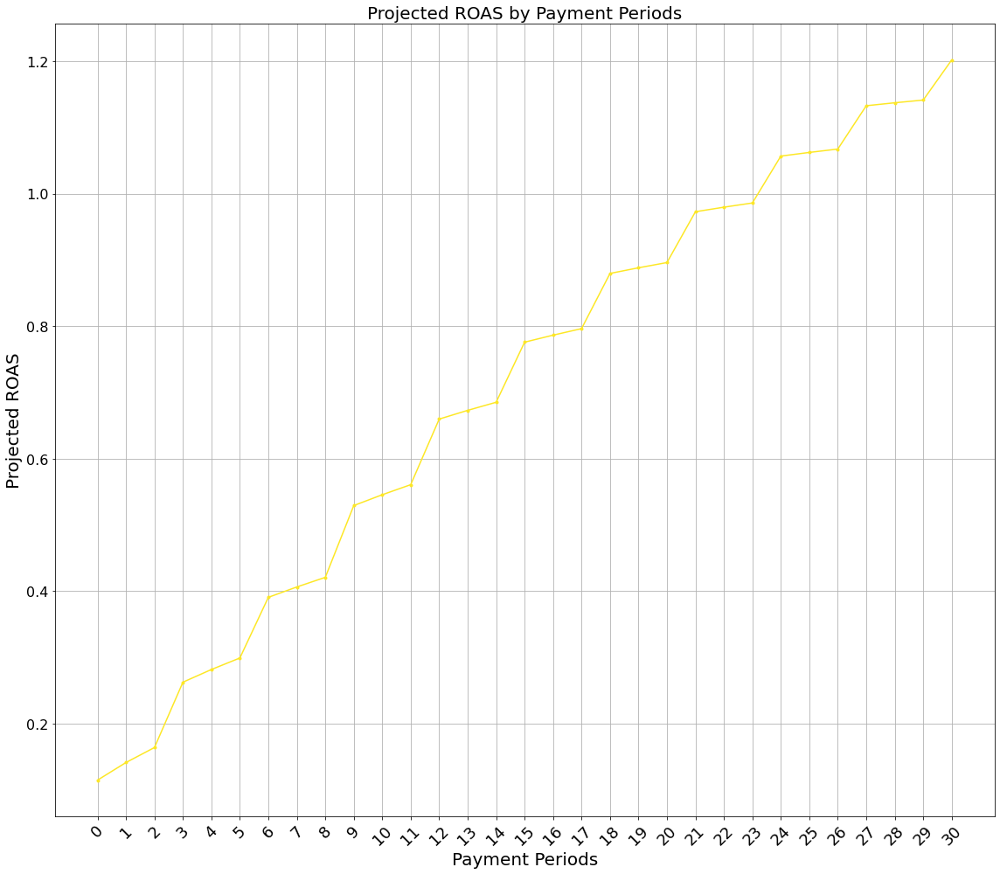

In [135]:
m0_values = [0.115] # above threshold
projections_without_increaase, projections_with_increase = extrapolate_cohorts_roas_given_m0_values(m0_values, 0.5, very_conservative_worse_m9_churn_monthly, very_conservative_worse_m9_churn_quarterly, payment_period_to_start_collecting_25_percent_more=9)
Analyzer.plot_wide_df(
    projections_with_increase.iloc[:, :31], 
    title="Projected ROAS by Payment Periods",
    x_label="Payment Periods",
    y_label="Projected ROAS",
    font_size=20,
    add_legend=False)

In [136]:
projections_with_increase.iloc[0:1, 0:31]

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
cohort_(0.115),0.115,0.141603,0.164215,0.262809,0.281923,0.299316,0.390863,0.406473,0.42099,0.529284,...,0.972658,0.979499,0.985862,1.05661,1.06211,1.06723,1.1326,1.13703,1.14114,1.20165


In [137]:
projections_without_increaase.index = ["m9_threshold_cohort_(0.115)"]
projections_without_increaase.iloc[0:1, 0:31]

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
m9_threshold_cohort_(0.115),0.115,0.141603,0.164215,0.262809,0.281923,0.299316,0.390863,0.406473,0.42099,0.507625,...,0.862324,0.867798,0.872888,0.929484,0.933886,0.937981,0.990279,0.993821,0.997114,1.04552


In [138]:
very_conservative_thresholds = pd.concat([very_conservative_thresholds, projections_without_increaase.iloc[0:1, 0:31]])
very_conservative_thresholds = pd.concat([very_conservative_thresholds, Analyzer.uncumulate_df_across_columns(projections_without_increaase.iloc[0:1, 0:31])])
very_conservative_thresholds

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
cohort_(0.144),0.144,0.177311,0.205626,0.323928,0.346734,0.367488,0.473373,0.491323,0.508016,0.604497,...,0.998931,1.00497,1.0106,1.07367,1.07853,1.08306,1.14135,1.14526,1.1489,1.20285
cohort_(0.144),0.144,0.0333114,0.0283147,0.118302,0.0228061,0.0207535,0.105885,0.0179497,0.0166933,0.0964813,...,0.0683712,0.00604369,0.00562063,0.0630781,0.00486128,0.00452099,0.0582951,0.00391021,0.00363649,0.0539566
cohort_(0.115),0.115,0.141603,0.164215,0.258692,0.276906,0.29348,0.378041,0.392376,0.405707,0.482758,...,0.797757,0.802584,0.807073,0.857447,0.86133,0.86494,0.911495,0.914618,0.917522,0.960613
cohort_(0.115),0.115,0.0266029,0.0226124,0.0944771,0.0182132,0.016574,0.0845612,0.0143349,0.0133314,0.077051,...,0.054602,0.00482656,0.0044887,0.0503749,0.00388228,0.00361052,0.0465551,0.00312274,0.00290414,0.0430904
m3_threshold_cohort_(0.115),0.115,0.141603,0.164215,0.262809,0.281923,0.299316,0.387543,0.402587,0.416577,0.496956,...,0.825895,0.83096,0.835671,0.888192,0.892266,0.896055,0.94459,0.947867,0.950915,0.995835
m3_threshold_cohort_(0.115),0.115,0.0266029,0.0226124,0.098594,0.0191136,0.0173934,0.0882267,0.0150435,0.0139905,0.0803787,...,0.0569334,0.00506517,0.00471061,0.0525211,0.00407421,0.00378901,0.0485349,0.00327712,0.00304772,0.0449198
m6_threshold_cohort_(0.115),0.115,0.141603,0.164215,0.262809,0.281923,0.299316,0.390863,0.406473,0.42099,0.504394,...,0.845712,0.850968,0.855856,0.910354,0.914581,0.918513,0.968874,0.972275,0.975437,1.02205
m6_threshold_cohort_(0.115),0.115,0.0266029,0.0226124,0.098594,0.0191136,0.0173934,0.091547,0.0156097,0.014517,0.0834037,...,0.059076,0.0052558,0.00488789,0.0544978,0.00422754,0.00393161,0.0503615,0.00340045,0.00316242,0.0466103
m9_threshold_cohort_(0.115),0.115,0.141603,0.164215,0.262809,0.281923,0.299316,0.390863,0.406473,0.42099,0.507625,...,0.862324,0.867798,0.872888,0.929484,0.933886,0.937981,0.990279,0.993821,0.997114,1.04552
m9_threshold_cohort_(0.115),0.115,0.0266029,0.0226124,0.098594,0.0191136,0.0173934,0.091547,0.0156097,0.014517,0.0866353,...,0.0613527,0.00547338,0.00509024,0.0565959,0.00440255,0.00409437,0.0522987,0.00354122,0.00329334,0.0484018


### M12

Repeat the process for M12

In [139]:
very_conservative_worse_m12_churn_monthly = very_conservative_worse_m9_churn_monthly.copy()
conservative_worse_m12_churn_quarterly = very_conservative_worse_m9_churn_quarterly.copy()

# increase by 10$ 
very_conservative_worse_m12_churn_monthly[11] -= very_conservative_worse_m12_churn_monthly[11] * 0.6
conservative_worse_m12_churn_quarterly[3] -= conservative_worse_m12_churn_quarterly[3] * 0.6
print(very_conservative_worse_m12_churn_monthly)
print(conservative_worse_m12_churn_quarterly)

[0.19, 0.15, 0.066, 0.095, 0.09, 0.035, 0.07, 0.07, 0.0315, 0.07, 0.07, 0.028000000000000004, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07]
[0.056999999999999995, 0.035, 0.029249999999999998, 0.026000000000000002, 0.065, 0.065, 0.065, 0.065, 0.065, 0.065]


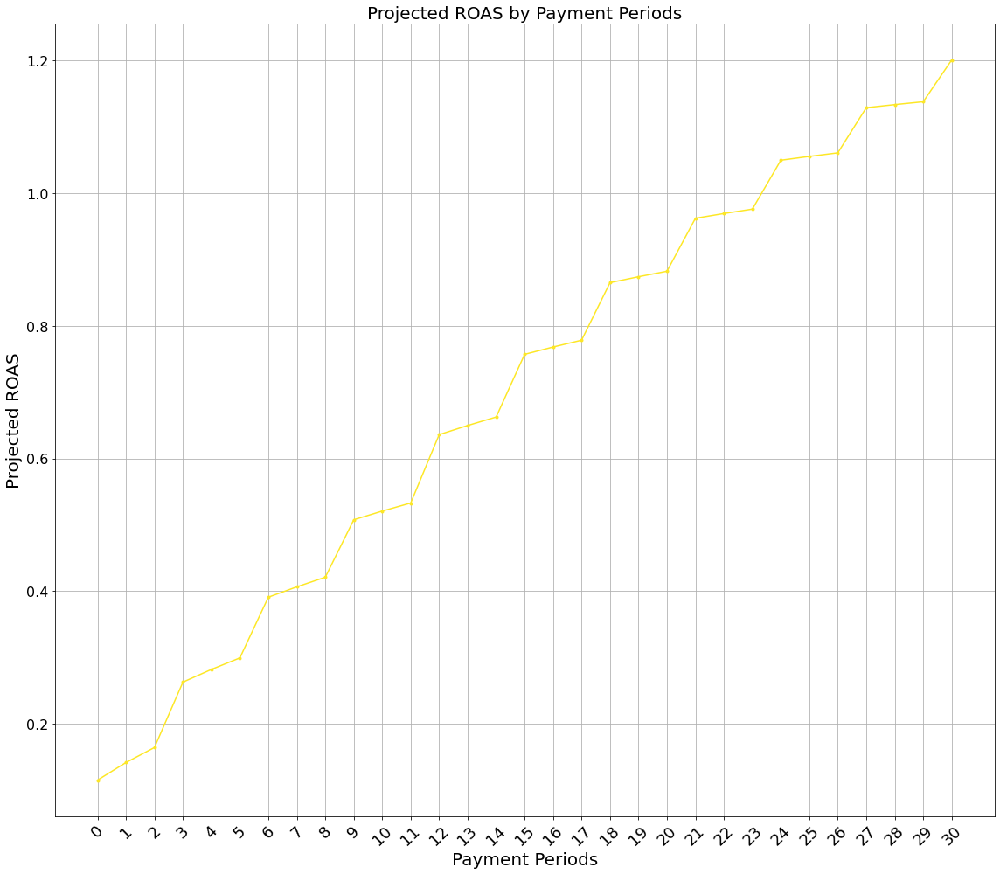

In [140]:
m0_values = [0.115] # above threshold
projections_without_increaase, projections_with_increase = extrapolate_cohorts_roas_given_m0_values(m0_values, 0.5, very_conservative_worse_m12_churn_monthly, conservative_worse_m12_churn_quarterly, payment_period_to_start_collecting_25_percent_more=12)
Analyzer.plot_wide_df(
    projections_with_increase.iloc[:, :31], 
    title="Projected ROAS by Payment Periods",
    x_label="Payment Periods",
    y_label="Projected ROAS",
    font_size=20,
    add_legend=False)


In [141]:
projections_with_increase.iloc[0:1, 0:31]

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
cohort_(0.115),0.115,0.141603,0.164215,0.262809,0.281923,0.299316,0.390863,0.406473,0.42099,0.507625,...,0.962227,0.969378,0.976028,1.04974,1.0555,1.06085,1.12896,1.13359,1.13789,1.20093


In [142]:
projections_without_increaase.index = ["m12_threshold_cohort_(0.115)"]
projections_without_increaase.iloc[0:1, 0:31]

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
m12_threshold_cohort_(0.115),0.115,0.141603,0.164215,0.262809,0.281923,0.299316,0.390863,0.406473,0.42099,0.507625,...,0.876354,0.882075,0.887395,0.946368,0.950969,0.955248,1.00974,1.01344,1.01688,1.06732


In [143]:
very_conservative_thresholds = pd.concat([very_conservative_thresholds, projections_without_increaase.iloc[0:1, 0:31]])
very_conservative_thresholds = pd.concat([very_conservative_thresholds, Analyzer.uncumulate_df_across_columns(projections_without_increaase.iloc[0:1, 0:31])])
very_conservative_thresholds

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
cohort_(0.144),0.144,0.177311,0.205626,0.323928,0.346734,0.367488,0.473373,0.491323,0.508016,0.604497,...,0.998931,1.00497,1.0106,1.07367,1.07853,1.08306,1.14135,1.14526,1.1489,1.20285
cohort_(0.144),0.144,0.0333114,0.0283147,0.118302,0.0228061,0.0207535,0.105885,0.0179497,0.0166933,0.0964813,...,0.0683712,0.00604369,0.00562063,0.0630781,0.00486128,0.00452099,0.0582951,0.00391021,0.00363649,0.0539566
cohort_(0.115),0.115,0.141603,0.164215,0.258692,0.276906,0.29348,0.378041,0.392376,0.405707,0.482758,...,0.797757,0.802584,0.807073,0.857447,0.86133,0.86494,0.911495,0.914618,0.917522,0.960613
cohort_(0.115),0.115,0.0266029,0.0226124,0.0944771,0.0182132,0.016574,0.0845612,0.0143349,0.0133314,0.077051,...,0.054602,0.00482656,0.0044887,0.0503749,0.00388228,0.00361052,0.0465551,0.00312274,0.00290414,0.0430904
m3_threshold_cohort_(0.115),0.115,0.141603,0.164215,0.262809,0.281923,0.299316,0.387543,0.402587,0.416577,0.496956,...,0.825895,0.83096,0.835671,0.888192,0.892266,0.896055,0.94459,0.947867,0.950915,0.995835
m3_threshold_cohort_(0.115),0.115,0.0266029,0.0226124,0.098594,0.0191136,0.0173934,0.0882267,0.0150435,0.0139905,0.0803787,...,0.0569334,0.00506517,0.00471061,0.0525211,0.00407421,0.00378901,0.0485349,0.00327712,0.00304772,0.0449198
m6_threshold_cohort_(0.115),0.115,0.141603,0.164215,0.262809,0.281923,0.299316,0.390863,0.406473,0.42099,0.504394,...,0.845712,0.850968,0.855856,0.910354,0.914581,0.918513,0.968874,0.972275,0.975437,1.02205
m6_threshold_cohort_(0.115),0.115,0.0266029,0.0226124,0.098594,0.0191136,0.0173934,0.091547,0.0156097,0.014517,0.0834037,...,0.059076,0.0052558,0.00488789,0.0544978,0.00422754,0.00393161,0.0503615,0.00340045,0.00316242,0.0466103
m9_threshold_cohort_(0.115),0.115,0.141603,0.164215,0.262809,0.281923,0.299316,0.390863,0.406473,0.42099,0.507625,...,0.862324,0.867798,0.872888,0.929484,0.933886,0.937981,0.990279,0.993821,0.997114,1.04552
m9_threshold_cohort_(0.115),0.115,0.0266029,0.0226124,0.098594,0.0191136,0.0173934,0.091547,0.0156097,0.014517,0.0866353,...,0.0613527,0.00547338,0.00509024,0.0565959,0.00440255,0.00409437,0.0522987,0.00354122,0.00329334,0.0484018


In [144]:
very_conservative_thresholds.to_excel("roas_very_conservative_thresholds.xlsx") 

## THRESHOLDS USING VERY CONSERVATIVE CHURNS

Repeat the same process but this time use the selected very conservative churns

In [145]:
conservative_thresholds = pd.DataFrame()

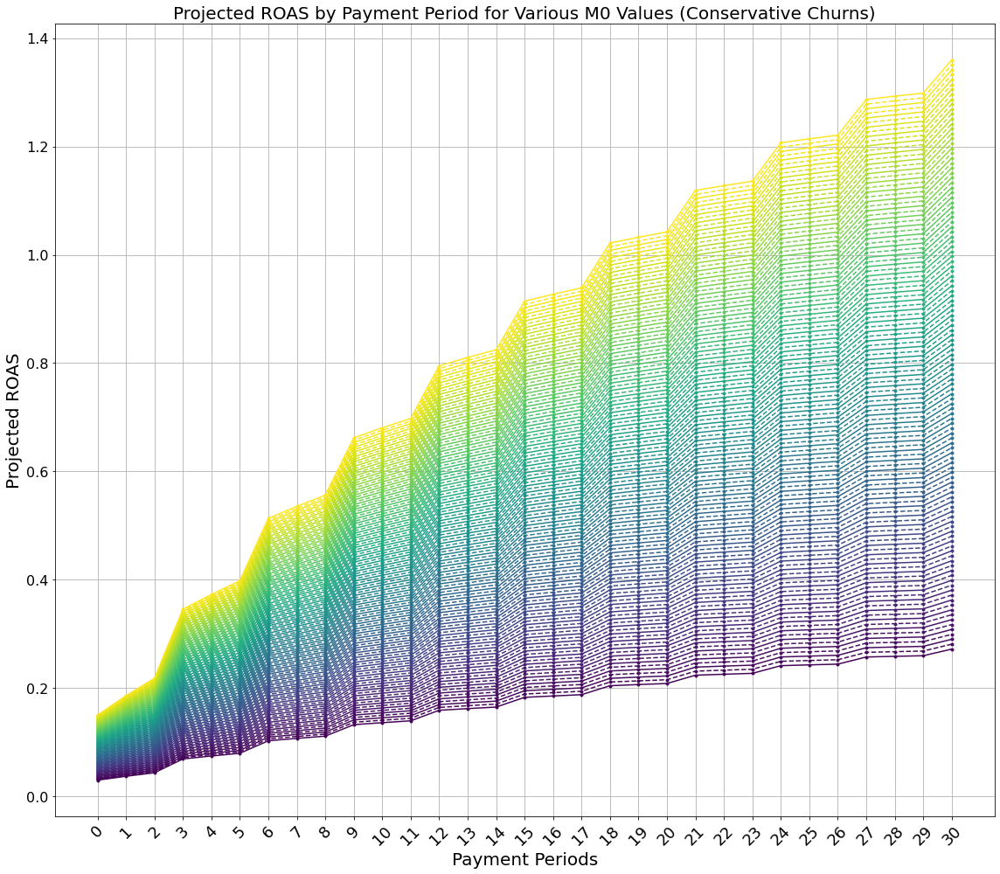

In [146]:
# Conservative 
import numpy as np 
m0_values = [round(x, 3) for x in np.arange(0.15, 0.03, -0.0001)]
projections_without_increase, projections_with_increase = extrapolate_cohorts_roas_given_m0_values(m0_values, 0.5, conservative_monthly_churns, conservative_quarterly_churns, payment_period_to_start_collecting_25_percent_more=None)
Analyzer.plot_wide_df(
    projections_without_increase.iloc[:, :31], 
    title="Projected ROAS by Payment Period for Various M0 Values (Conservative Churns)",   
    x_label="Payment Periods",
    y_label="Projected ROAS",
    font_size=20,
    add_legend=False)

In [147]:
filtered = projections_without_increase.loc[(projections_without_increase[30] > 1.19) & (projections_without_increase[30] < 1.21)]
filtered.iloc[0:1, 0:31]

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
cohort_(0.133),0.133,0.164716,0.19342,0.30648,0.330641,0.35299,0.455175,0.474817,0.493281,0.587049,...,0.992021,0.999785,1.00708,1.07002,1.07647,1.08253,1.14095,1.1463,1.15134,1.20562


In [148]:
conservative_thresholds = pd.concat([conservative_thresholds, filtered.iloc[0:1, 0:31]])
conservative_thresholds = pd.concat([conservative_thresholds, Analyzer.uncumulate_df_across_columns(filtered.iloc[0:1, 0:31])])
conservative_thresholds

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
cohort_(0.133),0.133,0.164716,0.19342,0.30648,0.330641,0.35299,0.455175,0.474817,0.493281,0.587049,...,0.992021,0.999785,1.00708,1.07002,1.07647,1.08253,1.14095,1.1463,1.15134,1.20562
cohort_(0.133),0.133,0.0317164,0.0287033,0.11306,0.024161,0.022349,0.102185,0.0196425,0.0184639,0.0937676,...,0.0679183,0.00776452,0.00729865,0.0629394,0.00644908,0.00606214,0.0584124,0.00535651,0.00503512,0.0542841


### Conservative Churns + Increase in Collection amount (from 80% to 100%)

#### M0

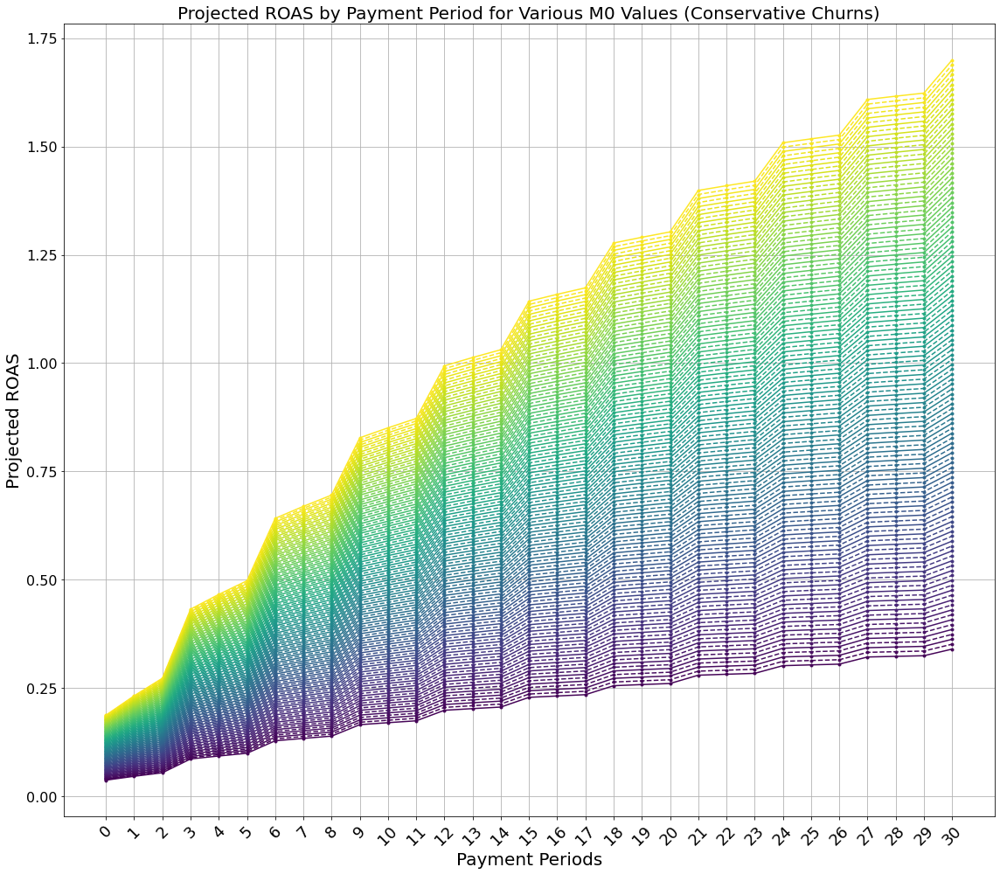

In [149]:
m0_values = [round(x, 3) for x in np.arange(0.15, 0.03, -0.0001)]
projections_without_increaase, projections_with_increase = extrapolate_cohorts_roas_given_m0_values(m0_values, 0.5, conservative_monthly_churns, conservative_quarterly_churns, payment_period_to_start_collecting_25_percent_more=0)
Analyzer.plot_wide_df(
    projections_with_increase.iloc[:, :31], 
    title="Projected ROAS by Payment Period for Various M0 Values (Conservative Churns)",
    x_label="Payment Periods",
    y_label="Projected ROAS",
    font_size=20,
    add_legend=False)

In [150]:
filterred_with_increase = projections_with_increase[(projections_with_increase[30] > 1.19) & (projections_with_increase[30] < 1.21)]
filterred_with_increase.iloc[0:1, 0:31]   

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
cohort_(0.106),0.1325,0.164097,0.192693,0.305327,0.329398,0.351663,0.453464,0.473032,0.491427,0.584842,...,0.988291,0.996027,1.0033,1.066,1.07243,1.07847,1.13666,1.14199,1.14701,1.20109


In [151]:
filtered_without_increase = projections_without_increaase[(projections_with_increase[30] > 1.19) & (projections_with_increase[30] < 1.21)]
filtered_without_increase.iloc[0:1, 0:31]

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
cohort_(0.106),0.106,0.131278,0.154154,0.244262,0.263518,0.28133,0.362771,0.378426,0.393141,0.467873,...,0.790633,0.796821,0.802638,0.852801,0.857941,0.862772,0.909326,0.913595,0.917608,0.960872


In [152]:
conservative_thresholds = pd.concat([conservative_thresholds, filtered_without_increase.iloc[0:1, 0:31]])
conservative_thresholds = pd.concat([conservative_thresholds, Analyzer.uncumulate_df_across_columns(filtered_without_increase.iloc[0:1, 0:31])])
conservative_thresholds

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
cohort_(0.133),0.133,0.164716,0.19342,0.30648,0.330641,0.35299,0.455175,0.474817,0.493281,0.587049,...,0.992021,0.999785,1.00708,1.07002,1.07647,1.08253,1.14095,1.1463,1.15134,1.20562
cohort_(0.133),0.133,0.0317164,0.0287033,0.11306,0.024161,0.022349,0.102185,0.0196425,0.0184639,0.0937676,...,0.0679183,0.00776452,0.00729865,0.0629394,0.00644908,0.00606214,0.0584124,0.00535651,0.00503512,0.0542841
cohort_(0.106),0.106,0.131278,0.154154,0.244262,0.263518,0.28133,0.362771,0.378426,0.393141,0.467873,...,0.790633,0.796821,0.802638,0.852801,0.857941,0.862772,0.909326,0.913595,0.917608,0.960872
cohort_(0.106),0.106,0.0252777,0.0228763,0.0901079,0.0192562,0.0178119,0.0814407,0.0156549,0.0147156,0.0747321,...,0.0541304,0.00618826,0.00581697,0.0501622,0.00513987,0.00483148,0.0465542,0.0042691,0.00401295,0.0432641


#### M3

In [153]:
print(conservative_monthly_churns)
print(conservative_quarterly_churns)

[0.165, 0.095, 0.09, 0.075, 0.075, 0.065, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06]
[0.085, 0.065, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06]


In [154]:
conservative_worse_m3_churn_monthly = conservative_monthly_churns.copy()
conservative_worse_m3_churn_quarterly = conservative_quarterly_churns.copy()

# increase by 10$ 
conservative_worse_m3_churn_monthly[2] -= conservative_worse_m3_churn_monthly[2] * 0.4
conservative_worse_m3_churn_quarterly[0] -= conservative_worse_m3_churn_quarterly[0] * 0.4
print(conservative_worse_m3_churn_monthly)
print(conservative_worse_m3_churn_quarterly)

[0.165, 0.095, 0.054, 0.075, 0.075, 0.065, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06]
[0.051000000000000004, 0.065, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06]


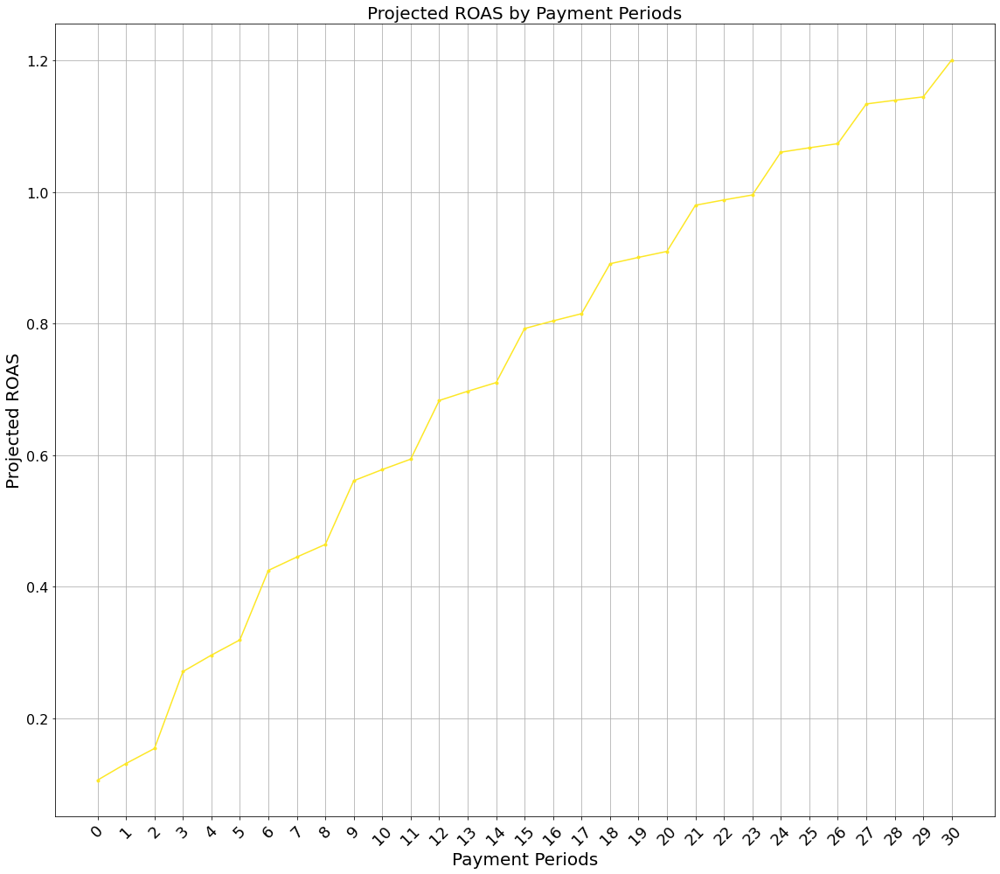

In [155]:
m0_values = [0.106] # above threshold
projections_without_increaase, projections_with_increase = extrapolate_cohorts_roas_given_m0_values(m0_values, 0.5, conservative_worse_m3_churn_monthly, conservative_worse_m3_churn_quarterly, payment_period_to_start_collecting_25_percent_more=3)
Analyzer.plot_wide_df(
    projections_with_increase.iloc[:, :31], 
    title="Projected ROAS by Payment Periods",
    x_label="Payment Periods",
    y_label="Projected ROAS",
    font_size=20,
    add_legend=False)

In [156]:
projections_with_increase.iloc[0:1, 0:31]

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
cohort_(0.106),0.106,0.131278,0.154154,0.271037,0.296059,0.319205,0.424839,0.445182,0.464304,0.561232,...,0.980014,0.988055,0.995614,1.06066,1.06734,1.07362,1.13399,1.13954,1.14475,1.20085


In [157]:
projections_without_increaase.index = ["m3_threshold_cohort_(0.106)"]
projections_without_increaase.iloc[0:1, 0:31]

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
m3_threshold_cohort_(0.106),0.106,0.131278,0.154154,0.24766,0.267678,0.286195,0.370702,0.386976,0.402274,0.479816,...,0.814842,0.821275,0.827322,0.879361,0.884705,0.889727,0.938022,0.94246,0.946632,0.991513


In [158]:
conservative_thresholds = pd.concat([conservative_thresholds, projections_without_increaase.iloc[0:1, 0:31]])
conservative_thresholds = pd.concat([conservative_thresholds, Analyzer.uncumulate_df_across_columns(projections_without_increaase.iloc[0:1, 0:31])])
conservative_thresholds

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
cohort_(0.133),0.133,0.164716,0.19342,0.30648,0.330641,0.35299,0.455175,0.474817,0.493281,0.587049,...,0.992021,0.999785,1.00708,1.07002,1.07647,1.08253,1.14095,1.1463,1.15134,1.20562
cohort_(0.133),0.133,0.0317164,0.0287033,0.11306,0.024161,0.022349,0.102185,0.0196425,0.0184639,0.0937676,...,0.0679183,0.00776452,0.00729865,0.0629394,0.00644908,0.00606214,0.0584124,0.00535651,0.00503512,0.0542841
cohort_(0.106),0.106,0.131278,0.154154,0.244262,0.263518,0.28133,0.362771,0.378426,0.393141,0.467873,...,0.790633,0.796821,0.802638,0.852801,0.857941,0.862772,0.909326,0.913595,0.917608,0.960872
cohort_(0.106),0.106,0.0252777,0.0228763,0.0901079,0.0192562,0.0178119,0.0814407,0.0156549,0.0147156,0.0747321,...,0.0541304,0.00618826,0.00581697,0.0501622,0.00513987,0.00483148,0.0465542,0.0042691,0.00401295,0.0432641
m3_threshold_cohort_(0.106),0.106,0.131278,0.154154,0.24766,0.267678,0.286195,0.370702,0.386976,0.402274,0.479816,...,0.814842,0.821275,0.827322,0.879361,0.884705,0.889727,0.938022,0.94246,0.946632,0.991513
m3_threshold_cohort_(0.106),0.106,0.0252777,0.0228763,0.0935062,0.0200179,0.0185166,0.084507,0.0162742,0.0152978,0.0775422,...,0.0561576,0.00643307,0.00604709,0.0520393,0.00534321,0.00502261,0.048295,0.00443798,0.0041717,0.0448807


#### M6

In [159]:
print(conservative_worse_m3_churn_monthly)
print(conservative_worse_m3_churn_quarterly)

[0.165, 0.095, 0.054, 0.075, 0.075, 0.065, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06]
[0.051000000000000004, 0.065, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06]


In [160]:
conservative_worse_m6_churn_monthly = conservative_worse_m3_churn_monthly.copy()
conservative_worse_m6_churn_quarterly = conservative_worse_m3_churn_quarterly.copy()

# increase by 10$ 
conservative_worse_m6_churn_monthly[5] -= conservative_worse_m6_churn_monthly[5] * 0.55
conservative_worse_m6_churn_quarterly[1] -= conservative_worse_m6_churn_quarterly[1] * 0.55
print(conservative_worse_m6_churn_monthly)
print(conservative_worse_m6_churn_quarterly)

[0.165, 0.095, 0.054, 0.075, 0.075, 0.029249999999999998, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06]
[0.051000000000000004, 0.029249999999999998, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06]


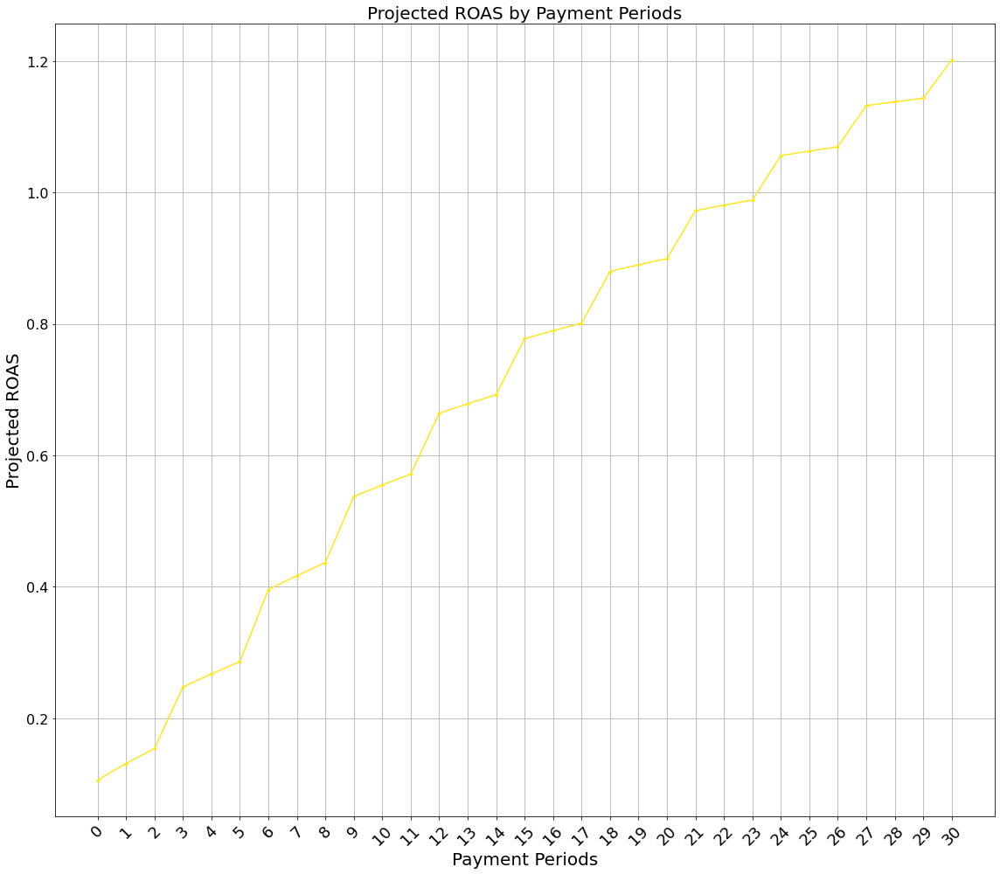

In [161]:
m0_values = [0.106] # above threshold
projections_without_increaase, projections_with_increase = extrapolate_cohorts_roas_given_m0_values(m0_values, 0.5, conservative_worse_m6_churn_monthly, conservative_worse_m6_churn_quarterly, payment_period_to_start_collecting_25_percent_more=6)
Analyzer.plot_wide_df(
    projections_with_increase.iloc[:, :31], 
    title="Projected ROAS by Payment Periods",
    x_label="Payment Periods",
    y_label="Projected ROAS",
    font_size=20,
    add_legend=False)

In [162]:
projections_with_increase.iloc[0:1, 0:31]   

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
cohort_(0.106),0.106,0.131278,0.154154,0.24766,0.267678,0.286195,0.395867,0.416988,0.436841,0.537475,...,0.97227,0.980619,0.988466,1.056,1.06294,1.06946,1.13213,1.13789,1.14331,1.20155


In [163]:
projections_without_increaase.index = ["m6_threshold_cohort_(0.106)"]
projections_without_increaase.iloc[0:1, 0:31]

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
m6_threshold_cohort_(0.106),0.106,0.131278,0.154154,0.24766,0.267678,0.286195,0.373933,0.390829,0.406712,0.487219,...,0.835055,0.841734,0.848012,0.902041,0.907589,0.912803,0.962945,0.967553,0.971884,1.01848


In [164]:
conservative_thresholds = pd.concat([conservative_thresholds, projections_without_increaase.iloc[0:1, 0:31]])
conservative_thresholds = pd.concat([conservative_thresholds, Analyzer.uncumulate_df_across_columns(projections_without_increaase.iloc[0:1, 0:31])])
conservative_thresholds

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
cohort_(0.133),0.133,0.164716,0.19342,0.30648,0.330641,0.35299,0.455175,0.474817,0.493281,0.587049,...,0.992021,0.999785,1.00708,1.07002,1.07647,1.08253,1.14095,1.1463,1.15134,1.20562
cohort_(0.133),0.133,0.0317164,0.0287033,0.11306,0.024161,0.022349,0.102185,0.0196425,0.0184639,0.0937676,...,0.0679183,0.00776452,0.00729865,0.0629394,0.00644908,0.00606214,0.0584124,0.00535651,0.00503512,0.0542841
cohort_(0.106),0.106,0.131278,0.154154,0.244262,0.263518,0.28133,0.362771,0.378426,0.393141,0.467873,...,0.790633,0.796821,0.802638,0.852801,0.857941,0.862772,0.909326,0.913595,0.917608,0.960872
cohort_(0.106),0.106,0.0252777,0.0228763,0.0901079,0.0192562,0.0178119,0.0814407,0.0156549,0.0147156,0.0747321,...,0.0541304,0.00618826,0.00581697,0.0501622,0.00513987,0.00483148,0.0465542,0.0042691,0.00401295,0.0432641
m3_threshold_cohort_(0.106),0.106,0.131278,0.154154,0.24766,0.267678,0.286195,0.370702,0.386976,0.402274,0.479816,...,0.814842,0.821275,0.827322,0.879361,0.884705,0.889727,0.938022,0.94246,0.946632,0.991513
m3_threshold_cohort_(0.106),0.106,0.0252777,0.0228763,0.0935062,0.0200179,0.0185166,0.084507,0.0162742,0.0152978,0.0775422,...,0.0561576,0.00643307,0.00604709,0.0520393,0.00534321,0.00502261,0.048295,0.00443798,0.0041717,0.0448807
m6_threshold_cohort_(0.106),0.106,0.131278,0.154154,0.24766,0.267678,0.286195,0.373933,0.390829,0.406712,0.487219,...,0.835055,0.841734,0.848012,0.902041,0.907589,0.912803,0.962945,0.967553,0.971884,1.01848
m6_threshold_cohort_(0.106),0.106,0.0252777,0.0228763,0.0935062,0.0200179,0.0185166,0.0877381,0.0168965,0.0158827,0.0805071,...,0.0583048,0.00667904,0.0062783,0.0540291,0.00554751,0.00521466,0.0501416,0.00460767,0.00433121,0.0465968


#### M9

In [165]:
print(conservative_worse_m6_churn_monthly)
print(conservative_worse_m6_churn_quarterly)

[0.165, 0.095, 0.054, 0.075, 0.075, 0.029249999999999998, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06]
[0.051000000000000004, 0.029249999999999998, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06]


In [166]:
conservative_worse_m9_churn_monthly = conservative_worse_m6_churn_monthly.copy()
conservative_worse_m9_churn_quarterly = conservative_worse_m6_churn_quarterly.copy()

# increase by 10$ 
conservative_worse_m9_churn_monthly[8] -= conservative_worse_m9_churn_monthly[8] * 0.6
conservative_worse_m9_churn_quarterly[2] -= conservative_worse_m9_churn_quarterly[2] * 0.6
print(conservative_worse_m9_churn_monthly)
print(conservative_worse_m9_churn_quarterly)

[0.165, 0.095, 0.054, 0.075, 0.075, 0.029249999999999998, 0.06, 0.06, 0.024, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06]
[0.051000000000000004, 0.029249999999999998, 0.024, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06]


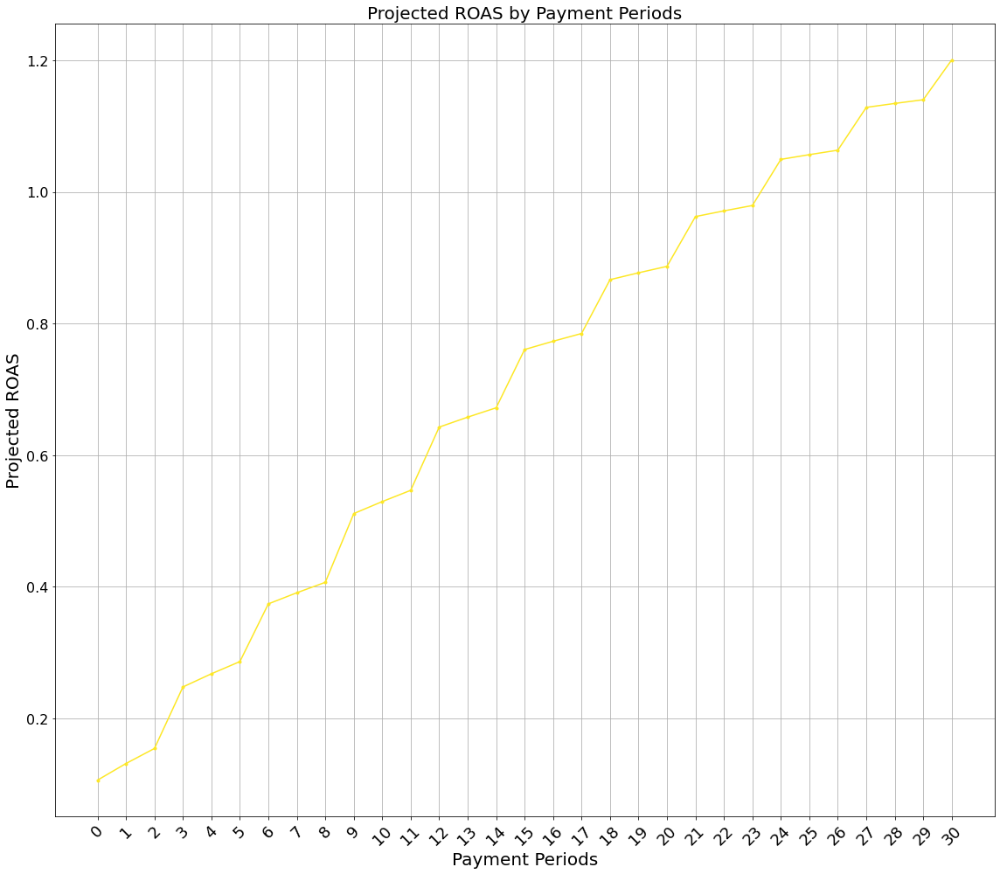

In [167]:
m0_values = [0.106] # above threshold
projections_without_increaase, projections_with_increase = extrapolate_cohorts_roas_given_m0_values(m0_values, 0.5, conservative_worse_m9_churn_monthly, conservative_worse_m9_churn_quarterly, payment_period_to_start_collecting_25_percent_more=9)
Analyzer.plot_wide_df(
    projections_with_increase.iloc[:, :31], 
    title="Projected ROAS by Payment Periods",  
    x_label="Payment Periods",
    y_label="Projected ROAS",
    font_size=20,
    add_legend=False)

In [168]:
projections_with_increase.iloc[0:1, 0:31]

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
cohort_(0.106),0.106,0.131278,0.154154,0.24766,0.267678,0.286195,0.373933,0.390829,0.406712,0.5112,...,0.962646,0.971315,0.979463,1.04959,1.05679,1.06355,1.12863,1.13461,1.14023,1.20071


In [169]:
projections_without_increaase.index = ["m9_threshold_cohort_(0.106)"]
projections_without_increaase.iloc[0:1, 0:31]

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
m9_threshold_cohort_(0.106),0.106,0.131278,0.154154,0.24766,0.267678,0.286195,0.373933,0.390829,0.406712,0.490302,...,0.851459,0.858394,0.864913,0.921011,0.926771,0.932186,0.984247,0.989032,0.993529,1.04191


In [170]:
conservative_thresholds = pd.concat([conservative_thresholds, projections_without_increaase.iloc[0:1, 0:31]]) 
conservative_thresholds = pd.concat([conservative_thresholds, Analyzer.uncumulate_df_across_columns(projections_without_increaase.iloc[0:1, 0:31])])  
conservative_thresholds

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
cohort_(0.133),0.133,0.164716,0.19342,0.30648,0.330641,0.35299,0.455175,0.474817,0.493281,0.587049,...,0.992021,0.999785,1.00708,1.07002,1.07647,1.08253,1.14095,1.1463,1.15134,1.20562
cohort_(0.133),0.133,0.0317164,0.0287033,0.11306,0.024161,0.022349,0.102185,0.0196425,0.0184639,0.0937676,...,0.0679183,0.00776452,0.00729865,0.0629394,0.00644908,0.00606214,0.0584124,0.00535651,0.00503512,0.0542841
cohort_(0.106),0.106,0.131278,0.154154,0.244262,0.263518,0.28133,0.362771,0.378426,0.393141,0.467873,...,0.790633,0.796821,0.802638,0.852801,0.857941,0.862772,0.909326,0.913595,0.917608,0.960872
cohort_(0.106),0.106,0.0252777,0.0228763,0.0901079,0.0192562,0.0178119,0.0814407,0.0156549,0.0147156,0.0747321,...,0.0541304,0.00618826,0.00581697,0.0501622,0.00513987,0.00483148,0.0465542,0.0042691,0.00401295,0.0432641
m3_threshold_cohort_(0.106),0.106,0.131278,0.154154,0.24766,0.267678,0.286195,0.370702,0.386976,0.402274,0.479816,...,0.814842,0.821275,0.827322,0.879361,0.884705,0.889727,0.938022,0.94246,0.946632,0.991513
m3_threshold_cohort_(0.106),0.106,0.0252777,0.0228763,0.0935062,0.0200179,0.0185166,0.084507,0.0162742,0.0152978,0.0775422,...,0.0561576,0.00643307,0.00604709,0.0520393,0.00534321,0.00502261,0.048295,0.00443798,0.0041717,0.0448807
m6_threshold_cohort_(0.106),0.106,0.131278,0.154154,0.24766,0.267678,0.286195,0.373933,0.390829,0.406712,0.487219,...,0.835055,0.841734,0.848012,0.902041,0.907589,0.912803,0.962945,0.967553,0.971884,1.01848
m6_threshold_cohort_(0.106),0.106,0.0252777,0.0228763,0.0935062,0.0200179,0.0185166,0.0877381,0.0168965,0.0158827,0.0805071,...,0.0583048,0.00667904,0.0062783,0.0540291,0.00554751,0.00521466,0.0501416,0.00460767,0.00433121,0.0465968
m9_threshold_cohort_(0.106),0.106,0.131278,0.154154,0.24766,0.267678,0.286195,0.373933,0.390829,0.406712,0.490302,...,0.851459,0.858394,0.864913,0.921011,0.926771,0.932186,0.984247,0.989032,0.993529,1.04191
m9_threshold_cohort_(0.106),0.106,0.0252777,0.0228763,0.0935062,0.0200179,0.0185166,0.0877381,0.0168965,0.0158827,0.0835903,...,0.0605378,0.00693484,0.00651875,0.0560983,0.00575996,0.00541437,0.0520619,0.00478413,0.00449709,0.0483813


#### M12

In [171]:
print(conservative_worse_m9_churn_monthly)
print(conservative_worse_m9_churn_quarterly)

[0.165, 0.095, 0.054, 0.075, 0.075, 0.029249999999999998, 0.06, 0.06, 0.024, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06]
[0.051000000000000004, 0.029249999999999998, 0.024, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06]


In [172]:
conservative_worse_m12_churn_monthly = conservative_worse_m9_churn_monthly.copy()
conservative_worse_m12_churn_quarterly = conservative_worse_m9_churn_quarterly.copy()

# increase by 10$ 
conservative_worse_m12_churn_monthly[11] -= conservative_worse_m12_churn_monthly[11] * 0.7
conservative_worse_m12_churn_quarterly[3] -= conservative_worse_m12_churn_quarterly[3] * 0.7
print(conservative_worse_m12_churn_monthly)
print(conservative_worse_m12_churn_quarterly)

[0.165, 0.095, 0.054, 0.075, 0.075, 0.029249999999999998, 0.06, 0.06, 0.024, 0.06, 0.06, 0.018000000000000002, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06]
[0.051000000000000004, 0.029249999999999998, 0.024, 0.018000000000000002, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06]


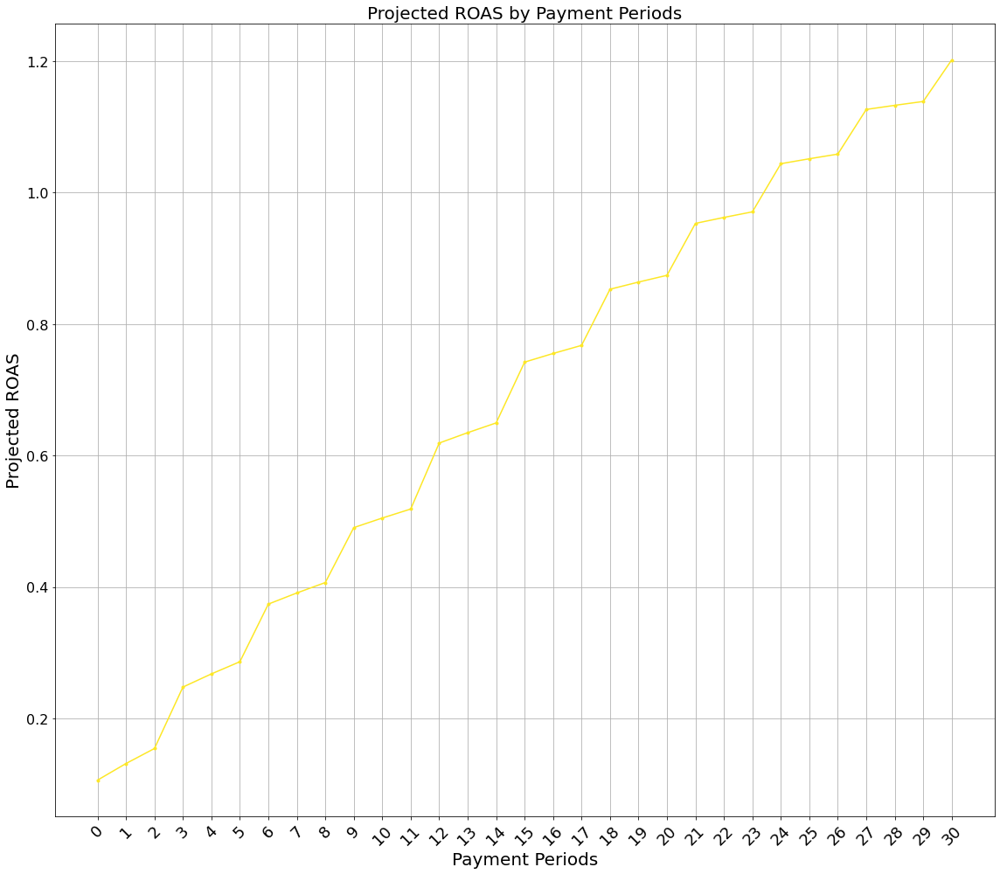

In [173]:
m0_values = [0.106] # above threshold
projections_without_increaase, projections_with_increase = extrapolate_cohorts_roas_given_m0_values(m0_values, 0.5, conservative_worse_m12_churn_monthly, conservative_worse_m12_churn_quarterly, payment_period_to_start_collecting_25_percent_more=12)
Analyzer.plot_wide_df(
    projections_with_increase.iloc[:, :31], 
    title="Projected ROAS by Payment Periods",
    x_label="Payment Periods",
    y_label="Projected ROAS",
    font_size=20,
    add_legend=False)

In [174]:
projections_with_increase.iloc[0:1, 0:31]

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
cohort_(0.106),0.106,0.131278,0.154154,0.24766,0.267678,0.286195,0.373933,0.390829,0.406712,0.490302,...,0.953274,0.96233,0.970842,1.0441,1.05162,1.05869,1.12668,1.13292,1.1388,1.20197


In [175]:
projections_without_increaase.index = ["m9_threshold_cohort_(0.106)"]
projections_without_increaase.iloc[0:1, 0:31]

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
m9_threshold_cohort_(0.106),0.106,0.131278,0.154154,0.24766,0.267678,0.286195,0.373933,0.390829,0.406712,0.490302,...,0.866333,0.873578,0.880388,0.938993,0.94501,0.950666,1.00505,1.01005,1.01475,1.06529


In [176]:
conservative_thresholds = pd.concat([conservative_thresholds, projections_without_increaase.iloc[0:1, 0:31]]) 
conservative_thresholds = pd.concat([conservative_thresholds, Analyzer.uncumulate_df_across_columns(projections_without_increaase.iloc[0:1, 0:31])])  
conservative_thresholds

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
cohort_(0.133),0.133,0.164716,0.19342,0.30648,0.330641,0.35299,0.455175,0.474817,0.493281,0.587049,...,0.992021,0.999785,1.00708,1.07002,1.07647,1.08253,1.14095,1.1463,1.15134,1.20562
cohort_(0.133),0.133,0.0317164,0.0287033,0.11306,0.024161,0.022349,0.102185,0.0196425,0.0184639,0.0937676,...,0.0679183,0.00776452,0.00729865,0.0629394,0.00644908,0.00606214,0.0584124,0.00535651,0.00503512,0.0542841
cohort_(0.106),0.106,0.131278,0.154154,0.244262,0.263518,0.28133,0.362771,0.378426,0.393141,0.467873,...,0.790633,0.796821,0.802638,0.852801,0.857941,0.862772,0.909326,0.913595,0.917608,0.960872
cohort_(0.106),0.106,0.0252777,0.0228763,0.0901079,0.0192562,0.0178119,0.0814407,0.0156549,0.0147156,0.0747321,...,0.0541304,0.00618826,0.00581697,0.0501622,0.00513987,0.00483148,0.0465542,0.0042691,0.00401295,0.0432641
m3_threshold_cohort_(0.106),0.106,0.131278,0.154154,0.24766,0.267678,0.286195,0.370702,0.386976,0.402274,0.479816,...,0.814842,0.821275,0.827322,0.879361,0.884705,0.889727,0.938022,0.94246,0.946632,0.991513
m3_threshold_cohort_(0.106),0.106,0.0252777,0.0228763,0.0935062,0.0200179,0.0185166,0.084507,0.0162742,0.0152978,0.0775422,...,0.0561576,0.00643307,0.00604709,0.0520393,0.00534321,0.00502261,0.048295,0.00443798,0.0041717,0.0448807
m6_threshold_cohort_(0.106),0.106,0.131278,0.154154,0.24766,0.267678,0.286195,0.373933,0.390829,0.406712,0.487219,...,0.835055,0.841734,0.848012,0.902041,0.907589,0.912803,0.962945,0.967553,0.971884,1.01848
m6_threshold_cohort_(0.106),0.106,0.0252777,0.0228763,0.0935062,0.0200179,0.0185166,0.0877381,0.0168965,0.0158827,0.0805071,...,0.0583048,0.00667904,0.0062783,0.0540291,0.00554751,0.00521466,0.0501416,0.00460767,0.00433121,0.0465968
m9_threshold_cohort_(0.106),0.106,0.131278,0.154154,0.24766,0.267678,0.286195,0.373933,0.390829,0.406712,0.490302,...,0.851459,0.858394,0.864913,0.921011,0.926771,0.932186,0.984247,0.989032,0.993529,1.04191
m9_threshold_cohort_(0.106),0.106,0.0252777,0.0228763,0.0935062,0.0200179,0.0185166,0.0877381,0.0168965,0.0158827,0.0835903,...,0.0605378,0.00693484,0.00651875,0.0560983,0.00575996,0.00541437,0.0520619,0.00478413,0.00449709,0.0483813


#### M12

In [177]:
print(conservative_worse_m9_churn_monthly)
print(conservative_worse_m9_churn_quarterly)

[0.165, 0.095, 0.054, 0.075, 0.075, 0.029249999999999998, 0.06, 0.06, 0.024, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06]
[0.051000000000000004, 0.029249999999999998, 0.024, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06]


In [178]:
conservative_worse_m12_churn_monthly = conservative_worse_m9_churn_monthly.copy()
conservative_worse_m12_churn_quarterly = conservative_worse_m9_churn_quarterly.copy()

# increase by 10$ 
conservative_worse_m12_churn_monthly[11] -= conservative_worse_m12_churn_monthly[11] * 0.7
conservative_worse_m12_churn_quarterly[3] -= conservative_worse_m12_churn_quarterly[3] * 0.7
print(conservative_worse_m12_churn_monthly)
print(conservative_worse_m12_churn_quarterly)

[0.165, 0.095, 0.054, 0.075, 0.075, 0.029249999999999998, 0.06, 0.06, 0.024, 0.06, 0.06, 0.018000000000000002, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06]
[0.051000000000000004, 0.029249999999999998, 0.024, 0.018000000000000002, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06]


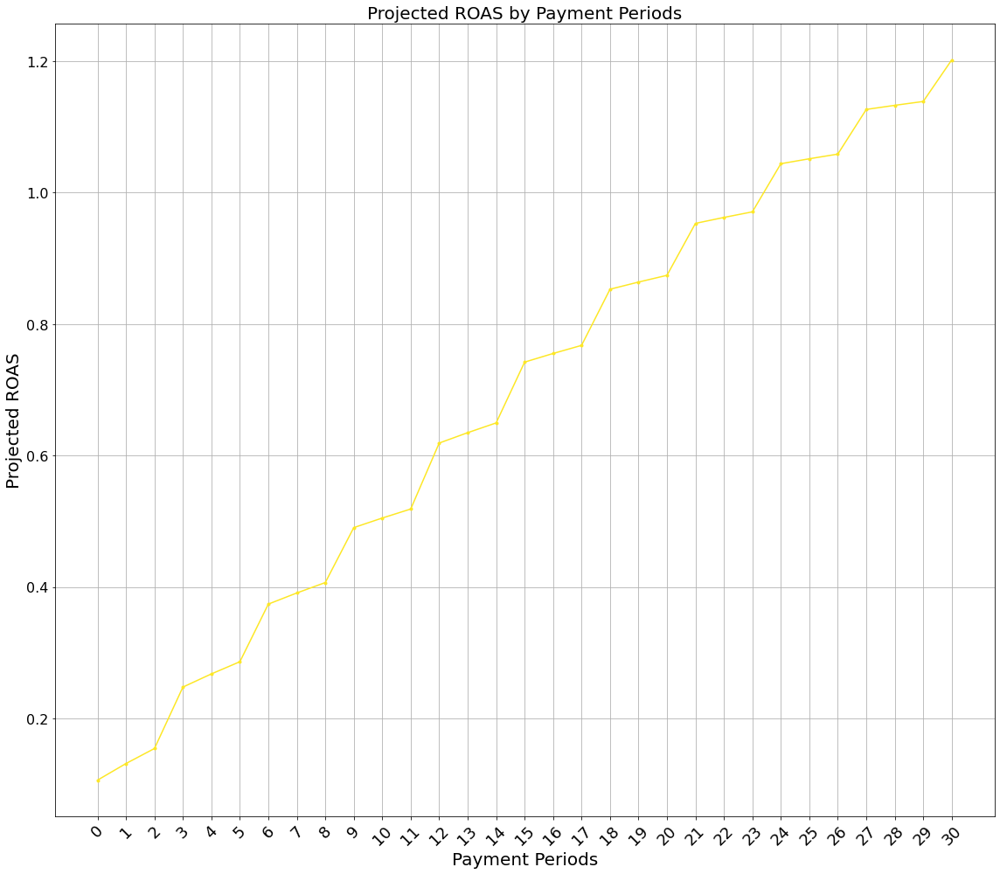

In [179]:
m0_values = [0.106] # above threshold
projections_without_increaase, projections_with_increase = extrapolate_cohorts_roas_given_m0_values(m0_values, 0.5, conservative_worse_m12_churn_monthly, conservative_worse_m12_churn_quarterly, payment_period_to_start_collecting_25_percent_more=12)
Analyzer.plot_wide_df(
    projections_with_increase.iloc[:, :31],
    title="Projected ROAS by Payment Periods",  
    x_label="Payment Periods",
    y_label="Projected ROAS",
    font_size=20, 
    add_legend=False)

In [180]:
projections_with_increase.iloc[0:1, 0:31]   

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
cohort_(0.106),0.106,0.131278,0.154154,0.24766,0.267678,0.286195,0.373933,0.390829,0.406712,0.490302,...,0.953274,0.96233,0.970842,1.0441,1.05162,1.05869,1.12668,1.13292,1.1388,1.20197


In [181]:
projections_without_increaase.index = ["m12_threshold_cohort_(0.106)"]
projections_without_increaase.iloc[0:1, 0:31]

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
m12_threshold_cohort_(0.106),0.106,0.131278,0.154154,0.24766,0.267678,0.286195,0.373933,0.390829,0.406712,0.490302,...,0.866333,0.873578,0.880388,0.938993,0.94501,0.950666,1.00505,1.01005,1.01475,1.06529


In [182]:
conservative_thresholds = pd.concat([conservative_thresholds, projections_without_increaase.iloc[0:1, 0:31]]) 
conservative_thresholds = pd.concat([conservative_thresholds, Analyzer.uncumulate_df_across_columns(projections_without_increaase.iloc[0:1, 0:31])])  
conservative_thresholds

,0,1,2,3,4,5,6,7,8,9,...,21,22,23,24,25,26,27,28,29,30
cohort_(0.133),0.133,0.164716,0.19342,0.30648,0.330641,0.35299,0.455175,0.474817,0.493281,0.587049,...,0.992021,0.999785,1.00708,1.07002,1.07647,1.08253,1.14095,1.1463,1.15134,1.20562
cohort_(0.133),0.133,0.0317164,0.0287033,0.11306,0.024161,0.022349,0.102185,0.0196425,0.0184639,0.0937676,...,0.0679183,0.00776452,0.00729865,0.0629394,0.00644908,0.00606214,0.0584124,0.00535651,0.00503512,0.0542841
cohort_(0.106),0.106,0.131278,0.154154,0.244262,0.263518,0.28133,0.362771,0.378426,0.393141,0.467873,...,0.790633,0.796821,0.802638,0.852801,0.857941,0.862772,0.909326,0.913595,0.917608,0.960872
cohort_(0.106),0.106,0.0252777,0.0228763,0.0901079,0.0192562,0.0178119,0.0814407,0.0156549,0.0147156,0.0747321,...,0.0541304,0.00618826,0.00581697,0.0501622,0.00513987,0.00483148,0.0465542,0.0042691,0.00401295,0.0432641
m3_threshold_cohort_(0.106),0.106,0.131278,0.154154,0.24766,0.267678,0.286195,0.370702,0.386976,0.402274,0.479816,...,0.814842,0.821275,0.827322,0.879361,0.884705,0.889727,0.938022,0.94246,0.946632,0.991513
m3_threshold_cohort_(0.106),0.106,0.0252777,0.0228763,0.0935062,0.0200179,0.0185166,0.084507,0.0162742,0.0152978,0.0775422,...,0.0561576,0.00643307,0.00604709,0.0520393,0.00534321,0.00502261,0.048295,0.00443798,0.0041717,0.0448807
m6_threshold_cohort_(0.106),0.106,0.131278,0.154154,0.24766,0.267678,0.286195,0.373933,0.390829,0.406712,0.487219,...,0.835055,0.841734,0.848012,0.902041,0.907589,0.912803,0.962945,0.967553,0.971884,1.01848
m6_threshold_cohort_(0.106),0.106,0.0252777,0.0228763,0.0935062,0.0200179,0.0185166,0.0877381,0.0168965,0.0158827,0.0805071,...,0.0583048,0.00667904,0.0062783,0.0540291,0.00554751,0.00521466,0.0501416,0.00460767,0.00433121,0.0465968
m9_threshold_cohort_(0.106),0.106,0.131278,0.154154,0.24766,0.267678,0.286195,0.373933,0.390829,0.406712,0.490302,...,0.851459,0.858394,0.864913,0.921011,0.926771,0.932186,0.984247,0.989032,0.993529,1.04191
m9_threshold_cohort_(0.106),0.106,0.0252777,0.0228763,0.0935062,0.0200179,0.0185166,0.0877381,0.0168965,0.0158827,0.0835903,...,0.0605378,0.00693484,0.00651875,0.0560983,0.00575996,0.00541437,0.0520619,0.00478413,0.00449709,0.0483813


In [184]:
conservative_thresholds.to_excel("roas_conservative_thresholds.xlsx")    

The analysis of the saved data along with out selected thresholds is presented in the notes. 